In [1]:
import tensorflow
import keras
import sys
import pandas as pd
import sklearn as sk
from keras.models import load_model, Model
from keras import layers 
from keras import models
import matplotlib.pyplot as plt
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import ResNet50, VGG16, InceptionV3
from keras import backend as K
from keras.callbacks import LambdaCallback
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers.normalization import BatchNormalization
from keras.applications.vgg16 import preprocess_input, decode_predictions
# from utils import make_parallel
import os
import sys
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from time import time
from keras.utils import to_categorical
from tqdm import tqdm
from sklearn.model_selection import train_test_split

Using TensorFlow backend.


In [2]:
train = r'C:\Users\deeplove\Desktop\Stanford\CS231\project\dogsvscats\train'
label = np.array([0] * 12500 + [1] * 12500)
data = np.zeros((25000, 224, 224, 3), dtype=np.uint8)

for i in tqdm(range(12500)):
    print(i)
    img = cv2.imread(train + '\\cat.' + str(i) + '.jpg')
    print(img)
    img = img[:, :, ::-1]
    img = cv2.resize(img, (224, 224))
    data[i] = img
    
for i in tqdm(range(12500)):
    img = cv2.imread(train + '\\dog.' + str(i) + '.jpg')
    img = img[:, :, ::-1]
    img = cv2.resize(img, (224, 224))
    data[i+12500] = img
    
print('Training Data Size = %.2f GB' % (sys.getsizeof(data)/1024**3))

  0%|▏                                                                             | 38/12500 [00:00<00:33, 377.24it/s]

0
[[[ 87 164 203]
  [ 87 164 203]
  [ 88 165 204]
  ...
  [122 201 240]
  [121 200 239]
  [120 199 238]]

 [[ 87 164 203]
  [ 87 164 203]
  [ 88 165 204]
  ...
  [123 202 241]
  [122 201 240]
  [120 199 238]]

 [[ 87 164 203]
  [ 87 164 203]
  [ 88 165 204]
  ...
  [123 202 241]
  [122 201 240]
  [121 200 239]]

 ...

 [[ 55 122 153]
  [ 55 122 153]
  [ 55 122 153]
  ...
  [  0   2   2]
  [  0   2   2]
  [  0   2   2]]

 [[ 54 121 152]
  [ 54 121 152]
  [ 54 121 152]
  ...
  [  0   2   2]
  [  0   2   2]
  [  0   2   2]]

 [[ 53 120 151]
  [ 53 120 151]
  [ 53 120 151]
  ...
  [  0   1   1]
  [  0   1   1]
  [  0   1   1]]]
1
[[[ 40  44  39]
  [ 40  44  39]
  [ 43  44  40]
  ...
  [173 204 207]
  [166 199 202]
  [163 198 201]]

 [[ 41  45  40]
  [ 41  45  40]
  [ 43  44  40]
  ...
  [169 200 203]
  [163 196 199]
  [159 194 197]]

 [[ 41  45  40]
  [ 41  45  40]
  [ 43  44  40]
  ...
  [166 195 199]
  [164 194 199]
  [162 194 199]]

 ...

 [[ 31  30  32]
  [ 29  28  30]
  [ 25  24  26]


  1%|▋                                                                            | 118/12500 [00:00<00:32, 385.39it/s]


71
[[[ 42  55  57]
  [ 44  57  59]
  [ 46  58  62]
  ...
  [142 141 145]
  [148 149 153]
  [154 155 159]]

 [[ 38  50  52]
  [ 39  52  54]
  [ 42  54  58]
  ...
  [142 143 147]
  [149 150 154]
  [154 155 159]]

 [[ 34  43  47]
  [ 35  46  50]
  [ 39  49  56]
  ...
  [130 130 136]
  [135 138 143]
  [137 140 145]]

 ...

 [[149 172 187]
  [153 176 191]
  [157 180 195]
  ...
  [ 21  18  10]
  [ 24  16   9]
  [ 23  15   8]]

 [[152 175 190]
  [160 183 198]
  [164 185 200]
  ...
  [ 23  17  12]
  [ 25  17  10]
  [ 24  15  11]]

 [[160 181 196]
  [168 189 204]
  [176 197 212]
  ...
  [ 21  15  10]
  [ 21  15  10]
  [ 21  14  11]]]
72
[[[122 117 114]
  [116 111 108]
  [107 102  99]
  ...
  [ 43  51  51]
  [ 42  50  50]
  [ 41  49  49]]

 [[118 113 110]
  [112 107 104]
  [105 100  97]
  ...
  [ 42  50  50]
  [ 41  49  49]
  [ 41  49  49]]

 [[114 109 106]
  [110 105 102]
  [104  99  96]
  ...
  [ 42  50  50]
  [ 43  48  49]
  [ 43  48  49]]

 ...

 [[ 21  23  23]
  [ 21  23  23]
  [ 21  23  2

  2%|█▏                                                                           | 196/12500 [00:00<00:32, 381.32it/s]


142
[[[ 73  84  88]
  [ 73  84  88]
  [ 73  84  88]
  ...
  [106 117 121]
  [106 117 121]
  [108 119 123]]

 [[ 73  84  88]
  [ 73  84  88]
  [ 73  84  88]
  ...
  [106 117 121]
  [106 117 121]
  [108 119 123]]

 [[ 73  84  88]
  [ 73  84  88]
  [ 73  84  88]
  ...
  [106 117 121]
  [106 117 121]
  [108 119 123]]

 ...

 [[ 84 101 104]
  [ 84 101 104]
  [ 84 101 104]
  ...
  [ 85 101 107]
  [ 83  99 105]
  [ 86 102 108]]

 [[ 81  98 101]
  [ 81  98 101]
  [ 81  98 101]
  ...
  [ 85 101 107]
  [ 85 101 107]
  [ 84 103 106]]

 [[ 81  98 101]
  [ 81  98 101]
  [ 81  98 101]
  ...
  [ 85 101 107]
  [ 85 101 107]
  [ 84 103 106]]]
143
[[[103 120  83]
  [103 120  83]
  [104 121  84]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[104 121  84]
  [104 121  84]
  [105 122  85]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 [[105 122  85]
  [105 122  85]
  [106 123  86]
  ...
  [  4   4   4]
  [  4   4   4]
  [  4   4   4]]

 ...

 [[119 123 152]
  [123 127 156]
  [125 127 

  2%|█▋                                                                           | 274/12500 [00:00<00:31, 383.12it/s]


214
[[[ 48  84  94]
  [ 50  86  96]
  [ 51  87  97]
  ...
  [178 176 175]
  [186 184 183]
  [183 181 180]]

 [[ 44  79  89]
  [ 44  80  90]
  [ 46  81  91]
  ...
  [251 249 248]
  [255 253 252]
  [252 250 249]]

 [[ 51  84  93]
  [ 49  85  93]
  [ 52  85  94]
  ...
  [255 255 254]
  [255 255 254]
  [255 255 254]]

 ...

 [[ 33  48  51]
  [ 12  27  30]
  [ 11  25  31]
  ...
  [151 167 184]
  [151 167 184]
  [150 166 183]]

 [[ 35  50  53]
  [ 16  31  34]
  [ 16  30  36]
  ...
  [151 167 184]
  [151 167 184]
  [150 166 183]]

 [[ 41  56  59]
  [ 20  35  38]
  [ 18  32  38]
  ...
  [151 167 184]
  [151 167 184]
  [150 166 183]]]
215
[[[108 105  90]
  [ 95  87  74]
  [ 84  65  58]
  ...
  [ 45  35  35]
  [ 43  33  33]
  [ 32  22  22]]

 [[ 64  61  47]
  [ 63  55  42]
  [ 69  50  43]
  ...
  [ 37  27  27]
  [ 40  30  30]
  [ 31  21  21]]

 [[ 60  58  47]
  [ 67  58  48]
  [ 80  60  55]
  ...
  [ 31  21  21]
  [ 40  30  30]
  [ 39  29  29]]

 ...

 [[191 189 218]
  [207 205 234]
  [213 211 

  3%|██▏                                                                          | 357/12500 [00:00<00:30, 393.82it/s]


[[[ 76  90 112]
  [ 78  93 112]
  [ 71  88 107]
  ...
  [104 102 121]
  [110 103 118]
  [110 103 118]]

 [[ 68  82 104]
  [ 72  86 108]
  [ 70  85 104]
  ...
  [105 103 122]
  [109 104 119]
  [111 104 119]]

 [[ 62  74  98]
  [ 66  79 101]
  [ 67  80 102]
  ...
  [108 108 126]
  [111 108 123]
  [112 107 122]]

 ...

 [[162 178 190]
  [162 178 190]
  [162 178 190]
  ...
  [172 185 201]
  [172 185 199]
  [172 185 199]]

 [[164 178 190]
  [164 178 190]
  [164 178 190]
  ...
  [172 185 201]
  [172 185 199]
  [172 185 199]]

 [[166 178 190]
  [167 179 191]
  [167 179 191]
  ...
  [172 185 201]
  [172 185 199]
  [172 185 199]]]
287
[[[184 185 219]
  [176 177 211]
  [172 173 207]
  ...
  [ 48  50  51]
  [ 48  50  51]
  [ 48  51  56]]

 [[187 188 222]
  [179 180 214]
  [176 177 211]
  ...
  [ 50  52  53]
  [ 50  52  53]
  [ 51  54  59]]

 [[193 192 226]
  [185 184 218]
  [181 180 214]
  ...
  [ 54  56  57]
  [ 54  56  57]
  [ 55  58  63]]

 ...

 [[125 114 122]
  [126 115 123]
  [127 116 124]

  3%|██▍                                                                          | 395/12500 [00:01<00:31, 386.33it/s]


361
[[[ 22  31  68]
  [ 21  31  65]
  [ 21  32  64]
  ...
  [ 81 107 154]
  [ 61  86 136]
  [ 88 113 163]]

 [[ 19  27  64]
  [ 22  32  66]
  [ 27  38  68]
  ...
  [ 56  82 129]
  [ 64  89 139]
  [104 129 179]]

 [[ 11  17  52]
  [ 19  28  61]
  [ 26  36  66]
  ...
  [ 46  72 119]
  [ 71  96 146]
  [102 127 177]]

 ...

 [[195 189 190]
  [190 184 185]
  [188 182 183]
  ...
  [ 66  69  83]
  [ 57  63  76]
  [ 63  69  82]]

 [[197 191 192]
  [192 186 187]
  [190 184 185]
  ...
  [ 62  65  79]
  [ 55  61  74]
  [ 62  68  81]]

 [[199 193 194]
  [194 188 189]
  [191 185 186]
  ...
  [ 59  62  76]
  [ 53  59  72]
  [ 61  67  80]]]
362
[[[61 57 52]
  [61 57 52]
  [61 57 52]
  ...
  [22 33 37]
  [22 33 37]
  [22 33 37]]

 [[61 57 52]
  [61 57 52]
  [61 57 52]
  ...
  [22 33 37]
  [22 33 37]
  [22 33 37]]

 [[61 57 52]
  [61 57 52]
  [61 57 52]
  ...
  [22 33 37]
  [22 33 37]
  [22 33 37]]

 ...

 [[22 32 42]
  [22 32 42]
  [22 32 42]
  ...
  [19 28 32]
  [19 28 32]
  [19 28 32]]

 [[23 33 43

  4%|██▉                                                                          | 471/12500 [00:01<00:31, 379.36it/s]


432
[[[116 159 162]
  [113 158 162]
  [116 163 171]
  ...
  [103 130 134]
  [100 125 127]
  [ 91 114 116]]

 [[114 152 156]
  [108 150 155]
  [113 156 165]
  ...
  [100 127 131]
  [ 98 123 125]
  [ 87 110 112]]

 [[ 61  93  98]
  [ 55  91  97]
  [ 61  97 107]
  ...
  [111 138 142]
  [112 135 137]
  [ 93 114 116]]

 ...

 [[101 100 168]
  [106 105 173]
  [ 98  97 165]
  ...
  [ 96  90 155]
  [115 109 174]
  [100  94 159]]

 [[106 105 173]
  [111 110 178]
  [103 102 170]
  ...
  [ 97  90 157]
  [116 109 176]
  [101  94 161]]

 [[108 107 175]
  [114 113 181]
  [106 105 173]
  ...
  [ 96  91 160]
  [115 111 177]
  [100  96 162]]]
433
[[[ 27  32  47]
  [ 26  31  46]
  [ 25  29  47]
  ...
  [ 29  24  21]
  [ 29  24  21]
  [ 29  24  21]]

 [[ 27  32  47]
  [ 27  32  47]
  [ 26  30  48]
  ...
  [ 29  24  21]
  [ 29  24  21]
  [ 29  24  21]]

 [[ 28  33  48]
  [ 27  32  47]
  [ 27  31  49]
  ...
  [ 29  24  21]
  [ 29  24  21]
  [ 29  24  21]]

 ...

 [[136 143 158]
  [135 144 158]
  [137 144 

  4%|███▍                                                                         | 548/12500 [00:01<00:31, 375.43it/s]


502
[[[144 133 113]
  [145 134 114]
  [145 134 114]
  ...
  [149 156 165]
  [137 144 153]
  [135 144 153]]

 [[136 128 111]
  [137 129 112]
  [139 131 114]
  ...
  [150 157 166]
  [137 144 153]
  [135 144 153]]

 [[141 135 128]
  [141 135 128]
  [141 135 128]
  ...
  [152 159 168]
  [137 144 153]
  [135 144 153]]

 ...

 [[ 67  73  56]
  [ 72  78  61]
  [ 70  76  59]
  ...
  [ 98 102  73]
  [ 97 101  72]
  [ 86  90  61]]

 [[ 73  78  63]
  [ 77  82  67]
  [ 72  77  62]
  ...
  [104 109  78]
  [100 105  74]
  [ 87  92  61]]

 [[ 79  84  69]
  [ 81  86  71]
  [ 74  79  64]
  ...
  [111 116  85]
  [112 117  86]
  [ 97 102  71]]]
503
[[[  6   9  13]
  [ 11  14  18]
  [ 15  17  25]
  ...
  [ 69  83  81]
  [ 62  76  74]
  [ 58  72  70]]

 [[  5   8  12]
  [ 13  16  21]
  [ 23  25  33]
  ...
  [ 79  92  90]
  [ 74  87  85]
  [ 72  85  83]]

 [[  4   7  12]
  [ 13  16  21]
  [ 26  28  36]
  ...
  [ 59  70  67]
  [ 55  66  63]
  [ 53  64  61]]

 ...

 [[181 168 154]
  [179 166 152]
  [178 165 

  5%|███▊                                                                         | 625/12500 [00:01<00:31, 374.63it/s]

570
[[[108 110 110]
  [110 112 112]
  [113 115 115]
  ...
  [251 249 255]
  [245 244 253]
  [239 238 247]]

 [[113 115 115]
  [113 115 115]
  [112 114 114]
  ...
  [252 250 255]
  [245 244 253]
  [240 239 248]]

 [[115 117 117]
  [113 115 115]
  [110 112 112]
  ...
  [253 251 255]
  [247 246 255]
  [241 240 249]]

 ...

 [[ 70  70  70]
  [ 67  67  67]
  [ 65  65  65]
  ...
  [ 82 130 178]
  [ 81 129 177]
  [ 80 128 176]]

 [[ 65  65  65]
  [ 63  63  63]
  [ 63  63  63]
  ...
  [ 81 129 177]
  [ 80 128 176]
  [ 79 127 175]]

 [[ 61  61  61]
  [ 60  60  60]
  [ 61  61  61]
  ...
  [ 79 127 175]
  [ 79 127 175]
  [ 78 126 174]]]
571
[[[ 86  75 113]
  [ 86  75 113]
  [ 87  76 114]
  ...
  [ 80  77  79]
  [ 79  75  80]
  [ 78  74  79]]

 [[ 86  75 113]
  [ 86  75 113]
  [ 86  75 113]
  ...
  [ 72  69  71]
  [ 71  67  72]
  [ 70  66  71]]

 [[ 85  74 112]
  [ 86  75 113]
  [ 86  75 113]
  ...
  [ 64  63  65]
  [ 63  62  64]
  [ 62  61  63]]

 ...

 [[214 207 210]
  [213 206 209]
  [207 200 2

  6%|████▎                                                                        | 704/12500 [00:01<00:30, 382.48it/s]

[[[158 170 174]
  [158 170 174]
  [158 170 174]
  ...
  [ 23  24  50]
  [ 22  26  51]
  [ 23  27  52]]

 [[156 168 172]
  [156 168 172]
  [157 169 173]
  ...
  [ 21  22  48]
  [ 20  24  49]
  [ 21  25  50]]

 [[155 167 171]
  [155 167 171]
  [156 168 172]
  ...
  [ 22  23  49]
  [ 20  24  49]
  [ 21  25  50]]

 ...

 [[  4   8   9]
  [  4   8   9]
  [  4   8   9]
  ...
  [ 48  49  83]
  [ 65  66 100]
  [ 79  80 114]]

 [[  4   8   9]
  [  4   8   9]
  [  4   8   9]
  ...
  [ 62  64  95]
  [ 91  93 123]
  [118 120 151]]

 [[  4   8   9]
  [  4   8   9]
  [  4   8   9]
  ...
  [ 41  43  73]
  [ 65  68  96]
  [ 84  86 116]]]
642
[[[240 245 244]
  [241 246 245]
  [243 248 247]
  ...
  [114 118 129]
  [115 121 132]
  [119 125 136]]

 [[242 247 246]
  [243 248 247]
  [245 250 249]
  ...
  [114 118 129]
  [115 121 132]
  [119 125 136]]

 [[239 244 243]
  [240 245 244]
  [241 246 245]
  ...
  [114 118 129]
  [115 121 132]
  [119 125 136]]

 ...

 [[ 58  65  68]
  [ 61  68  71]
  [ 62  68  73]


  6%|████▊                                                                        | 783/12500 [00:02<00:30, 383.82it/s]


714
[[[188 193 192]
  [191 196 195]
  [197 202 201]
  ...
  [113 128 147]
  [114 129 148]
  [115 130 149]]

 [[196 201 200]
  [198 203 202]
  [201 206 205]
  ...
  [116 131 150]
  [117 132 151]
  [119 134 153]]

 [[198 203 202]
  [198 203 202]
  [199 204 203]
  ...
  [117 132 151]
  [118 133 152]
  [119 134 153]]

 ...

 [[153  48  21]
  [154  49  22]
  [155  50  23]
  ...
  [117 116 118]
  [117 116 118]
  [117 116 118]]

 [[153  48  21]
  [154  49  22]
  [156  51  24]
  ...
  [115 114 116]
  [115 114 116]
  [115 114 116]]

 [[154  49  22]
  [155  50  23]
  [156  51  24]
  ...
  [116 115 117]
  [116 115 117]
  [116 115 117]]]
715
[[[ 74  89  68]
  [ 76  91  70]
  [ 78  93  72]
  ...
  [ 44  52  41]
  [ 43  51  40]
  [ 42  50  39]]

 [[ 75  90  69]
  [ 77  92  71]
  [ 79  94  73]
  ...
  [ 44  52  41]
  [ 43  51  40]
  [ 42  50  39]]

 [[ 77  92  71]
  [ 79  94  73]
  [ 80  95  74]
  ...
  [ 44  52  41]
  [ 43  51  40]
  [ 42  50  39]]

 ...

 [[ 91  81  64]
  [103  96  77]
  [119 112 

  7%|█████                                                                        | 822/12500 [00:02<00:31, 370.60it/s]


787
[[[123 132  92]
  [130 135  96]
  [124 122  82]
  ...
  [147 145 144]
  [137 135 135]
  [131 130 132]]

 [[122 130  93]
  [107 111  75]
  [112 109  71]
  ...
  [154 154 148]
  [ 77  78  76]
  [ 96  97  95]]

 [[112 117  85]
  [ 94  97  65]
  [214 209 176]
  ...
  [134 138 126]
  [188 191 182]
  [159 164 155]]

 ...

 [[ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [ 61  62  60]
  [ 61  62  60]
  [ 62  63  61]]

 [[ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [ 62  63  61]
  [ 62  63  61]
  [ 62  63  61]]

 [[ 61  61  61]
  [ 61  61  61]
  [ 61  61  61]
  ...
  [ 59  60  58]
  [ 58  59  57]
  [ 58  59  57]]]
788
[[[162 109  52]
  [163 110  53]
  [164 111  54]
  ...
  [ 62  69  72]
  [ 72  81  85]
  [ 77  86  90]]

 [[162 109  52]
  [163 110  53]
  [164 111  54]
  ...
  [ 57  64  67]
  [ 64  73  77]
  [ 68  77  81]]

 [[162 109  52]
  [163 110  53]
  [164 111  54]
  ...
  [ 47  54  57]
  [ 49  58  62]
  [ 51  60  64]]

 ...

 [[103 107 118]
  [105 109 120]
  [104 111 

  7%|█████▌                                                                       | 899/12500 [00:02<00:30, 374.50it/s]


852
[[[164 161 146]
  [142 139 124]
  [133 128 113]
  ...
  [166 161 162]
  [162 157 158]
  [162 157 158]]

 [[109 106  91]
  [136 133 118]
  [161 156 141]
  ...
  [143 138 137]
  [159 154 153]
  [184 178 179]]

 [[104 101  86]
  [132 129 114]
  [144 138 125]
  ...
  [113 106 103]
  [137 130 127]
  [164 156 156]]

 ...

 [[ 43  47  48]
  [ 42  46  47]
  [ 40  44  45]
  ...
  [128 119 106]
  [113 104  95]
  [100  91  87]]

 [[ 40  44  45]
  [ 38  42  43]
  [ 37  41  42]
  ...
  [125 115 105]
  [130 121 112]
  [124 115 111]]

 [[ 44  48  49]
  [ 41  45  46]
  [ 38  42  43]
  ...
  [132 122 112]
  [143 135 128]
  [137 128 124]]]
853
[[[222 236 230]
  [232 246 240]
  [218 230 224]
  ...
  [235 241 236]
  [235 241 236]
  [235 241 236]]

 [[235 249 243]
  [232 244 238]
  [235 247 241]
  ...
  [235 241 236]
  [235 241 236]
  [235 241 236]]

 [[225 237 231]
  [221 233 227]
  [225 235 229]
  ...
  [235 241 236]
  [235 241 236]
  [235 241 236]]

 ...

 [[221 231 225]
  [218 228 222]
  [246 253 

  8%|██████                                                                       | 980/12500 [00:02<00:29, 386.86it/s]


925
[[[185 204 209]
  [187 205 206]
  [198 212 210]
  ...
  [164 160 189]
  [141 138 164]
  [118 115 141]]

 [[185 204 209]
  [187 205 206]
  [198 212 210]
  ...
  [168 164 193]
  [150 146 175]
  [133 130 156]]

 [[186 205 210]
  [186 204 205]
  [198 212 210]
  ...
  [170 166 195]
  [167 163 192]
  [164 160 189]]

 ...

 [[171 190 195]
  [171 190 195]
  [172 191 196]
  ...
  [216 228 222]
  [227 235 234]
  [232 240 239]]

 [[171 190 195]
  [171 190 195]
  [172 191 196]
  ...
  [215 227 221]
  [226 234 233]
  [231 239 238]]

 [[170 189 194]
  [171 190 195]
  [171 190 195]
  ...
  [216 228 222]
  [228 236 235]
  [233 241 240]]]
926
[[[ 33  43  13]
  [ 33  43  13]
  [ 33  43  13]
  ...
  [ 18  30   2]
  [ 18  30   2]
  [ 17  29   1]]

 [[ 34  44  14]
  [ 34  44  14]
  [ 34  44  14]
  ...
  [ 18  30   2]
  [ 18  30   2]
  [ 17  29   1]]

 [[ 35  45  15]
  [ 35  45  15]
  [ 35  45  15]
  ...
  [ 18  30   2]
  [ 18  30   2]
  [ 17  29   1]]

 ...

 [[126 127 111]
  [127 128 112]
  [127 128 

  8%|██████▍                                                                     | 1058/12500 [00:02<00:30, 376.40it/s]


999
[[[110 138 199]
  [111 139 200]
  [111 139 204]
  ...
  [ 60  66  79]
  [ 60  66  79]
  [ 60  66  79]]

 [[109 137 198]
  [110 138 199]
  [111 139 203]
  ...
  [ 60  66  79]
  [ 60  66  79]
  [ 60  66  79]]

 [[108 136 197]
  [110 138 199]
  [112 140 204]
  ...
  [ 59  65  78]
  [ 59  65  78]
  [ 59  65  78]]

 ...

 [[192 193 191]
  [186 187 185]
  [179 180 178]
  ...
  [120 124 152]
  [122 127 152]
  [125 130 155]]

 [[192 193 191]
  [188 189 187]
  [182 183 181]
  ...
  [117 122 147]
  [118 123 148]
  [122 126 151]]

 [[110 111 109]
  [107 108 106]
  [103 104 102]
  ...
  [ 58  63  88]
  [ 59  64  89]
  [ 62  66  90]]]
1000
[[[ 75 112 140]
  [ 75 112 140]
  [ 79 116 144]
  ...
  [ 54  77 127]
  [ 58  77 120]
  [ 32  49  88]]

 [[ 71 108 136]
  [ 72 109 137]
  [ 78 115 143]
  ...
  [ 56  79 129]
  [ 68  87 130]
  [ 22  39  78]]

 [[ 53  88 114]
  [ 55  90 116]
  [ 63  98 124]
  ...
  [ 44  67 117]
  [ 70  89 134]
  [  3  21  62]]

 ...

 [[ 68  78  85]
  [ 55  65  72]
  [ 43  54

  9%|██████▉                                                                     | 1134/12500 [00:02<00:30, 368.41it/s]


1069
[[[191 199 212]
  [191 199 212]
  [192 200 213]
  ...
  [109 122 114]
  [108 121 113]
  [107 120 112]]

 [[191 199 212]
  [192 200 213]
  [192 200 213]
  ...
  [107 119 113]
  [106 119 111]
  [105 117 111]]

 [[192 200 213]
  [192 200 213]
  [193 201 214]
  ...
  [106 120 116]
  [104 118 112]
  [103 117 113]]

 ...

 [[ 29  73 126]
  [ 28  73 124]
  [ 28  72 119]
  ...
  [120 157 149]
  [119 158 150]
  [119 162 153]]

 [[ 34  77 128]
  [ 35  78 127]
  [ 45  90 134]
  ...
  [106 144 138]
  [105 146 139]
  [105 149 142]]

 [[ 40  83 132]
  [ 41  85 132]
  [ 52  94 139]
  ...
  [ 94 131 127]
  [ 92 133 128]
  [ 94 138 132]]]
1070
[[[12 17 16]
  [11 16 15]
  [ 9 14 13]
  ...
  [ 5  7  7]
  [ 5  7  7]
  [ 5  7  7]]

 [[12 17 16]
  [11 16 15]
  [ 9 14 13]
  ...
  [ 5  7  7]
  [ 5  7  7]
  [ 5  7  7]]

 [[12 17 16]
  [11 16 15]
  [ 9 14 13]
  ...
  [ 5  7  7]
  [ 5  7  7]
  [ 5  7  7]]

 ...

 [[51 74 76]
  [48 71 73]
  [47 70 72]
  ...
  [ 6  8  8]
  [ 6  8  8]
  [ 6  8  8]]

 [[51 74 

  9%|███████▏                                                                    | 1173/12500 [00:03<00:30, 371.71it/s]


1137
[[[ 49  44  41]
  [ 50  45  42]
  [ 51  46  43]
  ...
  [ 25  22  18]
  [ 25  22  17]
  [ 24  21  16]]

 [[ 47  42  39]
  [ 48  43  40]
  [ 49  44  41]
  ...
  [ 23  22  18]
  [ 25  22  17]
  [ 25  22  17]]

 [[ 45  40  37]
  [ 46  41  38]
  [ 48  43  40]
  ...
  [ 24  23  19]
  [ 24  24  18]
  [ 23  23  17]]

 ...

 [[125 129 123]
  [124 132 122]
  [127 131 125]
  ...
  [137 133 115]
  [136 134 116]
  [139 135 117]]

 [[126 130 124]
  [127 131 125]
  [128 132 126]
  ...
  [135 132 117]
  [136 134 116]
  [137 135 117]]

 [[128 132 126]
  [129 133 127]
  [130 134 128]
  ...
  [135 132 117]
  [136 134 116]
  [137 135 117]]]
1138
[[[191 123  70]
  [191 123  70]
  [189 122  73]
  ...
  [166 129  91]
  [166 129  91]
  [167 130  92]]

 [[193 127  74]
  [190 125  74]
  [186 120  71]
  ...
  [162 126  90]
  [163 127  91]
  [165 129  93]]

 [[196 136  84]
  [194 136  84]
  [192 133  83]
  ...
  [175 142 109]
  [168 135 102]
  [163 130  97]]

 ...

 [[ 89  59  40]
  [ 93  63  44]
  [ 96  6

 10%|███████▌                                                                    | 1250/12500 [00:03<00:30, 374.31it/s]


1208
[[[ 12  19  16]
  [ 12  19  16]
  [ 12  19  16]
  ...
  [  3   7   8]
  [  3   7   8]
  [  3   7   8]]

 [[ 12  19  16]
  [ 12  19  16]
  [ 12  19  16]
  ...
  [  3   7   8]
  [  3   7   8]
  [  3   7   8]]

 [[ 12  18  17]
  [ 12  18  17]
  [ 12  18  17]
  ...
  [  3   7   8]
  [  3   7   8]
  [  3   7   8]]

 ...

 [[ 86 126 138]
  [ 86 126 138]
  [ 86 126 138]
  ...
  [ 48  77  84]
  [ 47  76  83]
  [ 46  75  82]]

 [[ 86 126 138]
  [ 86 126 138]
  [ 85 125 137]
  ...
  [ 50  79  86]
  [ 48  77  84]
  [ 45  74  81]]

 [[ 86 126 138]
  [ 85 125 137]
  [ 85 125 137]
  ...
  [ 50  79  86]
  [ 48  77  84]
  [ 44  73  80]]]
1209
[[[140 132 132]
  [144 136 136]
  [138 130 130]
  ...
  [ 17  17  17]
  [ 13  13  13]
  [  8   8   8]]

 [[140 132 132]
  [144 136 136]
  [138 130 130]
  ...
  [ 15  15  15]
  [ 11  11  11]
  [  8   8   8]]

 [[139 134 133]
  [143 138 137]
  [137 132 131]
  ...
  [ 11  11  11]
  [  9   9   9]
  [  8   8   8]]

 ...

 [[ 66  47  39]
  [103  84  76]
  [120 10

 11%|████████                                                                    | 1326/12500 [00:03<00:29, 374.69it/s]


1279
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
1280
[[[195 211 217]
  [212 228 234]
  [205 219 225]
  ...
  [  5   8  13]
  [  6   9  14]
  [  6   9  14]]

 [[204 220 227]
  [211 227 233]
  [201 217 224]
  ...
  [  5   8  13]
  [  6   9  14]
  [  6   9  14]]

 [[165 182 191]
  [184 202 209]
  [191 208 217]
  ...
  [  5   8  13]
  [  5   8  13]
  [  6   9  14]]

 ...

 [[136 158 164]
  [166 187 195]
  [176 19

 11%|████████▌                                                                   | 1407/12500 [00:03<00:28, 385.08it/s]


1350
[[[ 79  85  90]
  [ 78  84  89]
  [ 52  58  63]
  ...
  [ 45  50  59]
  [ 43  45  55]
  [ 39  41  51]]

 [[ 92  98 103]
  [ 86  92  97]
  [ 51  57  62]
  ...
  [ 31  36  45]
  [ 32  34  44]
  [ 34  36  46]]

 [[ 99 105 110]
  [ 95 101 106]
  [ 51  57  62]
  ...
  [ 28  33  42]
  [ 28  32  43]
  [ 33  37  48]]

 ...

 [[215 218 223]
  [216 219 224]
  [216 219 224]
  ...
  [149 125 119]
  [150 123 119]
  [169 142 138]]

 [[215 218 223]
  [217 220 225]
  [217 220 225]
  ...
  [172 147 143]
  [151 123 122]
  [173 145 144]]

 [[206 209 214]
  [212 215 220]
  [218 221 226]
  ...
  [109  84  80]
  [ 65  37  36]
  [ 77  49  48]]]
1351
[[[ 62  79  92]
  [ 62  79  92]
  [ 63  80  93]
  ...
  [ 91 108 121]
  [ 90 107 120]
  [ 89 106 119]]

 [[ 62  79  92]
  [ 63  80  93]
  [ 63  80  93]
  ...
  [ 92 109 122]
  [ 91 108 121]
  [ 90 107 120]]

 [[ 63  80  93]
  [ 64  81  94]
  [ 64  81  94]
  ...
  [ 92 109 122]
  [ 92 109 122]
  [ 91 108 121]]

 ...

 [[ 77  89  95]
  [ 77  89  95]
  [ 77  8

 12%|█████████                                                                   | 1486/12500 [00:03<00:29, 374.39it/s]


1423
[[[ 87 125 179]
  [ 87 126 178]
  [ 90 127 177]
  ...
  [120 122 132]
  [122 122 136]
  [122 122 136]]

 [[ 84 126 179]
  [ 85 128 179]
  [ 87 129 176]
  ...
  [121 123 133]
  [122 122 136]
  [122 122 136]]

 [[ 80 129 179]
  [ 80 129 177]
  [ 82 131 175]
  ...
  [121 123 133]
  [122 122 136]
  [122 122 136]]

 ...

 [[ 21  68 112]
  [ 23  72 118]
  [ 21  70 120]
  ...
  [  4  50  97]
  [  7  45  93]
  [ 10  43  92]]

 [[ 24  73 119]
  [ 21  71 117]
  [ 19  70 120]
  ...
  [ 12  60 108]
  [ 17  57 106]
  [ 13  48  98]]

 [[ 24  73 119]
  [ 21  70 118]
  [ 19  70 120]
  ...
  [ 11  60 108]
  [ 16  57 106]
  [ 11  48  98]]]
1424
[[[142 163 178]
  [132 153 168]
  [121 144 160]
  ...
  [ 23  36  50]
  [ 24  37  51]
  [ 26  39  53]]

 [[140 163 179]
  [138 161 177]
  [137 159 177]
  ...
  [ 53  66  80]
  [ 54  67  81]
  [ 56  69  83]]

 [[135 159 177]
  [141 167 184]
  [146 171 191]
  ...
  [ 53  66  80]
  [ 54  67  81]
  [ 55  68  82]]

 ...

 [[203 227 245]
  [197 221 239]
  [187 21

 12%|█████████▎                                                                  | 1524/12500 [00:04<00:29, 374.14it/s]


1492
[[[126 129 134]
  [126 129 134]
  [125 128 133]
  ...
  [213 227 239]
  [229 243 249]
  [238 250 252]]

 [[125 128 133]
  [125 128 133]
  [124 127 132]
  ...
  [213 227 239]
  [229 243 249]
  [238 250 252]]

 [[124 127 132]
  [124 127 132]
  [123 126 131]
  ...
  [213 227 239]
  [229 243 249]
  [239 251 253]]

 ...

 [[132 141 150]
  [148 157 166]
  [152 161 170]
  ...
  [103 118 134]
  [ 98 113 129]
  [124 139 155]]

 [[131 140 149]
  [147 156 165]
  [147 156 165]
  ...
  [110 125 141]
  [ 95 110 126]
  [118 133 149]]

 [[155 164 173]
  [155 164 173]
  [145 154 163]
  ...
  [118 133 149]
  [ 95 110 126]
  [113 128 144]]]
1493
[[[ 79  26 189]
  [ 79  26 189]
  [ 77  24 187]
  ...
  [ 82  34 194]
  [ 84  36 194]
  [ 85  37 195]]

 [[ 77  24 187]
  [ 76  23 186]
  [ 75  22 185]
  ...
  [ 84  36 196]
  [ 85  37 197]
  [ 86  38 196]]

 [[ 75  22 185]
  [ 74  21 184]
  [ 73  20 183]
  ...
  [ 86  36 198]
  [ 86  36 198]
  [ 86  36 197]]

 ...

 [[ 51  12 121]
  [ 51  12 121]
  [ 51  1

 13%|█████████▊                                                                  | 1607/12500 [00:04<00:27, 389.58it/s]


1567
[[[ 87 100 116]
  [119 132 148]
  [115 128 144]
  ...
  [230 238 245]
  [119 127 134]
  [145 153 160]]

 [[ 80  93 109]
  [122 135 151]
  [125 138 154]
  ...
  [207 215 222]
  [101 109 116]
  [147 155 162]]

 [[ 73  86 102]
  [120 133 149]
  [131 144 160]
  ...
  [210 218 225]
  [119 127 134]
  [152 160 167]]

 ...

 [[216 228 234]
  [227 239 245]
  [231 243 249]
  ...
  [223 220 236]
  [224 221 236]
  [236 233 248]]

 [[199 213 225]
  [202 217 226]
  [196 211 220]
  ...
  [217 214 229]
  [220 217 232]
  [236 234 246]]

 [[193 214 235]
  [189 211 229]
  [181 201 218]
  ...
  [221 222 232]
  [227 228 238]
  [240 241 251]]]
1568
[[[252 254 255]
  [252 254 255]
  [254 254 254]
  ...
  [253 253 253]
  [253 253 253]
  [253 253 253]]

 [[252 254 255]
  [252 254 255]
  [254 254 254]
  ...
  [253 253 253]
  [253 253 253]
  [253 253 253]]

 [[252 254 255]
  [252 254 255]
  [254 254 254]
  ...
  [253 253 253]
  [253 253 253]
  [253 253 253]]

 ...

 [[165 157 174]
  [162 154 171]
  [157 15

 13%|██████████▎                                                                 | 1686/12500 [00:04<00:28, 384.95it/s]


1640
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
1641
[[[150 138 158]
  [150 138 158]
  [150 138 158]
  ...
  [121 140 148]
  [122 141 149]
  [122 141 149]]

 [[152 140 160]
  [152 140 160]
  [151 139 159]
  ...
  [120 139 147]
  [120 139 147]
  [120 139 147]]

 [[154 142 162]
  [154 142 162]
  [153 141 161]
  ...
  [120 139 146]
  [119 138 145]
  [118 137 144]]

 ...

 [[ 98 114 150]
  [ 96 112 148]
  [ 94 11

 14%|██████████▋                                                                 | 1768/12500 [00:04<00:27, 391.47it/s]


1712
[[[ 35  54  59]
  [ 45  64  69]
  [ 42  61  66]
  ...
  [156 162 151]
  [155 161 150]
  [155 161 150]]

 [[ 35  54  59]
  [ 44  63  68]
  [ 42  61  66]
  ...
  [155 161 150]
  [154 160 149]
  [154 160 149]]

 [[ 35  54  59]
  [ 44  63  68]
  [ 42  61  66]
  ...
  [153 159 148]
  [153 159 148]
  [152 158 147]]

 ...

 [[ 74  95  93]
  [ 74  95  93]
  [ 72  93  91]
  ...
  [136 149 147]
  [128 141 139]
  [125 138 136]]

 [[ 77  98  96]
  [ 76  97  95]
  [ 75  96  94]
  ...
  [104 117 115]
  [104 117 115]
  [107 120 118]]

 [[ 61  82  80]
  [ 64  85  83]
  [ 69  90  88]
  ...
  [ 95 108 106]
  [ 96 109 107]
  [ 96 109 107]]]
1713
[[[ 22  31  28]
  [ 22  31  28]
  [ 23  32  29]
  ...
  [135 136 127]
  [127 128 119]
  [ 78  79  70]]

 [[ 22  31  28]
  [ 22  31  28]
  [ 23  32  29]
  ...
  [129 130 121]
  [132 133 124]
  [ 92  93  84]]

 [[ 22  31  28]
  [ 22  31  28]
  [ 23  32  29]
  ...
  [114 115 105]
  [133 134 124]
  [106 107  97]]

 ...

 [[ 98  94  93]
  [ 98  94  93]
  [ 97  9

 15%|███████████▏                                                                | 1846/12500 [00:04<00:28, 372.69it/s]


1784
[[[ 15  20  19]
  [ 16  21  20]
  [ 17  22  21]
  ...
  [ 38  39  35]
  [ 38  39  35]
  [ 38  39  35]]

 [[ 15  20  19]
  [ 16  21  20]
  [ 17  22  21]
  ...
  [ 37  38  34]
  [ 37  38  34]
  [ 37  38  34]]

 [[ 16  21  20]
  [ 17  22  21]
  [ 18  23  22]
  ...
  [ 36  37  35]
  [ 36  37  35]
  [ 36  37  35]]

 ...

 [[  6   8   8]
  [  6   8   8]
  [  6   8   8]
  ...
  [ 56  82  99]
  [ 66  92 109]
  [ 74 100 117]]

 [[  7   9   9]
  [  6   8   8]
  [  5   7   7]
  ...
  [ 64  90 107]
  [ 73  99 116]
  [ 80 106 123]]

 [[  8  10  10]
  [  6   8   8]
  [  4   6   6]
  ...
  [ 67  93 110]
  [ 76 102 119]
  [ 82 108 125]]]
1785
[[[250 245 242]
  [250 245 242]
  [248 243 240]
  ...
  [218 207 227]
  [218 207 227]
  [218 207 227]]

 [[249 244 241]
  [249 244 241]
  [249 244 241]
  ...
  [218 207 227]
  [216 208 225]
  [218 207 227]]

 [[244 241 237]
  [245 242 238]
  [245 242 238]
  ...
  [217 209 226]
  [215 210 225]
  [217 209 226]]

 ...

 [[252 252 252]
  [252 252 252]
  [252 25

 15%|███████████▍                                                                | 1884/12500 [00:04<00:28, 367.55it/s]

1850
[[[45 25 44]
  [47 27 46]
  [49 29 48]
  ...
  [15 17 48]
  [15 17 48]
  [15 17 48]]

 [[44 24 43]
  [46 26 45]
  [49 29 48]
  ...
  [16 18 49]
  [16 18 49]
  [16 18 49]]

 [[43 23 42]
  [45 25 44]
  [48 28 47]
  ...
  [16 18 49]
  [16 18 49]
  [16 18 49]]

 ...

 [[ 9 14 13]
  [10 15 14]
  [12 17 16]
  ...
  [13 16 21]
  [13 16 21]
  [13 16 21]]

 [[ 9 14 13]
  [11 16 15]
  [12 17 16]
  ...
  [14 17 22]
  [14 17 22]
  [14 17 22]]

 [[ 9 14 13]
  [11 16 15]
  [12 17 16]
  ...
  [14 17 22]
  [14 17 22]
  [14 17 22]]]
1851
[[[177 208 211]
  [176 207 210]
  [174 205 208]
  ...
  [136 164 175]
  [132 163 172]
  [135 166 175]]

 [[176 207 210]
  [174 205 208]
  [171 202 205]
  ...
  [137 165 176]
  [133 164 173]
  [135 166 175]]

 [[173 204 207]
  [171 202 205]
  [169 200 203]
  ...
  [138 166 177]
  [135 165 176]
  [136 166 177]]

 ...

 [[227 245 244]
  [227 245 244]
  [226 244 243]
  ...
  [ 51  49 139]
  [ 56  54 144]
  [ 60  58 148]]

 [[228 246 245]
  [227 245 244]
  [226 244 243

 16%|███████████▉                                                                | 1959/12500 [00:05<00:28, 366.88it/s]

[[[193 201 208]
  [190 198 205]
  [187 195 202]
  ...
  [146 139 136]
  [146 139 136]
  [146 139 136]]

 [[192 200 207]
  [189 197 204]
  [186 194 201]
  ...
  [146 139 136]
  [146 139 136]
  [146 139 136]]

 [[190 198 205]
  [188 196 203]
  [186 194 201]
  ...
  [146 139 136]
  [146 139 136]
  [146 139 136]]

 ...

 [[ 24  26  27]
  [ 38  40  41]
  [ 42  44  45]
  ...
  [ 26  50 102]
  [ 31  55 107]
  [ 36  60 112]]

 [[ 21  23  24]
  [ 37  39  40]
  [ 44  46  47]
  ...
  [ 38  62 114]
  [ 38  62 114]
  [ 39  63 115]]

 [[ 21  23  24]
  [ 37  39  40]
  [ 44  46  47]
  ...
  [ 38  62 114]
  [ 38  62 114]
  [ 39  63 115]]]
1921
[[[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [23 31 38]
  [19 27 34]
  [18 26 33]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [22 30 37]
  [18 26 33]
  [17 25 32]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [19 28 37]
  [15 24 33]
  [14 23 32]]

 ...

 [[50 53 51]
  [51 54 52]
  [52 55 53]
  ...
  [58 61 59]
  [54 57 55]
  [53 56 54]]

 [[53 56 54]
  

 16%|████████████▍                                                               | 2038/12500 [00:05<00:27, 376.37it/s]


1992
[[[ 26  30  35]
  [ 26  30  35]
  [ 27  31  36]
  ...
  [ 58  64  69]
  [ 55  61  66]
  [ 52  58  63]]

 [[ 26  30  35]
  [ 27  31  36]
  [ 28  32  37]
  ...
  [ 57  63  68]
  [ 51  57  62]
  [ 47  53  58]]

 [[ 27  31  36]
  [ 27  31  36]
  [ 28  32  37]
  ...
  [ 54  60  65]
  [ 46  52  57]
  [ 41  47  52]]

 ...

 [[ 75 123 147]
  [ 76 124 148]
  [ 78 126 150]
  ...
  [ 31  23 116]
  [ 31  23 116]
  [ 31  23 116]]

 [[ 75 123 147]
  [ 76 124 148]
  [ 78 126 150]
  ...
  [ 28  20 113]
  [ 28  20 113]
  [ 28  20 113]]

 [[ 75 123 147]
  [ 76 124 148]
  [ 78 126 150]
  ...
  [ 27  19 112]
  [ 27  19 112]
  [ 27  19 112]]]
1993
[[[ 33  34  32]
  [ 20  21  19]
  [ 36  37  35]
  ...
  [142 142 142]
  [139 139 139]
  [136 136 136]]

 [[ 30  31  29]
  [ 20  21  19]
  [ 34  35  33]
  ...
  [151 151 151]
  [147 147 147]
  [143 143 143]]

 [[ 30  31  29]
  [ 23  24  22]
  [ 33  34  32]
  ...
  [148 148 148]
  [143 143 143]
  [137 137 137]]

 ...

 [[ 72  80  87]
  [ 77  85  92]
  [ 82  9

 17%|████████████▉                                                               | 2119/12500 [00:05<00:27, 384.20it/s]


2061
[[[164 135 168]
  [166 137 170]
  [168 139 172]
  ...
  [ 30  29  61]
  [ 30  27  59]
  [ 29  26  58]]

 [[159 130 163]
  [162 133 166]
  [165 136 169]
  ...
  [ 32  30  60]
  [ 33  28  59]
  [ 32  27  58]]

 [[157 128 161]
  [161 132 165]
  [166 137 170]
  ...
  [ 28  23  52]
  [ 27  22  49]
  [ 26  21  48]]

 ...

 [[110  87 115]
  [110  87 115]
  [110  87 115]
  ...
  [ 50  56  67]
  [ 47  56  66]
  [ 46  55  65]]

 [[104  81 109]
  [104  81 109]
  [105  82 110]
  ...
  [ 53  59  70]
  [ 51  60  70]
  [ 49  58  68]]

 [[101  78 106]
  [101  78 106]
  [102  79 107]
  ...
  [ 54  60  71]
  [ 52  61  71]
  [ 51  60  70]]]
2062
[[[  4   6   6]
  [  4   6   6]
  [  4   6   6]
  ...
  [ 70  85  64]
  [ 69  85  62]
  [ 68  84  61]]

 [[  4   6   6]
  [  4   6   6]
  [  4   6   6]
  ...
  [ 74  89  68]
  [ 73  89  65]
  [ 72  88  65]]

 [[  4   6   6]
  [  4   6   6]
  [  4   6   6]
  ...
  [ 80  96  73]
  [ 77  96  69]
  [ 76  95  70]]

 ...

 [[  7   7   7]
  [  7   7   7]
  [  7   

 18%|█████████████▎                                                              | 2197/12500 [00:05<00:27, 376.03it/s]


2133
[[[134  70  36]
  [134  70  36]
  [135  71  37]
  ...
  [140  73  88]
  [134  62  62]
  [135  63  63]]

 [[132  68  34]
  [131  67  33]
  [131  67  33]
  ...
  [137  70  85]
  [129  57  57]
  [126  54  54]]

 [[130  66  32]
  [128  64  30]
  [127  63  29]
  ...
  [128  61  76]
  [119  47  47]
  [113  41  41]]

 ...

 [[163 118  81]
  [163 118  81]
  [169 124  87]
  ...
  [173 108  64]
  [174 106  63]
  [173 104  64]]

 [[162 113  75]
  [169 120  80]
  [174 125  87]
  ...
  [180 113  68]
  [180 113  68]
  [181 113  70]]

 [[159 108  68]
  [174 124  82]
  [181 130  90]
  ...
  [165  97  50]
  [165  99  51]
  [166  99  54]]]
2134
[[[197 176 178]
  [250 234 235]
  [255 247 247]
  ...
  [147 145 144]
  [151 149 148]
  [153 151 150]]

 [[197 176 178]
  [250 234 235]
  [255 247 247]
  ...
  [147 145 144]
  [150 148 147]
  [152 150 149]]

 [[198 177 179]
  [251 235 236]
  [255 248 248]
  ...
  [147 145 145]
  [149 147 147]
  [150 148 148]]

 ...

 [[206 202 208]
  [206 202 208]
  [207 20

 18%|█████████████▌                                                              | 2237/12500 [00:05<00:27, 379.94it/s]


[[[171 149 137]
  [159 140 127]
  [145 126 113]
  ...
  [  0   7  26]
  [  0   7  26]
  [  0   7  26]]

 [[176 154 142]
  [165 146 133]
  [151 132 119]
  ...
  [  0   7  26]
  [  0   7  26]
  [  0   7  26]]

 [[179 157 145]
  [170 151 138]
  [158 139 126]
  ...
  [  0   7  26]
  [  0   7  26]
  [  0   7  26]]

 ...

 [[150 155 158]
  [147 151 156]
  [144 148 153]
  ...
  [149 154 155]
  [165 170 171]
  [202 207 208]]

 [[152 155 163]
  [148 154 161]
  [145 150 159]
  ...
  [193 198 199]
  [169 174 175]
  [143 148 149]]

 [[152 157 166]
  [149 154 163]
  [147 151 162]
  ...
  [160 164 165]
  [159 163 164]
  [157 161 162]]]
2204
[[[ 40  73 122]
  [ 42  76 122]
  [ 45  78 124]
  ...
  [ 79 135 190]
  [ 79 135 190]
  [ 79 135 190]]

 [[ 41  74 120]
  [ 41  74 119]
  [ 43  75 118]
  ...
  [ 80 136 191]
  [ 80 136 191]
  [ 79 135 190]]

 [[ 45  73 114]
  [ 43  71 112]
  [ 40  69 108]
  ...
  [ 81 137 192]
  [ 81 137 192]
  [ 80 136 191]]

 ...

 [[ 67 100 120]
  [ 67 100 120]
  [ 66  99 119

 19%|██████████████                                                              | 2316/12500 [00:06<00:27, 373.79it/s]


[[[ 22  23  27]
  [ 25  26  30]
  [ 27  28  32]
  ...
  [ 21  26  25]
  [ 21  26  25]
  [ 22  27  26]]

 [[ 22  23  27]
  [ 24  25  29]
  [ 26  27  31]
  ...
  [ 21  26  25]
  [ 21  26  25]
  [ 21  26  25]]

 [[ 21  22  26]
  [ 24  25  29]
  [ 26  27  31]
  ...
  [ 21  26  25]
  [ 20  25  24]
  [ 20  25  24]]

 ...

 [[105  92 172]
  [125 114 194]
  [118 106 188]
  ...
  [ 94 105 119]
  [115 131 144]
  [147 163 176]]

 [[117 110 153]
  [146 139 184]
  [135 126 176]
  ...
  [ 92 101 115]
  [107 118 132]
  [129 142 156]]

 [[125 133 103]
  [129 139 109]
  [128 137 111]
  ...
  [130 138 155]
  [136 146 163]
  [139 152 168]]]
2277
[[[220 220 202]
  [221 221 203]
  [222 222 204]
  ...
  [169 188 195]
  [168 187 194]
  [168 187 194]]

 [[221 221 203]
  [221 221 203]
  [222 222 204]
  ...
  [170 189 196]
  [168 187 194]
  [168 187 194]]

 [[221 221 203]
  [222 222 204]
  [223 223 205]
  ...
  [170 189 196]
  [169 188 195]
  [168 187 194]]

 ...

 [[ 73  98 190]
  [ 74 103 194]
  [ 75 109 203

 19%|██████████████▌                                                             | 2392/12500 [00:06<00:27, 373.99it/s]


2345
[[[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [100 109 106]
  [103 112 109]
  [106 115 112]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [103 112 109]
  [106 115 112]
  [108 117 114]]

 [[  8   8   8]
  [  8   8   8]
  [  8   8   8]
  ...
  [107 116 113]
  [109 118 115]
  [110 119 116]]

 ...

 [[ 22  24  24]
  [ 23  25  25]
  [ 24  26  26]
  ...
  [171 172 170]
  [169 170 168]
  [168 169 167]]

 [[ 23  25  25]
  [ 23  25  25]
  [ 24  26  26]
  ...
  [173 174 172]
  [172 173 171]
  [171 172 170]]

 [[ 23  25  25]
  [ 24  26  26]
  [ 25  27  27]
  ...
  [175 176 174]
  [174 175 173]
  [173 174 172]]]
2346
[[[ 72  65  68]
  [ 75  68  71]
  [ 77  70  73]
  ...
  [149 144 145]
  [150 145 146]
  [151 146 147]]

 [[ 72  65  68]
  [ 74  67  70]
  [ 77  70  73]
  ...
  [143 138 139]
  [144 139 140]
  [145 140 141]]

 [[ 71  64  67]
  [ 74  67  70]
  [ 76  69  72]
  ...
  [147 142 143]
  [149 144 145]
  [150 145 146]]

 ...

 [[155 130 140]
  [155 130 140]
  [156 13

 20%|███████████████                                                             | 2469/12500 [00:06<00:26, 374.33it/s]


[[[160 164 135]
  [158 162 133]
  [165 169 140]
  ...
  [237 235 195]
  [239 237 196]
  [243 241 200]]

 [[164 167 141]
  [161 165 136]
  [166 169 143]
  ...
  [241 239 198]
  [241 239 198]
  [241 239 198]]

 [[176 179 154]
  [171 174 148]
  [171 174 149]
  ...
  [246 244 203]
  [244 242 201]
  [240 238 197]]

 ...

 [[ 10  12  20]
  [  7   9  17]
  [  7  10  15]
  ...
  [221 227 192]
  [221 227 192]
  [221 227 192]]

 [[  6   8  16]
  [  3   5  13]
  [  4   7  12]
  ...
  [214 220 185]
  [213 219 184]
  [213 219 184]]

 [[  4   6  14]
  [  1   3  11]
  [  3   6  11]
  ...
  [204 210 175]
  [204 210 175]
  [205 211 176]]]
2417
[[[255 255 255]
  [255 253 253]
  [252 250 250]
  ...
  [185 182 198]
  [184 181 197]
  [182 181 197]]

 [[255 254 254]
  [255 253 253]
  [253 251 251]
  ...
  [184 181 197]
  [182 181 197]
  [182 181 197]]

 [[255 253 253]
  [255 253 253]
  [255 253 253]
  ...
  [188 185 201]
  [187 186 202]
  [188 187 203]]

 ...

 [[  7   6  15]
  [  7   6  15]
  [  8   7  16

 20%|███████████████▍                                                            | 2546/12500 [00:06<00:26, 371.43it/s]

2485
[[[202 187 185]
  [203 188 186]
  [204 189 187]
  ...
  [167 152 143]
  [167 152 143]
  [167 152 143]]

 [[202 187 185]
  [203 188 186]
  [204 189 187]
  ...
  [167 152 143]
  [167 152 143]
  [167 152 143]]

 [[203 188 186]
  [203 188 186]
  [204 189 187]
  ...
  [168 153 144]
  [168 153 144]
  [168 153 144]]

 ...

 [[120  54  29]
  [118  54  29]
  [117  56  30]
  ...
  [172 162 175]
  [171 161 174]
  [169 159 172]]

 [[118  52  27]
  [117  53  28]
  [117  56  30]
  ...
  [171 161 174]
  [170 160 173]
  [168 158 171]]

 [[117  51  26]
  [117  53  28]
  [116  55  29]
  ...
  [170 160 173]
  [169 159 172]
  [167 157 170]]]
2486
[[[118 130 136]
  [118 130 136]
  [118 130 136]
  ...
  [ 66  82  94]
  [ 74  90 102]
  [ 80  96 108]]

 [[118 130 136]
  [118 130 136]
  [118 130 136]
  ...
  [ 70  86  98]
  [ 77  93 105]
  [ 82  98 110]]

 [[118 130 136]
  [118 130 136]
  [118 130 136]
  ...
  [ 76  92 104]
  [ 81  97 109]
  [ 85 101 113]]

 ...

 [[148 147 149]
  [147 147 147]
  [146 145

 21%|███████████████▋                                                            | 2584/12500 [00:06<00:27, 361.47it/s]


2553
[[[ 80 106 122]
  [ 93 122 137]
  [ 83 116 131]
  ...
  [101 169 182]
  [ 92 161 176]
  [104 157 177]]

 [[ 72  98 114]
  [ 65  94 109]
  [ 58  91 106]
  ...
  [101 169 182]
  [ 85 154 169]
  [ 93 146 166]]

 [[ 65  91 107]
  [ 41  70  85]
  [ 34  69  83]
  ...
  [112 180 193]
  [ 94 163 178]
  [104 157 177]]

 ...

 [[202 232 237]
  [203 233 238]
  [204 234 239]
  ...
  [192 227 237]
  [191 226 236]
  [189 224 234]]

 [[202 232 237]
  [203 233 238]
  [204 234 239]
  ...
  [191 226 236]
  [191 226 236]
  [188 223 233]]

 [[202 232 237]
  [202 232 237]
  [203 233 238]
  ...
  [191 226 236]
  [190 225 235]
  [188 223 233]]]
2554
[[[31 34 39]
  [29 32 37]
  [28 31 36]
  ...
  [19 23 28]
  [20 24 29]
  [21 25 30]]

 [[28 31 36]
  [27 30 35]
  [26 29 34]
  ...
  [15 19 24]
  [16 20 25]
  [17 21 26]]

 [[26 29 34]
  [25 28 33]
  [25 28 33]
  ...
  [15 21 26]
  [16 22 27]
  [18 24 29]]

 ...

 [[17 21 22]
  [15 19 20]
  [19 21 21]
  ...
  [21 23 23]
  [20 22 22]
  [19 21 21]]

 [[17 21 

 21%|████████████████▏                                                           | 2659/12500 [00:07<00:27, 360.27it/s]


2617
[[[126 140 136]
  [127 141 137]
  [129 143 139]
  ...
  [101 125 107]
  [101 125 107]
  [101 125 107]]

 [[129 143 139]
  [130 144 140]
  [131 145 141]
  ...
  [101 125 107]
  [101 125 107]
  [101 125 107]]

 [[135 146 143]
  [135 146 143]
  [136 147 144]
  ...
  [101 125 107]
  [101 125 107]
  [101 125 107]]

 ...

 [[246 215 248]
  [243 212 245]
  [240 209 242]
  ...
  [167 201 237]
  [166 202 240]
  [166 202 240]]

 [[240 209 242]
  [237 206 239]
  [236 205 238]
  ...
  [165 201 237]
  [165 201 239]
  [165 201 239]]

 [[238 207 240]
  [236 205 238]
  [236 205 238]
  ...
  [166 202 240]
  [162 197 237]
  [161 197 237]]]
2618
[[[255 255 245]
  [255 255 245]
  [255 255 245]
  ...
  [160 156 155]
  [157 153 152]
  [154 150 149]]

 [[255 255 245]
  [255 255 245]
  [255 255 245]
  ...
  [155 151 150]
  [153 149 148]
  [151 147 146]]

 [[255 255 245]
  [255 255 245]
  [255 255 245]
  ...
  [152 149 145]
  [152 149 145]
  [152 149 145]]

 ...

 [[189 185 190]
  [189 185 190]
  [189 18

 22%|████████████████▋                                                           | 2738/12500 [00:07<00:26, 373.94it/s]


2688
[[[142 135 140]
  [140 133 138]
  [137 130 135]
  ...
  [155 151 170]
  [155 151 170]
  [155 151 170]]

 [[138 131 136]
  [137 130 135]
  [135 128 133]
  ...
  [153 149 168]
  [153 149 168]
  [153 149 168]]

 [[136 129 132]
  [135 128 131]
  [135 128 131]
  ...
  [154 151 167]
  [154 151 167]
  [154 151 167]]

 ...

 [[ 89  65 199]
  [ 88  64 198]
  [ 84  63 196]
  ...
  [ 40  52  86]
  [ 43  55  89]
  [ 43  55  89]]

 [[ 78  56 192]
  [ 79  57 193]
  [ 79  57 193]
  ...
  [ 39  51  79]
  [ 35  47  75]
  [ 34  46  74]]

 [[ 78  55 193]
  [ 79  56 194]
  [ 79  56 194]
  ...
  [ 39  52  78]
  [ 35  48  74]
  [ 34  47  73]]]
2689
[[[ 14  19  20]
  [ 26  31  32]
  [ 15  20  19]
  ...
  [ 59  78 121]
  [ 42  61 104]
  [ 26  45  88]]

 [[ 20  25  26]
  [ 30  35  36]
  [ 18  23  22]
  ...
  [ 59  78 121]
  [ 42  61 104]
  [ 26  45  88]]

 [[ 26  31  32]
  [ 33  38  39]
  [ 19  24  23]
  ...
  [ 59  78 121]
  [ 42  61 104]
  [ 26  45  88]]

 ...

 [[ 44  40  35]
  [127 124 119]
  [131 13

 23%|█████████████████                                                           | 2815/12500 [00:07<00:25, 373.90it/s]


2761
[[[16 16 16]
  [17 17 17]
  [19 19 19]
  ...
  [ 0  5 72]
  [ 1  3 73]
  [ 1  3 73]]

 [[14 14 14]
  [15 15 15]
  [17 17 17]
  ...
  [ 0  5 72]
  [ 1  3 73]
  [ 1  3 73]]

 [[10 10 10]
  [12 12 12]
  [14 14 14]
  ...
  [ 0  4 73]
  [ 0  4 73]
  [ 0  4 73]]

 ...

 [[21 31 38]
  [21 31 38]
  [22 33 37]
  ...
  [39 55 68]
  [38 54 67]
  [37 53 66]]

 [[23 33 40]
  [22 32 39]
  [22 33 37]
  ...
  [41 57 70]
  [40 56 69]
  [38 54 67]]

 [[24 34 41]
  [23 33 40]
  [21 32 36]
  ...
  [42 58 71]
  [41 57 70]
  [39 55 68]]]
2762
[[[ 31  30  26]
  [ 31  30  26]
  [ 31  30  26]
  ...
  [ 36  38  39]
  [ 35  37  38]
  [ 34  36  37]]

 [[ 31  30  26]
  [ 31  30  26]
  [ 31  30  26]
  ...
  [ 35  37  38]
  [ 35  37  38]
  [ 34  36  37]]

 [[ 32  31  27]
  [ 32  31  27]
  [ 32  31  27]
  ...
  [ 34  36  37]
  [ 34  36  37]
  [ 34  36  37]]

 ...

 [[ 91  99  92]
  [ 94 102  95]
  [ 94 102  95]
  ...
  [ 48  33  17]
  [ 55  40  24]
  [ 64  49  33]]

 [[ 92 100  93]
  [ 96 104  97]
  [ 97 105  9

 23%|█████████████████▌                                                          | 2891/12500 [00:07<00:25, 374.05it/s]

2829
[[[ 76  78  78]
  [ 73  75  75]
  [ 70  72  72]
  ...
  [124 155 206]
  [126 155 206]
  [126 155 206]]

 [[ 78  83  82]
  [ 74  80  79]
  [ 72  77  76]
  ...
  [124 155 206]
  [124 155 206]
  [126 155 206]]

 [[ 78  89  87]
  [ 73  86  84]
  [ 71  82  80]
  ...
  [123 156 206]
  [123 156 206]
  [124 155 206]]

 ...

 [[ 18  22  23]
  [ 18  22  23]
  [ 19  23  24]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]]

 [[ 21  23  24]
  [ 21  23  24]
  [ 22  24  25]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]]

 [[ 21  23  24]
  [ 21  23  24]
  [ 22  24  25]
  ...
  [ 35  35  35]
  [ 35  35  35]
  [ 35  35  35]]]
2830
[[[188 151  89]
  [188 153  90]
  [185 154  93]
  ...
  [ 17  19  20]
  [ 17  19  20]
  [ 17  19  20]]

 [[189 153  93]
  [188 154  94]
  [185 155  96]
  ...
  [ 15  17  18]
  [ 15  17  18]
  [ 15  17  18]]

 [[185 155  98]
  [185 156  99]
  [182 157 101]
  ...
  [ 13  15  16]
  [ 13  15  16]
  [ 13  15  16]]

 ...

 [[118 135 138]
  [119 136 139]
  [119 138

 24%|██████████████████                                                          | 2969/12500 [00:07<00:25, 378.42it/s]


2900
[[[ 62 202 155]
  [ 61 203 156]
  [ 61 203 156]
  ...
  [ 76 198 144]
  [ 73 193 139]
  [ 72 194 140]]

 [[ 69 204 158]
  [ 67 205 158]
  [ 66 206 159]
  ...
  [ 76 196 142]
  [ 72 192 138]
  [ 75 197 143]]

 [[ 74 203 158]
  [ 73 205 159]
  [ 71 205 159]
  ...
  [ 77 197 143]
  [ 74 194 140]
  [ 74 201 146]]

 ...

 [[ 48 171 121]
  [ 53 176 126]
  [ 53 173 125]
  ...
  [ 63 190 135]
  [ 65 192 137]
  [ 62 192 137]]

 [[ 50 173 123]
  [ 55 178 128]
  [ 56 176 128]
  ...
  [ 66 193 138]
  [ 68 195 140]
  [ 64 194 139]]

 [[ 51 174 124]
  [ 57 180 130]
  [ 58 178 130]
  ...
  [ 67 194 139]
  [ 69 196 141]
  [ 66 196 141]]]
2901
[[[ 74  89 105]
  [ 19  34  50]
  [ 99 114 130]
  ...
  [184 203 216]
  [184 203 216]
  [185 204 217]]

 [[ 75  90 106]
  [ 41  57  73]
  [ 49  64  80]
  ...
  [184 203 216]
  [184 203 216]
  [185 204 217]]

 [[ 71  87 103]
  [ 81 100 115]
  [ 28  44  60]
  ...
  [184 203 216]
  [184 203 216]
  [185 204 217]]

 ...

 [[ 79 102 147]
  [ 71  95 137]
  [ 66  8

 24%|██████████████████▎                                                         | 3009/12500 [00:07<00:24, 381.64it/s]


2972
[[[139 167 174]
  [147 175 182]
  [158 186 193]
  ...
  [200 203 208]
  [199 202 207]
  [201 201 207]]

 [[139 167 174]
  [147 175 182]
  [158 186 193]
  ...
  [198 201 206]
  [197 200 205]
  [199 199 205]]

 [[139 167 174]
  [147 175 182]
  [158 186 193]
  ...
  [196 199 204]
  [193 196 201]
  [196 196 202]]

 ...

 [[  1   6   4]
  [  1   6   4]
  [  2   7   5]
  ...
  [ 64  73  93]
  [ 59  69  87]
  [ 86 100 112]]

 [[  1   6   4]
  [  1   6   4]
  [  3   8   6]
  ...
  [ 65  74  94]
  [ 65  75  93]
  [ 96 110 122]]

 [[  1   6   4]
  [  2   7   5]
  [  4   9   7]
  ...
  [ 63  72  92]
  [ 67  77  95]
  [104 118 130]]]
2973
[[[ 41  36  35]
  [ 47  42  41]
  [ 51  46  45]
  ...
  [ 59  91 150]
  [ 61  93 152]
  [ 61  93 152]]

 [[ 42  36  37]
  [ 46  41  40]
  [ 48  42  43]
  ...
  [ 58  90 149]
  [ 60  92 151]
  [ 60  92 151]]

 [[ 44  37  40]
  [ 44  38  39]
  [ 44  37  40]
  ...
  [ 60  92 151]
  [ 62  94 153]
  [ 63  95 154]]

 ...

 [[139 148 135]
  [130 139 126]
  [136 14

 25%|██████████████████▊                                                         | 3086/12500 [00:08<00:25, 375.00it/s]


3044
[[[103 108   3]
  [103 108   3]
  [103 108   3]
  ...
  [177 178  68]
  [177 178  68]
  [177 178  68]]

 [[103 108   3]
  [103 108   3]
  [103 108   3]
  ...
  [178 179  69]
  [178 179  69]
  [178 179  69]]

 [[103 108   3]
  [103 108   3]
  [103 108   3]
  ...
  [180 181  71]
  [180 181  71]
  [180 181  71]]

 ...

 [[164 170 145]
  [163 170 143]
  [161 167 142]
  ...
  [108 150 119]
  [110 152 121]
  [112 154 123]]

 [[159 166 139]
  [158 166 136]
  [157 164 137]
  ...
  [107 151 122]
  [107 151 122]
  [108 152 123]]

 [[154 162 132]
  [154 162 132]
  [155 163 133]
  ...
  [110 154 125]
  [106 152 123]
  [107 153 124]]]
3045
[[[153 161 168]
  [156 164 171]
  [159 167 174]
  ...
  [110 119 132]
  [111 120 133]
  [113 122 135]]

 [[158 166 173]
  [160 168 175]
  [163 171 178]
  ...
  [111 120 133]
  [113 122 135]
  [116 125 138]]

 [[153 161 168]
  [156 164 171]
  [158 166 173]
  ...
  [122 131 144]
  [130 139 152]
  [134 143 156]]

 ...

 [[187 196 210]
  [173 182 196]
  [163 17

 25%|███████████████████▏                                                        | 3162/12500 [00:08<00:25, 372.83it/s]


3112
[[[ 86 105 138]
  [100 119 152]
  [110 131 163]
  ...
  [203 212 215]
  [202 211 214]
  [202 211 214]]

 [[ 87 106 139]
  [100 119 152]
  [109 130 162]
  ...
  [206 213 216]
  [203 213 213]
  [205 212 215]]

 [[ 91 110 143]
  [ 99 118 151]
  [107 128 160]
  ...
  [209 214 215]
  [207 215 214]
  [209 214 215]]

 ...

 [[117 139 167]
  [117 139 167]
  [117 139 167]
  ...
  [ 13  23  53]
  [ 13  23  53]
  [ 13  23  53]]

 [[123 145 173]
  [124 146 174]
  [126 148 176]
  ...
  [ 14  25  53]
  [ 14  25  53]
  [ 13  25  53]]

 [[128 150 178]
  [130 152 180]
  [133 155 183]
  ...
  [ 14  25  53]
  [ 14  25  53]
  [ 13  25  53]]]
3113
[[[  0  58  74]
  [ 10  69  85]
  [ 25  81  98]
  ...
  [ 18  47  61]
  [ 18  47  62]
  [ 18  47  62]]

 [[  0  56  73]
  [ 11  67  84]
  [ 26  80  97]
  ...
  [ 17  46  60]
  [ 17  46  61]
  [ 17  46  61]]

 [[  3  55  72]
  [ 13  65  82]
  [ 24  76  93]
  ...
  [ 16  45  59]
  [ 16  45  60]
  [ 16  45  60]]

 ...

 [[ 92 136 159]
  [ 96 140 163]
  [ 99 14

 26%|███████████████████▋                                                        | 3240/12500 [00:08<00:24, 379.66it/s]

3183
[[[ 76 101 145]
  [ 66  91 135]
  [ 62  87 131]
  ...
  [130  69  59]
  [ 31  15  33]
  [  8  15  48]]

 [[ 78 103 147]
  [ 68  93 137]
  [ 63  88 132]
  ...
  [110  54  43]
  [ 30  14  32]
  [ 19  24  55]]

 [[ 81 105 151]
  [ 71  95 141]
  [ 65  89 135]
  ...
  [ 76  25  15]
  [ 22   6  23]
  [ 27  29  59]]

 ...

 [[ 18  18  18]
  [  2   2   2]
  [  0   0   0]
  ...
  [126 161 217]
  [130 163 219]
  [132 162 219]]

 [[ 15  15  15]
  [  0   0   0]
  [  0   0   0]
  ...
  [116 151 207]
  [115 148 204]
  [115 145 202]]

 [[ 38  38  38]
  [ 22  22  22]
  [ 21  21  21]
  ...
  [109 143 202]
  [110 142 201]
  [110 142 201]]]
3184
[[[149 148 144]
  [149 148 144]
  [149 148 144]
  ...
  [147 148 144]
  [147 148 144]
  [148 149 145]]

 [[149 148 144]
  [149 148 144]
  [149 148 144]
  ...
  [144 145 141]
  [144 145 141]
  [144 145 141]]

 [[149 148 144]
  [149 148 144]
  [149 148 144]
  ...
  [145 146 142]
  [144 145 141]
  [143 144 140]]

 ...

 [[181 184 182]
  [181 184 182]
  [181 184

 27%|████████████████████▏                                                       | 3317/12500 [00:08<00:24, 379.46it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [124 131 150]
  [123 130 149]
  [122 129 148]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [126 133 152]
  [124 131 150]
  [122 129 148]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [127 134 153]
  [125 132 151]
  [123 130 149]]

 ...

 [[253 187 109]
  [252 186 108]
  [251 185 107]
  ...
  [202 125  63]
  [204 127  65]
  [205 128  66]]

 [[253 187 109]
  [252 186 108]
  [251 185 107]
  ...
  [205 128  66]
  [206 129  67]
  [206 129  67]]

 [[254 188 110]
  [253 187 109]
  [252 186 108]
  ...
  [208 131  69]
  [208 131  69]
  [208 131  69]]]
3255
[[[ 90 118 129]
  [ 91 119 130]
  [ 91 119 130]
  ...
  [109 137 148]
  [109 137 148]
  [108 136 147]]

 [[ 91 119 130]
  [ 91 119 130]
  [ 92 120 131]
  ...
  [109 137 148]
  [109 137 148]
  [108 136 147]]

 [[ 92 120 131]
  [ 92 120 131]
  [ 93 121 132]
  ...
  [110 138 149]
  [110 138 149]
  [109 137 148]]

 ...

 [[141 115 101]
  [145 119 105]
  [146 119 109]

 27%|████████████████████▋                                                       | 3397/12500 [00:08<00:23, 383.72it/s]

[[[ 84 132 133]
  [ 76 124 125]
  [ 72 120 121]
  ...
  [ 53  53  59]
  [ 69  69  75]
  [104 104 110]]

 [[ 84 132 133]
  [ 76 124 125]
  [ 72 120 121]
  ...
  [ 50  50  56]
  [ 67  67  73]
  [103 103 109]]

 [[ 84 132 133]
  [ 76 124 125]
  [ 72 120 121]
  ...
  [ 53  51  57]
  [ 72  70  76]
  [108 106 112]]

 ...

 [[ 45  92  96]
  [ 38  85  89]
  [ 45  93  97]
  ...
  [ 64 100 106]
  [ 65 101 107]
  [ 65 101 107]]

 [[ 45  92  96]
  [ 40  87  91]
  [ 47  95  99]
  ...
  [ 63 101 106]
  [ 65 103 108]
  [ 67 105 110]]

 [[ 49  96 100]
  [ 45  92  96]
  [ 51  99 103]
  ...
  [ 65 103 108]
  [ 68 106 111]
  [ 70 108 113]]]
3325
[[[125 137 141]
  [113 120 123]
  [129 127 126]
  ...
  [ 10  14  15]
  [ 10  14  15]
  [ 10  14  15]]

 [[119 130 134]
  [121 126 129]
  [132 128 127]
  ...
  [ 14  18  19]
  [ 14  18  19]
  [ 14  18  19]]

 [[113 120 123]
  [133 135 136]
  [139 131 131]
  ...
  [ 16  20  21]
  [ 16  20  21]
  [ 16  20  21]]

 ...

 [[103 106 110]
  [113 118 121]
  [122 129 132]

 27%|████████████████████▉                                                       | 3436/12500 [00:09<00:24, 375.87it/s]

3398
[[[ 12  10   9]
  [  9   7   6]
  [ 15  16  14]
  ...
  [122 136 164]
  [114 128 156]
  [108 122 150]]

 [[ 15  16  14]
  [ 12  13  11]
  [ 18  21  19]
  ...
  [120 134 162]
  [115 129 157]
  [112 126 154]]

 [[ 20  25  23]
  [ 17  22  20]
  [ 24  31  28]
  ...
  [120 134 162]
  [118 132 160]
  [116 130 158]]

 ...

 [[ 63  68  69]
  [ 61  66  67]
  [ 64  68  69]
  ...
  [ 34  39  37]
  [ 36  41  39]
  [ 37  42  40]]

 [[ 61  66  67]
  [ 61  66  67]
  [ 69  75  74]
  ...
  [ 33  38  36]
  [ 35  40  38]
  [ 35  40  38]]

 [[ 56  64  64]
  [ 65  73  73]
  [ 94 100  99]
  ...
  [ 34  37  35]
  [ 35  38  36]
  [ 36  39  37]]]
3399
[[[177 174 170]
  [207 206 202]
  [221 220 216]
  ...
  [220 223 221]
  [225 224 220]
  [227 226 222]]

 [[148 145 141]
  [196 195 191]
  [225 224 220]
  ...
  [218 223 221]
  [223 224 220]
  [225 226 222]]

 [[111 108 104]
  [177 176 172]
  [220 219 215]
  ...
  [219 226 223]
  [223 226 224]
  [224 227 225]]

 ...

 [[ 53  53  65]
  [ 46  46  58]
  [ 38  38

 28%|█████████████████████▎                                                      | 3513/12500 [00:09<00:24, 373.74it/s]

[[[ 81  84  89]
  [107 110 115]
  [ 55  58  63]
  ...
  [ 45  48  53]
  [ 45  48  53]
  [ 44  47  52]]

 [[ 85  88  93]
  [106 109 114]
  [ 54  57  62]
  ...
  [ 52  55  60]
  [ 52  55  60]
  [ 51  54  59]]

 [[ 91  94  99]
  [104 107 112]
  [ 53  56  61]
  ...
  [ 56  59  64]
  [ 56  59  64]
  [ 55  58  63]]

 ...

 [[145 143 149]
  [148 146 152]
  [149 147 153]
  ...
  [150 148 154]
  [145 143 149]
  [141 139 145]]

 [[143 141 147]
  [146 144 150]
  [148 146 152]
  ...
  [152 150 156]
  [146 144 150]
  [143 141 147]]

 [[141 139 145]
  [145 143 149]
  [148 146 152]
  ...
  [154 152 158]
  [148 146 152]
  [145 143 149]]]
3467
[[[ 40  40  80]
  [ 54  54  94]
  [ 59  58  97]
  ...
  [ 17  28  26]
  [ 16  27  25]
  [ 15  26  24]]

 [[ 36  35  75]
  [ 50  49  88]
  [ 57  56  95]
  ...
  [ 23  34  32]
  [ 23  34  32]
  [ 23  34  32]]

 [[ 32  29  68]
  [ 46  43  82]
  [ 56  53  92]
  ...
  [ 18  26  25]
  [ 19  27  26]
  [ 22  30  29]]

 ...

 [[104 138 162]
  [108 142 166]
  [111 144 170]

 29%|█████████████████████▊                                                      | 3592/12500 [00:09<00:23, 373.68it/s]


3538
[[[ 39  37  29]
  [ 39  37  29]
  [ 40  37  29]
  ...
  [ 33  37  32]
  [ 33  37  32]
  [ 34  38  33]]

 [[ 45  43  35]
  [ 45  43  35]
  [ 46  43  35]
  ...
  [ 34  38  33]
  [ 34  38  33]
  [ 36  40  35]]

 [[ 47  44  39]
  [ 47  44  39]
  [ 48  45  37]
  ...
  [ 37  38  34]
  [ 38  39  35]
  [ 39  40  36]]

 ...

 [[233 236 240]
  [233 236 240]
  [236 237 241]
  ...
  [229 229 229]
  [229 229 229]
  [229 229 229]]

 [[231 234 238]
  [234 236 237]
  [238 237 239]
  ...
  [231 231 231]
  [231 231 231]
  [231 231 231]]

 [[230 232 233]
  [232 234 235]
  [236 235 237]
  ...
  [233 233 233]
  [233 233 233]
  [233 233 233]]]
3539
[[[ 25  13   9]
  [ 26  14  10]
  [ 48  34  28]
  ...
  [ 67  59  52]
  [ 57  48  44]
  [ 57  48  44]]

 [[ 25  13   9]
  [ 27  15  11]
  [ 46  32  26]
  ...
  [ 63  55  48]
  [ 58  49  45]
  [ 58  49  45]]

 [[ 24  11   9]
  [ 27  15  11]
  [ 43  29  23]
  ...
  [ 61  53  46]
  [ 61  52  48]
  [ 61  52  48]]

 ...

 [[111  98  84]
  [111 100  86]
  [107  9

 29%|██████████████████████▎                                                     | 3669/12500 [00:09<00:23, 374.95it/s]


3607
[[[108 107 139]
  [116 115 147]
  [126 125 157]
  ...
  [ 64  69 114]
  [ 64  69 114]
  [ 64  69 114]]

 [[126 125 157]
  [128 127 159]
  [130 129 161]
  ...
  [ 64  69 114]
  [ 64  69 114]
  [ 64  69 114]]

 [[135 134 166]
  [132 131 163]
  [127 126 158]
  ...
  [ 64  69 114]
  [ 64  69 114]
  [ 64  69 114]]

 ...

 [[ 33  30  85]
  [ 34  31  86]
  [ 38  33  88]
  ...
  [ 50  39 102]
  [ 50  39 102]
  [ 54  43 106]]

 [[ 31  29  81]
  [ 33  31  83]
  [ 38  34  86]
  ...
  [ 52  41 104]
  [ 51  40 103]
  [ 57  46 109]]

 [[ 29  27  79]
  [ 33  31  83]
  [ 39  35  87]
  ...
  [ 47  36  99]
  [ 45  34  97]
  [ 52  41 104]]]
3608
[[[ 70  81 108]
  [ 69  80 107]
  [ 69  81 105]
  ...
  [134 122 122]
  [135 121 122]
  [135 121 122]]

 [[ 70  81 108]
  [ 69  80 107]
  [ 68  80 104]
  ...
  [132 120 120]
  [133 119 120]
  [133 119 120]]

 [[ 73  83 107]
  [ 72  82 106]
  [ 68  80 104]
  ...
  [133 120 122]
  [134 120 122]
  [134 120 122]]

 ...

 [[107 103 114]
  [108 105 114]
  [108 10

 30%|██████████████████████▊                                                     | 3747/12500 [00:09<00:23, 376.00it/s]


3677
[[[174 168 169]
  [174 168 169]
  [175 169 170]
  ...
  [158 151 148]
  [155 148 145]
  [151 144 141]]

 [[174 168 169]
  [174 168 169]
  [175 169 170]
  ...
  [158 151 148]
  [154 147 144]
  [151 144 141]]

 [[174 168 169]
  [174 168 169]
  [175 169 170]
  ...
  [157 150 147]
  [153 146 143]
  [150 143 140]]

 ...

 [[ 99 111 115]
  [ 98 110 114]
  [ 97 109 113]
  ...
  [  8   9   5]
  [ 42  44  38]
  [ 74  76  70]]

 [[ 98 110 114]
  [ 97 109 113]
  [ 97 109 113]
  ...
  [ 19  20  18]
  [ 26  27  23]
  [ 35  36  32]]

 [[ 98 110 114]
  [ 97 109 113]
  [ 96 108 112]
  ...
  [ 33  34  32]
  [ 19  20  18]
  [ 11  12  10]]]
3678
[[[181 183 183]
  [182 184 184]
  [182 184 184]
  ...
  [132 137 136]
  [132 137 136]
  [133 138 137]]

 [[184 186 186]
  [184 186 186]
  [184 186 186]
  ...
  [134 139 138]
  [134 139 138]
  [134 139 138]]

 [[186 188 188]
  [186 188 188]
  [185 187 187]
  ...
  [135 140 139]
  [135 140 139]
  [134 139 138]]

 ...

 [[ 96 108 114]
  [ 85  97 103]
  [ 84  9

 30%|███████████████████████                                                     | 3786/12500 [00:10<00:23, 378.19it/s]


3748
[[[ 80  74  67]
  [ 80  74  67]
  [ 80  74  67]
  ...
  [ 78  73  72]
  [ 79  74  73]
  [ 79  74  73]]

 [[ 80  74  67]
  [ 80  74  67]
  [ 80  74  67]
  ...
  [ 80  75  74]
  [ 81  76  75]
  [ 81  76  75]]

 [[ 81  75  68]
  [ 81  75  68]
  [ 81  75  68]
  ...
  [ 82  77  76]
  [ 82  77  76]
  [ 82  77  76]]

 ...

 [[ 79  63  56]
  [ 74  59  50]
  [ 66  50  37]
  ...
  [ 98 105 102]
  [ 93  98  96]
  [ 92  99  96]]

 [[ 74  44  25]
  [ 75  47  23]
  [ 64  36   5]
  ...
  [ 94 102 101]
  [ 95 101 100]
  [ 91  99  98]]

 [[ 83  45  21]
  [ 84  48  18]
  [ 71  39   0]
  ...
  [ 89  97  96]
  [ 88  96  95]
  [ 86  94  93]]]
3749
[[[  8   4   3]
  [ 14  10   9]
  [ 10   6   5]
  ...
  [ 23  19  18]
  [ 22  18  17]
  [ 22  18  17]]

 [[ 11   7   6]
  [ 17  13  12]
  [ 12   8   7]
  ...
  [ 18  14  13]
  [ 17  12  13]
  [ 17  13  12]]

 [[ 14   9  10]
  [ 19  14  15]
  [ 14   9  10]
  ...
  [ 15  13  13]
  [ 14  11  13]
  [ 14  12  12]]

 ...

 [[ 81  87 132]
  [ 71  78 121]
  [ 70  7

 31%|███████████████████████▌                                                    | 3868/12500 [00:10<00:22, 389.69it/s]


3821
[[[ 92 136 159]
  [ 96 140 163]
  [ 98 142 165]
  ...
  [ 53  97 128]
  [ 53  96 129]
  [ 56  99 132]]

 [[ 93 137 160]
  [ 96 140 163]
  [ 99 143 166]
  ...
  [ 55  99 130]
  [ 53  96 129]
  [ 54  97 130]]

 [[ 94 138 161]
  [ 96 140 163]
  [ 99 143 166]
  ...
  [ 56 100 131]
  [ 53  96 129]
  [ 52  95 128]]

 ...

 [[ 58  61  66]
  [ 46  49  54]
  [ 50  53  58]
  ...
  [225 230 233]
  [228 233 236]
  [233 238 241]]

 [[ 56  59  64]
  [ 38  41  46]
  [ 43  46  51]
  ...
  [220 225 228]
  [216 221 224]
  [218 223 226]]

 [[ 55  58  63]
  [ 32  35  40]
  [ 36  39  44]
  ...
  [217 222 225]
  [209 214 217]
  [209 214 217]]]
3822
[[[247 237 255]
  [232 222 245]
  [246 236 255]
  ...
  [238 230 240]
  [246 240 245]
  [255 253 255]]

 [[213 204 225]
  [190 181 202]
  [197 188 209]
  ...
  [146 138 148]
  [173 167 172]
  [238 232 237]]

 [[187 178 198]
  [156 147 167]
  [157 148 168]
  ...
  [ 69  64  73]
  [121 117 122]
  [231 227 232]]

 ...

 [[150 142 165]
  [130 124 147]
  [134 13

 32%|███████████████████████▉                                                    | 3947/12500 [00:10<00:23, 369.33it/s]


3894
[[[11  9 15]
  [11  9 15]
  [11  9 15]
  ...
  [12 11 15]
  [12 11 15]
  [12 11 15]]

 [[11  9 15]
  [11  9 15]
  [11  9 15]
  ...
  [12 11 15]
  [12 11 15]
  [12 11 15]]

 [[11  9 15]
  [11  9 15]
  [11  9 15]
  ...
  [12 11 15]
  [12 11 15]
  [12 11 15]]

 ...

 [[25 48 56]
  [29 55 62]
  [35 57 68]
  ...
  [21 23 31]
  [20 22 30]
  [19 21 29]]

 [[27 53 59]
  [33 59 65]
  [35 61 68]
  ...
  [21 23 31]
  [20 22 30]
  [19 21 29]]

 [[31 57 63]
  [36 62 68]
  [38 64 71]
  ...
  [21 23 31]
  [20 22 30]
  [19 21 29]]]
3895
[[[ 49  60  58]
  [ 72  83  81]
  [103 115 115]
  ...
  [ 73  92  99]
  [ 21  40  47]
  [ 15  34  41]]

 [[154 167 165]
  [164 177 175]
  [175 189 188]
  ...
  [ 74  93 100]
  [ 21  40  47]
  [ 15  34  41]]

 [[170 188 187]
  [173 191 190]
  [174 192 193]
  ...
  [ 79  98 105]
  [ 25  44  51]
  [ 19  38  45]]

 ...

 [[135 139 134]
  [135 139 134]
  [134 138 133]
  ...
  [202 205 203]
  [205 205 205]
  [204 207 205]]

 [[137 141 136]
  [136 140 135]
  [136 140 13

 32%|████████████████████████▍                                                   | 4024/12500 [00:10<00:22, 370.81it/s]


3959
[[[188 192 193]
  [191 195 196]
  [178 182 183]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[191 195 196]
  [188 192 193]
  [178 182 183]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[186 190 191]
  [182 186 187]
  [183 187 188]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[ 17  31  50]
  [ 24  38  57]
  [ 36  47  67]
  ...
  [176 199 214]
  [212 234 246]
  [223 245 255]]

 [[ 23  37  56]
  [ 29  43  62]
  [ 35  46  66]
  ...
  [150 173 189]
  [192 213 228]
  [208 229 244]]

 [[ 35  49  71]
  [ 41  55  77]
  [ 40  54  73]
  ...
  [129 151 169]
  [177 197 215]
  [198 218 235]]]
3960
[[[100 120 177]
  [111 131 188]
  [120 140 197]
  ...
  [ 48  63  72]
  [ 47  62  71]
  [ 46  61  70]]

 [[102 122 179]
  [111 131 188]
  [119 139 196]
  ...
  [ 48  63  72]
  [ 47  62  71]
  [ 46  61  70]]

 [[108 128 185]
  [113 133 190]
  [118 138 195]
  ...
  [ 48  63  72]
  [ 47  62  71]
  [ 46  61  70]]

 ...

 [[211 215 220]
  [211 215 220]
  [211 21

 33%|████████████████████████▋                                                   | 4063/12500 [00:10<00:22, 373.42it/s]


4029
[[[ 17  25  25]
  [ 17  25  25]
  [ 18  26  26]
  ...
  [121 145 167]
  [118 142 164]
  [116 140 162]]

 [[ 18  26  26]
  [ 18  26  26]
  [ 18  26  26]
  ...
  [120 144 166]
  [119 143 165]
  [118 142 164]]

 [[ 19  27  27]
  [ 19  27  27]
  [ 19  27  27]
  ...
  [118 142 164]
  [118 142 164]
  [120 144 166]]

 ...

 [[161 169 168]
  [164 172 171]
  [168 176 175]
  ...
  [172 177 175]
  [169 174 172]
  [158 163 161]]

 [[163 171 170]
  [165 173 172]
  [167 175 174]
  ...
  [180 185 183]
  [178 183 181]
  [170 175 173]]

 [[165 173 172]
  [166 174 173]
  [166 174 173]
  ...
  [189 192 190]
  [189 192 190]
  [184 187 185]]]
4030
[[[166 163 189]
  [161 158 184]
  [161 158 184]
  ...
  [ 91 107 154]
  [ 89 107 154]
  [ 89 107 154]]

 [[155 152 178]
  [153 150 176]
  [156 153 179]
  ...
  [ 92 108 154]
  [ 90 108 155]
  [ 90 108 155]]

 [[157 153 182]
  [155 151 180]
  [157 153 182]
  ...
  [ 94 109 155]
  [ 93 109 155]
  [ 93 109 155]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 25

 33%|█████████████████████████▏                                                  | 4139/12500 [00:10<00:22, 367.33it/s]


4100
[[[ 84  96 100]
  [ 84  96 100]
  [ 84  96 100]
  ...
  [255 246 231]
  [255 235 218]
  [252 226 209]]

 [[ 84  96 100]
  [ 84  96 100]
  [ 84  96 100]
  ...
  [255 239 222]
  [253 227 210]
  [243 217 200]]

 [[ 84  96 100]
  [ 84  96 100]
  [ 84  96 100]
  ...
  [252 232 215]
  [242 218 200]
  [231 207 189]]

 ...

 [[108 116 116]
  [107 115 115]
  [103 113 113]
  ...
  [105 108 113]
  [105 108 113]
  [105 108 113]]

 [[105 113 113]
  [104 112 112]
  [102 112 112]
  ...
  [105 108 113]
  [105 108 113]
  [105 108 113]]

 [[100 108 108]
  [101 109 109]
  [101 111 111]
  ...
  [105 108 113]
  [105 108 113]
  [105 108 113]]]
4101
[[[130 138 155]
  [129 137 154]
  [127 135 152]
  ...
  [181 187 200]
  [180 186 199]
  [180 185 200]]

 [[133 141 158]
  [132 140 157]
  [129 137 154]
  ...
  [180 186 199]
  [180 186 199]
  [179 184 199]]

 [[136 144 161]
  [134 142 159]
  [132 140 157]
  ...
  [180 186 199]
  [179 185 198]
  [177 182 197]]

 ...

 [[166 165 191]
  [169 168 194]
  [169 17

 34%|█████████████████████████▋                                                  | 4217/12500 [00:11<00:22, 368.22it/s]


4169
[[[ 21  21  33]
  [ 21  21  33]
  [ 21  21  33]
  ...
  [ 28  35  54]
  [ 25  32  51]
  [ 22  29  48]]

 [[ 21  21  33]
  [ 21  21  33]
  [ 21  21  33]
  ...
  [ 25  32  51]
  [ 23  30  49]
  [ 20  27  46]]

 [[ 21  21  33]
  [ 21  21  33]
  [ 21  21  33]
  ...
  [ 30  37  56]
  [ 28  35  54]
  [ 25  32  51]]

 ...

 [[ 97 104 121]
  [110 117 134]
  [121 127 146]
  ...
  [ 89  95 106]
  [ 89  95 106]
  [ 89  95 106]]

 [[102 109 126]
  [116 123 140]
  [130 136 155]
  ...
  [ 89  95 106]
  [ 89  95 106]
  [ 89  95 106]]

 [[125 132 149]
  [134 141 158]
  [139 145 164]
  ...
  [ 89  95 106]
  [ 89  95 106]
  [ 89  95 106]]]
4170
[[[255 255 250]
  [255 255 251]
  [255 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 250]
  [255 255 251]
  [255 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 250]
  [255 255 251]
  [255 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 25

 34%|██████████████████████████                                                  | 4291/12500 [00:11<00:22, 365.58it/s]


4237
[[[ 5  3 15]
  [ 6  4 16]
  [ 6  4 16]
  ...
  [17 28 60]
  [17 28 60]
  [17 28 60]]

 [[ 5  3 15]
  [ 6  4 16]
  [ 6  4 16]
  ...
  [17 28 58]
  [17 28 60]
  [17 28 60]]

 [[ 5  3 15]
  [ 6  4 16]
  [ 6  4 16]
  ...
  [17 28 58]
  [17 28 58]
  [17 28 58]]

 ...

 [[26 28 36]
  [25 27 35]
  [24 25 35]
  ...
  [ 9  5 10]
  [ 9  6  8]
  [ 9  6  8]]

 [[24 26 34]
  [23 25 33]
  [22 23 33]
  ...
  [ 9  5 10]
  [ 9  6  8]
  [ 9  6  8]]

 [[25 27 35]
  [24 26 34]
  [23 24 34]
  ...
  [ 9  5 10]
  [ 9  6  8]
  [ 9  6  8]]]
4238
[[[ 38  38  74]
  [ 44  44  80]
  [ 56  57  91]
  ...
  [ 50  49  58]
  [ 60  59  68]
  [ 63  62  71]]

 [[ 44  44  80]
  [ 44  45  79]
  [ 47  48  82]
  ...
  [ 55  54  63]
  [ 61  60  69]
  [ 61  60  69]]

 [[ 48  49  83]
  [ 41  42  76]
  [ 35  37  71]
  ...
  [ 62  61  70]
  [ 62  61  70]
  [ 59  58  67]]

 ...

 [[ 84  91 106]
  [104 111 126]
  [106 113 128]
  ...
  [104  88  82]
  [112  96  90]
  [114  98  92]]

 [[ 72  79  94]
  [ 93 100 115]
  [ 96 103 11

 35%|██████████████████████████▌                                                 | 4368/12500 [00:11<00:21, 372.51it/s]


4304
[[[ 9  9  9]
  [ 9  9  9]
  [10 10 10]
  ...
  [90 95 96]
  [86 91 92]
  [83 88 89]]

 [[12 12 12]
  [12 12 12]
  [13 13 13]
  ...
  [79 84 85]
  [76 81 82]
  [73 78 79]]

 [[14 14 14]
  [15 15 15]
  [15 15 15]
  ...
  [77 83 82]
  [75 81 80]
  [74 80 79]]

 ...

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [19 28 32]
  [18 27 31]
  [17 26 30]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [19 28 32]
  [18 27 31]
  [17 26 30]]

 [[ 3  3  3]
  [ 3  3  3]
  [ 3  3  3]
  ...
  [20 29 33]
  [19 28 32]
  [18 27 31]]]
4305
[[[ 47  75  76]
  [ 48  76  77]
  [ 50  78  79]
  ...
  [147 154 139]
  [145 152 137]
  [144 151 136]]

 [[ 48  76  77]
  [ 49  77  78]
  [ 50  78  79]
  ...
  [158 165 150]
  [159 166 151]
  [159 166 151]]

 [[ 49  77  78]
  [ 50  78  79]
  [ 51  79  80]
  ...
  [148 155 140]
  [147 154 139]
  [146 153 138]]

 ...

 [[138 164 171]
  [134 160 166]
  [126 152 158]
  ...
  [ 11  21   8]
  [ 10  20   7]
  [  4  14   1]]

 [[126 149 157]
  [137 160 168]
  [150 174 18

 35%|██████████████████████████▊                                                 | 4406/12500 [00:11<00:22, 363.22it/s]

[[[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [29 29 29]
  [27 30 28]
  [27 30 28]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [29 29 29]
  [27 30 28]
  [27 30 28]]

 [[26 26 26]
  [26 26 26]
  [26 26 26]
  ...
  [27 27 27]
  [27 27 27]
  [27 27 27]]

 ...

 [[74 63 43]
  [74 63 43]
  [77 63 44]
  ...
  [44 70 87]
  [44 69 85]
  [43 68 84]]

 [[73 62 42]
  [74 63 43]
  [76 62 43]
  ...
  [40 66 83]
  [40 65 81]
  [39 64 80]]

 [[73 62 42]
  [73 62 42]
  [76 62 43]
  ...
  [35 61 78]
  [35 60 76]
  [34 59 75]]]
4375
[[[ 82  84  84]
  [ 66  68  68]
  [ 68  70  70]
  ...
  [175 179 180]
  [175 179 180]
  [175 179 180]]

 [[ 68  70  70]
  [ 68  70  70]
  [ 73  75  75]
  ...
  [175 179 180]
  [175 179 180]
  [175 179 180]]

 [[ 54  56  56]
  [ 70  72  72]
  [ 75  77  77]
  ...
  [175 179 180]
  [175 179 180]
  [175 179 180]]

 ...

 [[147 153 152]
  [152 157 156]
  [154 159 157]
  ...
  [ 69 140 177]
  [ 43  95 136]
  [ 18  62 103]]

 [[136 145 142]
  [143 152 149]
  [153 158 157]
  .

 36%|███████████████████████████▎                                                | 4484/12500 [00:11<00:21, 367.60it/s]


4446
[[[137 128 115]
  [139 130 117]
  [141 132 119]
  ...
  [108  98  80]
  [112  97  81]
  [108  93  77]]

 [[137 128 115]
  [138 129 116]
  [140 131 118]
  ...
  [103  93  75]
  [105  91  73]
  [100  86  68]]

 [[137 128 115]
  [137 128 115]
  [139 130 117]
  ...
  [100  91  71]
  [102  88  69]
  [ 98  84  65]]

 ...

 [[131  38 137]
  [128  35 134]
  [126  33 132]
  ...
  [ 64  62  61]
  [ 59  57  56]
  [ 57  55  54]]

 [[129  40 133]
  [126  37 130]
  [124  35 128]
  ...
  [ 62  60  59]
  [ 56  54  53]
  [ 54  52  51]]

 [[128  43 128]
  [125  40 125]
  [123  38 123]
  ...
  [ 59  57  56]
  [ 53  51  50]
  [ 50  48  47]]]
4447
[[[112 134 152]
  [115 137 155]
  [121 141 159]
  ...
  [160 175 191]
  [160 175 191]
  [160 175 191]]

 [[112 134 152]
  [115 137 155]
  [121 141 159]
  ...
  [162 177 193]
  [162 177 193]
  [162 177 193]]

 [[112 134 152]
  [115 137 155]
  [121 141 159]
  ...
  [164 179 195]
  [164 179 195]
  [164 179 195]]

 ...

 [[130 129  39]
  [132 131  41]
  [135 13

 36%|███████████████████████████▋                                                | 4558/12500 [00:12<00:22, 357.16it/s]


4513
[[[130 129 125]
  [131 130 126]
  [131 130 126]
  ...
  [195 193 192]
  [193 191 190]
  [192 190 189]]

 [[131 130 126]
  [131 130 126]
  [132 131 127]
  ...
  [194 192 191]
  [194 192 191]
  [193 191 190]]

 [[131 130 126]
  [132 131 127]
  [132 131 127]
  ...
  [194 192 191]
  [194 192 191]
  [194 192 191]]

 ...

 [[195 202 195]
  [198 205 198]
  [196 203 196]
  ...
  [105 106  96]
  [117 118 108]
  [128 129 119]]

 [[194 201 194]
  [197 204 197]
  [195 202 195]
  ...
  [104 103  93]
  [109 108  98]
  [113 112 102]]

 [[194 201 194]
  [197 204 197]
  [195 202 195]
  ...
  [108 107  97]
  [106 105  95]
  [102 101  91]]]
4514
[[[159 100  68]
  [149  93  64]
  [152 102  82]
  ...
  [ 51  22  17]
  [110  74  64]
  [143 101  89]]

 [[157 100  68]
  [148  94  64]
  [152 102  82]
  ...
  [ 68  40  33]
  [123  87  77]
  [147 105  93]]

 [[155 100  69]
  [146  93  66]
  [150 103  82]
  ...
  [ 84  55  48]
  [131  92  83]
  [142 100  87]]

 ...

 [[ 59  35  29]
  [ 56  34  28]
  [ 55  3

 37%|████████████████████████████▏                                               | 4630/12500 [00:12<00:22, 349.29it/s]

4577
[[[255 242 245]
  [250 231 234]
  [250 231 234]
  ...
  [141 142 146]
  [141 142 146]
  [141 142 146]]

 [[255 237 240]
  [248 229 232]
  [248 229 232]
  ...
  [139 140 144]
  [139 140 144]
  [139 140 144]]

 [[250 231 234]
  [245 226 229]
  [242 225 228]
  ...
  [135 136 140]
  [135 136 140]
  [135 136 140]]

 ...

 [[ 86  84  90]
  [ 59  57  63]
  [ 23  21  27]
  ...
  [ 34  32  38]
  [ 31  29  35]
  [ 29  27  33]]

 [[113 111 117]
  [ 81  79  85]
  [ 36  34  40]
  ...
  [ 33  31  37]
  [ 33  31  37]
  [ 33  31  37]]

 [[113 111 117]
  [ 81  79  85]
  [ 36  34  40]
  ...
  [ 33  31  37]
  [ 33  31  37]
  [ 33  31  37]]]
4578
[[[ 76  77  75]
  [ 76  77  75]
  [ 76  77  75]
  ...
  [ 57  59  53]
  [ 57  59  53]
  [ 57  60  51]]

 [[ 76  77  75]
  [ 76  77  75]
  [ 76  77  75]
  ...
  [ 57  59  53]
  [ 57  59  53]
  [ 57  60  51]]

 [[ 76  77  75]
  [ 76  77  75]
  [ 76  77  75]
  ...
  [ 56  58  52]
  [ 56  58  52]
  [ 56  59  50]]

 ...

 [[143 154 158]
  [142 153 157]
  [139 150

 38%|████████████████████████████▌                                               | 4706/12500 [00:12<00:21, 364.18it/s]

4641
[[[ 80 101 123]
  [ 79 100 122]
  [ 77  98 120]
  ...
  [112 212 255]
  [105 197 248]
  [ 99 191 242]]

 [[ 84 105 127]
  [ 83 104 126]
  [ 80 101 123]
  ...
  [ 85 187 235]
  [ 83 180 230]
  [ 83 177 230]]

 [[ 87 108 130]
  [ 86 107 129]
  [ 84 105 127]
  ...
  [ 71 176 227]
  [ 74 176 228]
  [ 79 179 233]]

 ...

 [[211 230 238]
  [208 227 235]
  [205 222 231]
  ...
  [160 183 215]
  [159 182 214]
  [158 181 213]]

 [[209 228 236]
  [208 227 235]
  [206 223 232]
  ...
  [162 185 217]
  [162 185 217]
  [162 185 217]]

 [[207 226 234]
  [206 225 233]
  [207 224 233]
  ...
  [165 188 220]
  [166 189 221]
  [168 191 223]]]
4642
[[[242 238 237]
  [242 238 237]
  [243 239 238]
  ...
  [255 255 252]
  [255 255 252]
  [255 255 252]]

 [[243 239 238]
  [243 239 238]
  [243 239 238]
  ...
  [255 255 252]
  [255 255 252]
  [255 255 252]]

 [[244 239 240]
  [245 240 241]
  [245 240 241]
  ...
  [255 255 252]
  [255 255 252]
  [255 255 252]]

 ...

 [[ 52  54  55]
  [ 52  54  55]
  [ 52  54

 38%|████████████████████████████▊                                               | 4743/12500 [00:12<00:21, 358.76it/s]

[[[120 128 135]
  [128 136 143]
  [135 143 150]
  ...
  [128 137 151]
  [122 133 147]
  [125 135 152]]

 [[131 139 146]
  [133 141 148]
  [133 141 148]
  ...
  [129 138 152]
  [123 134 148]
  [120 130 147]]

 [[138 146 153]
  [135 143 150]
  [131 139 146]
  ...
  [131 140 154]
  [125 136 150]
  [121 131 148]]

 ...

 [[224 229 230]
  [221 226 227]
  [214 219 220]
  ...
  [234 232 232]
  [237 237 237]
  [241 241 241]]

 [[219 224 225]
  [218 223 224]
  [215 220 221]
  ...
  [214 214 214]
  [218 220 220]
  [229 231 232]]

 [[215 220 221]
  [216 221 222]
  [215 220 221]
  ...
  [209 211 211]
  [216 218 218]
  [215 218 222]]]
4712
[[[178 150 143]
  [179 153 146]
  [180 156 150]
  ...
  [155 139 140]
  [155 139 140]
  [155 140 138]]

 [[188 160 153]
  [188 162 155]
  [186 164 158]
  ...
  [151 137 138]
  [153 137 138]
  [153 138 136]]

 [[195 169 162]
  [193 170 162]
  [191 169 163]
  ...
  [149 135 136]
  [149 135 136]
  [149 136 134]]

 ...

 [[185 177 170]
  [188 180 173]
  [186 180 173]

 39%|█████████████████████████████▎                                              | 4818/12500 [00:12<00:21, 357.67it/s]

[[[107 100 103]
  [113 106 109]
  [122 112 118]
  ...
  [ 18  14  13]
  [ 18  15  11]
  [ 18  15  11]]

 [[107 100 103]
  [113 106 109]
  [123 113 119]
  ...
  [ 16  14  13]
  [ 18  15  11]
  [ 18  15  11]]

 [[108 101 104]
  [114 107 110]
  [124 114 120]
  ...
  [ 17  15  14]
  [ 17  16  12]
  [ 17  16  12]]

 ...

 [[ 52  84  89]
  [ 51  83  88]
  [ 51  83  88]
  ...
  [135 130 157]
  [134 124 166]
  [132 122 164]]

 [[ 48  83  86]
  [ 47  82  85]
  [ 48  81  84]
  ...
  [126 117 150]
  [124 112 160]
  [123 111 159]]

 [[ 46  81  84]
  [ 44  79  82]
  [ 46  79  82]
  ...
  [117 108 141]
  [115 103 151]
  [115 103 151]]]
4781
[[[158 163 188]
  [160 165 190]
  [143 151 174]
  ...
  [ 82 125 142]
  [ 82 125 142]
  [ 85 128 145]]

 [[137 142 167]
  [135 141 164]
  [122 130 153]
  ...
  [ 85 128 145]
  [ 83 126 143]
  [ 83 126 143]]

 [[143 149 172]
  [129 136 156]
  [111 118 138]
  ...
  [ 88 131 148]
  [ 84 127 144]
  [ 84 124 142]]

 ...

 [[228 230 218]
  [227 229 217]
  [226 227 217]

 39%|█████████████████████████████▊                                              | 4899/12500 [00:13<00:20, 375.66it/s]

4852
[[[ 63  57  46]
  [ 64  58  47]
  [ 64  58  47]
  ...
  [ 51  48  40]
  [ 52  49  41]
  [ 53  50  42]]

 [[ 64  58  47]
  [ 64  58  47]
  [ 65  59  48]
  ...
  [ 45  42  34]
  [ 47  44  36]
  [ 48  45  37]]

 [[ 66  60  49]
  [ 66  60  49]
  [ 66  60  49]
  ...
  [ 38  35  27]
  [ 38  35  27]
  [ 39  36  28]]

 ...

 [[144 136 113]
  [145 137 114]
  [148 140 117]
  ...
  [164 153 133]
  [161 150 130]
  [159 148 128]]

 [[143 135 112]
  [145 137 114]
  [147 139 116]
  ...
  [164 153 133]
  [161 150 130]
  [159 148 128]]

 [[141 132 112]
  [143 134 114]
  [146 137 117]
  ...
  [160 149 129]
  [158 147 127]
  [157 146 126]]]
4853
[[[150 130 142]
  [148 128 140]
  [147 127 139]
  ...
  [158 137 139]
  [155 135 130]
  [152 132 127]]

 [[152 132 144]
  [150 130 142]
  [149 129 141]
  ...
  [166 143 147]
  [163 142 140]
  [159 138 136]]

 [[150 130 142]
  [149 129 141]
  [148 128 140]
  ...
  [160 137 142]
  [158 133 137]
  [155 130 134]]

 ...

 [[ 36 120 168]
  [ 34 118 166]
  [ 32 119

 40%|██████████████████████████████▏                                             | 4975/12500 [00:13<00:20, 366.68it/s]


[[[193 219 226]
  [174 200 207]
  [167 195 202]
  ...
  [240 250 250]
  [238 248 248]
  [241 251 251]]

 [[197 223 230]
  [178 204 211]
  [171 199 206]
  ...
  [240 250 250]
  [237 247 247]
  [241 251 251]]

 [[202 228 235]
  [183 209 216]
  [175 203 210]
  ...
  [239 249 249]
  [237 247 247]
  [241 251 251]]

 ...

 [[209 223 221]
  [200 214 212]
  [194 208 206]
  ...
  [201 202 206]
  [210 210 216]
  [217 218 222]]

 [[208 222 220]
  [200 214 212]
  [195 209 207]
  ...
  [192 200 213]
  [200 207 222]
  [207 215 228]]

 [[218 232 230]
  [209 223 221]
  [203 217 215]
  ...
  [196 212 229]
  [198 213 232]
  [204 220 237]]]
4924
[[[134 160 176]
  [134 160 176]
  [134 160 176]
  ...
  [136 163 183]
  [136 163 183]
  [136 163 183]]

 [[136 162 178]
  [136 162 178]
  [136 162 178]
  ...
  [136 163 183]
  [136 163 183]
  [136 163 183]]

 [[136 162 178]
  [136 162 178]
  [136 162 178]
  ...
  [136 163 183]
  [136 163 183]
  [136 163 183]]

 ...

 [[118 159 182]
  [118 159 182]
  [118 159 182

 40%|██████████████████████████████▋                                             | 5049/12500 [00:13<00:20, 360.27it/s]

4988
[[[ 86  43  16]
  [ 88  45  18]
  [ 89  47  18]
  ...
  [108  63  20]
  [109  64  21]
  [109  64  21]]

 [[ 86  43  16]
  [ 88  45  18]
  [ 90  48  19]
  ...
  [111  66  23]
  [111  66  23]
  [112  67  24]]

 [[ 86  44  15]
  [ 88  46  17]
  [ 91  49  20]
  ...
  [110  65  22]
  [111  66  23]
  [111  66  23]]

 ...

 [[138  77   3]
  [141  80   6]
  [145  83  13]
  ...
  [142  78  14]
  [141  77  13]
  [140  76  12]]

 [[146  85  11]
  [149  88  14]
  [152  90  20]
  ...
  [146  82  18]
  [145  81  17]
  [143  79  15]]

 [[152  91  17]
  [154  93  19]
  [157  95  25]
  ...
  [150  86  22]
  [148  84  20]
  [146  82  18]]]
4989
[[[185 169 170]
  [185 169 170]
  [185 169 170]
  ...
  [217 216 212]
  [220 218 217]
  [255 255 254]]

 [[185 169 170]
  [185 169 170]
  [185 169 170]
  ...
  [182 181 177]
  [198 196 195]
  [252 250 249]]

 [[185 169 170]
  [185 169 170]
  [185 169 170]
  ...
  [112 111 107]
  [170 168 167]
  [238 236 235]]

 ...

 [[181 193 193]
  [180 192 192]
  [177 189

 41%|██████████████████████████████▉                                             | 5086/12500 [00:13<00:20, 359.20it/s]

[[[119 107  83]
  [114 102  78]
  [110  93  72]
  ...
  [ 85  68  59]
  [ 83  66  57]
  [ 81  64  55]]

 [[101  88  66]
  [102  89  67]
  [102  87  68]
  ...
  [ 76  61  52]
  [ 78  61  52]
  [ 75  60  51]]

 [[ 76  64  46]
  [ 85  73  55]
  [ 93  78  62]
  ...
  [ 65  52  44]
  [ 68  52  45]
  [ 67  54  46]]

 ...

 [[219 193 179]
  [218 192 178]
  [217 190 176]
  ...
  [ 52  55  39]
  [ 55  56  40]
  [ 54  57  41]]

 [[220 194 180]
  [219 193 179]
  [218 191 177]
  ...
  [ 64  57  40]
  [ 66  58  41]
  [ 66  59  42]]

 [[221 195 181]
  [220 194 180]
  [219 192 178]
  ...
  [ 73  61  43]
  [ 74  62  44]
  [ 75  63  45]]]
5057
[[[179 191 209]
  [179 191 209]
  [178 190 208]
  ...
  [116 127 119]
  [108 122 116]
  [107 122 118]]

 [[170 182 200]
  [170 182 200]
  [170 182 200]
  ...
  [112 123 115]
  [108 122 116]
  [107 122 118]]

 [[168 178 196]
  [169 179 197]
  [170 179 199]
  ...
  [110 121 113]
  [111 123 117]
  [109 123 119]]

 ...

 [[115 127 115]
  [116 128 116]
  [116 128 116]

 41%|███████████████████████████████▍                                            | 5161/12500 [00:13<00:20, 361.08it/s]


5122
[[[ 63 140  82]
  [ 63 140  82]
  [ 63 140  82]
  ...
  [160 154 147]
  [164 158 151]
  [180 174 167]]

 [[ 65 142  84]
  [ 65 142  84]
  [ 65 142  84]
  ...
  [170 164 157]
  [164 158 151]
  [164 158 151]]

 [[ 65 145  86]
  [ 65 145  86]
  [ 65 145  86]
  ...
  [168 162 155]
  [163 157 150]
  [158 152 145]]

 ...

 [[144 154 142]
  [144 156 144]
  [145 155 143]
  ...
  [161 172 152]
  [161 171 154]
  [161 172 152]]

 [[142 154 142]
  [144 156 144]
  [143 155 143]
  ...
  [161 172 152]
  [161 172 152]
  [161 172 152]]

 [[142 154 142]
  [144 156 144]
  [143 155 143]
  ...
  [161 172 152]
  [161 172 152]
  [161 172 152]]]
5123
[[[ 62  79  82]
  [ 62  79  82]
  [ 63  80  83]
  ...
  [ 95  59  29]
  [ 94  58  28]
  [ 93  57  27]]

 [[ 62  79  82]
  [ 63  80  83]
  [ 63  80  83]
  ...
  [ 96  60  30]
  [ 95  59  29]
  [ 94  58  28]]

 [[ 63  80  83]
  [ 63  80  83]
  [ 64  81  84]
  ...
  [ 97  61  31]
  [ 95  59  29]
  [ 94  58  28]]

 ...

 [[161 161 147]
  [166 166 152]
  [167 17

 42%|███████████████████████████████▊                                            | 5240/12500 [00:13<00:20, 360.93it/s]


[[[167 178 182]
  [167 178 182]
  [167 178 182]
  ...
  [161 165 166]
  [161 165 166]
  [161 165 166]]

 [[164 175 179]
  [164 175 179]
  [164 175 179]
  ...
  [162 166 167]
  [162 166 167]
  [162 166 167]]

 [[164 175 179]
  [164 175 179]
  [164 175 179]
  ...
  [163 167 168]
  [163 167 168]
  [163 167 168]]

 ...

 [[210 206 195]
  [210 206 195]
  [210 205 196]
  ...
  [ 79  60  45]
  [ 81  61  44]
  [ 81  61  44]]

 [[210 206 195]
  [210 206 195]
  [210 205 196]
  ...
  [ 79  60  45]
  [ 81  61  44]
  [ 81  61  44]]

 [[210 206 195]
  [210 206 195]
  [210 205 196]
  ...
  [ 79  60  45]
  [ 81  61  44]
  [ 81  61  44]]]
5195
[[[ 47  52  51]
  [ 47  52  51]
  [ 48  53  52]
  ...
  [210 211 207]
  [210 211 207]
  [208 209 205]]

 [[ 32  37  36]
  [ 34  39  38]
  [ 39  44  43]
  ...
  [213 214 210]
  [213 214 210]
  [211 212 208]]

 [[ 81  86  85]
  [ 78  83  82]
  [ 72  77  76]
  ...
  [217 218 214]
  [216 217 213]
  [215 216 212]]

 ...

 [[ 25  56  71]
  [ 22  52  69]
  [ 17  49  68

 43%|████████████████████████████████▎                                           | 5315/12500 [00:14<00:19, 362.94it/s]

[[[244 246 246]
  [244 246 246]
  [244 246 246]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[244 246 246]
  [244 246 246]
  [244 246 246]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[244 246 246]
  [244 246 246]
  [244 246 246]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[ 43  43  55]
  [ 48  49  59]
  [ 53  54  64]
  ...
  [134 194 230]
  [102 163 197]
  [133 193 229]]

 [[ 54  54  66]
  [ 59  59  71]
  [ 62  63  73]
  ...
  [143 200 232]
  [110 167 199]
  [139 196 228]]

 [[ 65  65  77]
  [ 68  68  80]
  [ 70  71  81]
  ...
  [149 206 238]
  [114 171 203]
  [140 197 229]]]
5263
[[[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 6  6  6]
  [ 6  6  6]
  [ 6  6  6]]

 [[ 7  7  7]
  [ 7  7  7]
  [ 7  7  7]
  ...
  [ 4  4  4]
  [ 4  4  4]
  [ 4  4  4]]

 ...

 [[15 12 21]
  [16 13 22]
  [13 12 22]
  ...
  [26 19 40]
  [19 13 30]
  [11  5 24]]

 [[21 18 27]
  

 43%|████████████████████████████████▊                                           | 5390/12500 [00:14<00:19, 359.23it/s]

[[[158 119 111]
  [187 148 140]
  [191 152 144]
  ...
  [132 151 156]
  [124 143 148]
  [109 128 133]]

 [[166 127 119]
  [191 152 144]
  [193 154 146]
  ...
  [136 155 160]
  [137 156 161]
  [132 151 156]]

 [[177 138 130]
  [197 158 150]
  [195 156 148]
  ...
  [112 131 136]
  [128 147 152]
  [140 159 164]]

 ...

 [[ 36  36  36]
  [ 36  36  36]
  [ 35  35  35]
  ...
  [ 32  33  29]
  [ 32  33  31]
  [ 32  33  31]]

 [[ 37  35  34]
  [ 37  35  34]
  [ 36  34  33]
  ...
  [ 31  33  34]
  [ 34  31  40]
  [ 29  26  35]]

 [[ 37  35  34]
  [ 37  35  34]
  [ 36  34  33]
  ...
  [ 34  34  40]
  [ 37  33  45]
  [ 31  26  41]]]
5328
[[[ 48  51  82]
  [ 41  46  77]
  [ 45  51  86]
  ...
  [ 83  94 108]
  [151 160 174]
  [110 117 132]]

 [[ 49  51  85]
  [ 42  47  80]
  [ 46  52  87]
  ...
  [ 64  75  89]
  [135 144 158]
  [100 107 122]]

 [[ 47  51  86]
  [ 43  47  82]
  [ 48  54  89]
  ...
  [ 83  94 108]
  [140 149 163]
  [ 92  99 114]]

 ...

 [[200 194 205]
  [204 198 209]
  [206 200 211]

 43%|█████████████████████████████████                                           | 5428/12500 [00:14<00:19, 363.41it/s]

[[[104 106 107]
  [110 112 113]
  [119 123 124]
  ...
  [ 97 103 110]
  [119 127 134]
  [135 143 150]]

 [[132 134 135]
  [134 136 137]
  [136 140 141]
  ...
  [114 120 127]
  [127 135 142]
  [120 128 135]]

 [[130 132 133]
  [132 134 135]
  [132 136 137]
  ...
  [135 141 148]
  [136 144 151]
  [110 118 125]]

 ...

 [[192 193 203]
  [180 181 191]
  [174 175 185]
  ...
  [156 161 170]
  [157 162 171]
  [161 166 175]]

 [[192 193 203]
  [183 184 194]
  [178 179 189]
  ...
  [163 168 177]
  [159 164 173]
  [161 166 175]]

 [[192 193 203]
  [185 186 196]
  [182 183 193]
  ...
  [164 169 178]
  [156 161 170]
  [156 161 170]]]
5397
[[[124 130 143]
  [122 128 141]
  [118 126 139]
  ...
  [150 182 193]
  [149 181 192]
  [147 182 192]]

 [[112 118 131]
  [113 121 134]
  [117 125 138]
  ...
  [150 182 193]
  [150 182 193]
  [147 182 192]]

 [[ 88  97 107]
  [ 96 105 115]
  [106 115 125]
  ...
  [150 182 193]
  [150 182 193]
  [147 182 192]]

 ...

 [[148 149 140]
  [115 116 107]
  [ 74  75  71]

 44%|█████████████████████████████████▍                                          | 5503/12500 [00:14<00:19, 363.73it/s]


5462
[[[185 176 149]
  [190 181 154]
  [197 188 161]
  ...
  [201 160 175]
  [201 160 175]
  [201 160 175]]

 [[189 180 153]
  [193 184 157]
  [203 194 167]
  ...
  [202 161 176]
  [202 161 176]
  [202 161 176]]

 [[192 182 158]
  [196 186 162]
  [206 197 170]
  ...
  [202 161 176]
  [202 161 176]
  [202 161 176]]

 ...

 [[156 138 185]
  [158 140 187]
  [159 140 189]
  ...
  [ 73  54 253]
  [ 72  53 252]
  [ 71  52 251]]

 [[155 137 184]
  [157 139 186]
  [158 139 188]
  ...
  [ 74  55 254]
  [ 73  54 253]
  [ 72  53 252]]

 [[154 136 183]
  [156 138 185]
  [157 138 187]
  ...
  [ 75  56 255]
  [ 74  55 254]
  [ 73  54 253]]]
5463
[[[170 201 204]
  [169 200 203]
  [168 199 202]
  ...
  [142 184 196]
  [141 184 193]
  [139 185 193]]

 [[171 202 205]
  [170 201 204]
  [169 200 203]
  ...
  [142 184 196]
  [141 184 193]
  [139 185 193]]

 [[172 203 206]
  [171 202 205]
  [171 202 205]
  ...
  [142 184 196]
  [143 186 195]
  [141 187 195]]

 ...

 [[105 111 116]
  [105 111 116]
  [107 11

 45%|█████████████████████████████████▉                                          | 5579/12500 [00:14<00:19, 362.66it/s]


5533
[[[130 103  89]
  [114  87  73]
  [116  90  76]
  ...
  [ 50  52  63]
  [ 50  55  64]
  [ 52  57  66]]

 [[128 101  87]
  [118  91  77]
  [123  97  83]
  ...
  [ 51  55  66]
  [ 53  57  68]
  [ 55  60  69]]

 [[122  95  81]
  [120  93  79]
  [129 103  89]
  ...
  [ 52  55  69]
  [ 54  57  71]
  [ 54  60  71]]

 ...

 [[144 116  45]
  [160 132  61]
  [164 136  65]
  ...
  [ 45  40   9]
  [ 53  43   9]
  [ 62  51  13]]

 [[161 133  62]
  [155 127  56]
  [149 121  50]
  ...
  [ 38  32  13]
  [ 41  34   9]
  [ 47  38  11]]

 [[167 139  68]
  [135 107  36]
  [148 120  49]
  ...
  [ 46  43  35]
  [ 48  42  31]
  [ 51  43  30]]]
5534
[[[ 52  70 101]
  [ 61  79 110]
  [ 74  91 124]
  ...
  [ 27  25  31]
  [ 24  22  28]
  [ 23  19  25]]

 [[ 55  73 104]
  [ 58  76 107]
  [ 74  91 124]
  ...
  [ 33  31  37]
  [ 30  28  34]
  [ 29  25  31]]

 [[ 57  76 109]
  [ 51  70 103]
  [ 72  91 126]
  ...
  [ 31  27  33]
  [ 28  24  30]
  [ 28  22  27]]

 ...

 [[161 153 153]
  [161 153 153]
  [161 15

 45%|██████████████████████████████████▎                                         | 5652/12500 [00:15<00:19, 352.30it/s]


[[[113 108 105]
  [114 109 106]
  [114 109 106]
  ...
  [109 104  95]
  [109 104  95]
  [109 104  95]]

 [[115 110 107]
  [115 110 107]
  [116 111 108]
  ...
  [111 106  97]
  [111 106  97]
  [111 106  97]]

 [[116 111 108]
  [117 112 109]
  [117 112 109]
  ...
  [114 109 100]
  [114 109 100]
  [114 109 100]]

 ...

 [[108 109 107]
  [108 109 107]
  [109 110 108]
  ...
  [111 104 101]
  [109 104 101]
  [109 104 101]]

 [[107 108 106]
  [108 109 107]
  [108 109 107]
  ...
  [111 104 101]
  [109 104 101]
  [109 104 101]]

 [[107 108 106]
  [107 108 106]
  [108 109 107]
  ...
  [110 103 100]
  [108 103 100]
  [108 103 100]]]
5599
[[[127 125 124]
  [128 126 125]
  [127 128 126]
  ...
  [183 170 168]
  [183 170 168]
  [183 170 168]]

 [[127 125 124]
  [128 126 125]
  [127 128 126]
  ...
  [182 169 167]
  [182 169 167]
  [182 169 167]]

 [[128 126 125]
  [129 127 126]
  [128 129 127]
  ...
  [182 169 167]
  [182 169 167]
  [182 169 167]]

 ...

 [[126 133 120]
  [129 136 123]
  [134 138 126

 46%|██████████████████████████████████▊                                         | 5728/12500 [00:15<00:19, 355.62it/s]

5663
[[[152 140  70]
  [139 129  51]
  [124 122  28]
  ...
  [ 14  23  27]
  [ 25  31  36]
  [ 35  41  46]]

 [[147 136  62]
  [143 137  54]
  [136 135  37]
  ...
  [ 22  32  39]
  [ 38  46  53]
  [ 44  52  59]]

 [[132 127  42]
  [144 141  50]
  [145 146  42]
  ...
  [ 22  31  44]
  [ 37  45  58]
  [ 46  54  67]]

 ...

 [[198 177 180]
  [190 171 174]
  [181 164 168]
  ...
  [ 81  77  88]
  [ 99  97 109]
  [112 110 122]]

 [[204 183 185]
  [192 171 173]
  [180 161 164]
  ...
  [ 57  52  61]
  [ 75  71  82]
  [ 97  96 106]]

 [[198 177 176]
  [193 172 174]
  [196 177 180]
  ...
  [ 66  61  70]
  [ 66  63  72]
  [126 123 132]]]
5664
[[[31 41 41]
  [32 42 42]
  [33 43 43]
  ...
  [36 34 33]
  [37 35 34]
  [37 35 34]]

 [[31 41 41]
  [32 42 42]
  [33 43 43]
  ...
  [36 34 33]
  [37 35 34]
  [37 35 34]]

 [[32 42 42]
  [33 43 43]
  [33 43 43]
  ...
  [36 34 33]
  [37 35 34]
  [37 35 34]]

 ...

 [[92 81 83]
  [89 81 82]
  [87 81 82]
  ...
  [96 68 68]
  [81 53 53]
  [44 18 18]]

 [[90 79 8

 46%|███████████████████████████████████                                         | 5765/12500 [00:15<00:18, 359.05it/s]

[[[139 141 142]
  [142 144 145]
  [145 147 148]
  ...
  [ 77 102  98]
  [ 78 102 100]
  [ 79 103 101]]

 [[135 137 138]
  [139 141 142]
  [142 144 145]
  ...
  [ 79 104 100]
  [ 79 103 101]
  [ 79 103 101]]

 [[133 135 136]
  [136 138 139]
  [140 142 143]
  ...
  [ 81 106 102]
  [ 80 104 102]
  [ 80 104 102]]

 ...

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]

 [[ 17  17  17]
  [ 17  17  17]
  [ 17  17  17]
  ...
  [ 15  15  15]
  [ 15  15  15]
  [ 15  15  15]]]
5731
[[[ 17  11  68]
  [ 17  11  68]
  [ 17  11  68]
  ...
  [ 11   5  64]
  [ 11   5  64]
  [ 11   5  64]]

 [[ 15   9  66]
  [ 15   9  66]
  [ 15   9  66]
  ...
  [ 11   5  64]
  [ 11   5  64]
  [ 11   5  64]]

 [[ 13   7  64]
  [ 13   7  64]
  [ 13   7  64]
  ...
  [ 12   5  66]
  [ 12   5  66]
  [ 12   5  66]]

 ...

 [[ 31  22 139]
  [ 30  21 138]
  [ 31  22 139]

 47%|███████████████████████████████████▌                                        | 5840/12500 [00:15<00:18, 366.08it/s]


[[[ 96 112 135]
  [ 95 112 133]
  [102 115 137]
  ...
  [ 80  95  97]
  [ 72  91  94]
  [ 71  90  93]]

 [[ 92 106 129]
  [ 95 109 131]
  [103 117 136]
  ...
  [ 74  89  91]
  [ 69  88  91]
  [ 74  91  94]]

 [[ 88 101 123]
  [ 92 106 125]
  [ 99 113 131]
  ...
  [ 98 111 113]
  [ 94 111 114]
  [ 98 113 116]]

 ...

 [[ 58  61  69]
  [ 60  63  71]
  [ 64  67  75]
  ...
  [111 118 127]
  [116 126 133]
  [121 131 138]]

 [[ 51  54  62]
  [ 55  58  66]
  [ 61  64  72]
  ...
  [105 112 121]
  [111 121 128]
  [115 125 132]]

 [[ 46  49  57]
  [ 51  54  62]
  [ 57  60  68]
  ...
  [ 96 103 112]
  [101 111 118]
  [106 116 123]]]
5801
[[[  7  51  74]
  [ 12  56  79]
  [ 18  62  85]
  ...
  [ 31  40  44]
  [ 32  41  45]
  [ 32  41  45]]

 [[ 24  67  88]
  [ 26  69  90]
  [ 28  71  92]
  ...
  [ 31  40  44]
  [ 32  41  45]
  [ 32  41  45]]

 [[ 72 112 131]
  [ 69 109 128]
  [ 67 107 126]
  ...
  [ 31  40  44]
  [ 31  40  44]
  [ 31  40  44]]

 ...

 [[ 50  71  79]
  [ 50  71  79]
  [ 51  72  80

 47%|███████████████████████████████████▉                                        | 5915/12500 [00:15<00:18, 364.01it/s]


[[[117 151 167]
  [118 152 168]
  [118 152 168]
  ...
  [134 158 170]
  [134 158 170]
  [134 158 170]]

 [[119 153 169]
  [119 153 169]
  [118 152 168]
  ...
  [137 161 173]
  [137 161 173]
  [137 161 173]]

 [[121 155 171]
  [120 154 170]
  [120 154 170]
  ...
  [137 163 175]
  [137 163 175]
  [137 163 175]]

 ...

 [[185 218 233]
  [186 219 234]
  [188 221 236]
  ...
  [157 184 198]
  [156 183 197]
  [154 181 195]]

 [[185 218 233]
  [186 219 234]
  [188 221 236]
  ...
  [159 186 200]
  [157 184 198]
  [156 183 197]]

 [[185 218 233]
  [186 219 234]
  [188 221 236]
  ...
  [161 188 202]
  [160 187 201]
  [158 185 199]]]
5871
[[[ 4  6  0]
  [ 3  5  0]
  [ 2  4  0]
  ...
  [ 0  2  0]
  [ 0 14 10]
  [ 8 22 18]]

 [[ 3  5  0]
  [ 3  5  0]
  [ 2  4  0]
  ...
  [ 0  3  0]
  [ 1 15 11]
  [10 24 20]]

 [[ 2  3  0]
  [ 2  3  0]
  [ 1  2  0]
  ...
  [ 0  3  2]
  [ 4 15 13]
  [13 24 22]]

 ...

 [[90 85 82]
  [77 73 68]
  [78 73 70]
  ...
  [ 2 11 14]
  [ 9 24 27]
  [23 35 39]]

 [[81 77 76]
 

 48%|████████████████████████████████████▍                                       | 5989/12500 [00:16<00:18, 358.48it/s]


5938
[[[  1   0   2]
  [  1   0   2]
  [  3   1   1]
  ...
  [  8   6  12]
  [ 10   5  14]
  [ 11   6  15]]

 [[  1   0   2]
  [  1   0   2]
  [  3   1   1]
  ...
  [  7   3   9]
  [  8   4  10]
  [  9   4  13]]

 [[  3   1   1]
  [  3   1   1]
  [  3   1   1]
  ...
  [  7   1   6]
  [  7   1   6]
  [  8   1   8]]

 ...

 [[  1   0   8]
  [  5   4  14]
  [ 27  24  39]
  ...
  [169 169 181]
  [169 169 181]
  [169 169 181]]

 [[ 15  11  22]
  [ 11  10  20]
  [ 66  63  78]
  ...
  [171 171 183]
  [171 171 183]
  [171 171 183]]

 [[ 22  18  29]
  [ 11  10  20]
  [ 95  92 107]
  ...
  [170 170 182]
  [170 170 182]
  [170 170 182]]]
5939
[[[ 18  13  12]
  [ 24  19  18]
  [ 31  21  21]
  ...
  [  2  11  20]
  [  2  11  20]
  [  2  11  20]]

 [[ 17  12  11]
  [ 23  18  17]
  [ 28  20  20]
  ...
  [ 29  38  47]
  [ 29  38  47]
  [ 29  38  47]]

 [[ 14  10   9]
  [ 21  16  15]
  [ 27  19  19]
  ...
  [ 46  56  66]
  [ 46  56  66]
  [ 46  56  66]]

 ...

 [[129 141 147]
  [125 137 143]
  [127 13

 48%|████████████████████████████████████▊                                       | 6062/12500 [00:16<00:18, 355.79it/s]


6003
[[[185 173 185]
  [172 162 174]
  [168 157 173]
  ...
  [141 163 135]
  [144 166 137]
  [148 172 142]]

 [[183 171 183]
  [174 164 176]
  [172 162 175]
  ...
  [143 165 137]
  [146 168 139]
  [139 163 133]]

 [[181 170 180]
  [175 166 176]
  [175 165 177]
  ...
  [145 167 139]
  [149 171 142]
  [154 178 148]]

 ...

 [[ 76  78  96]
  [ 69  72  87]
  [ 76  81  90]
  ...
  [ 72  88 125]
  [ 70  87 126]
  [ 78  96 137]]

 [[ 79  80 100]
  [ 74  77  92]
  [ 83  87  98]
  ...
  [ 73  89 125]
  [ 72  90 127]
  [ 71  89 130]]

 [[ 83  84 104]
  [ 81  84  99]
  [ 92  96 107]
  ...
  [ 75  91 127]
  [ 74  92 129]
  [ 74  92 133]]]
6004
[[[  6  12   1]
  [  6  12   1]
  [  6  10   4]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 11  17   6]
  [ 10  15   6]
  [  8  12   6]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 [[ 13  16   7]
  [ 11  14   5]
  [  8  10   4]
  ...
  [  6   6   6]
  [  6   6   6]
  [  6   6   6]]

 ...

 [[136 107  93]
  [137 108  94]
  [138 11

 49%|█████████████████████████████████████                                       | 6098/12500 [00:16<00:18, 351.07it/s]


6069
[[[118  41  55]
  [114  37  51]
  [112  36  48]
  ...
  [ 45 116 173]
  [ 44 117 177]
  [ 39 117 186]]

 [[121  44  58]
  [117  40  54]
  [114  38  50]
  ...
  [ 51 125 183]
  [ 49 126 188]
  [ 36 116 187]]

 [[119  42  56]
  [114  37  51]
  [111  35  47]
  ...
  [ 53 133 196]
  [ 52 134 199]
  [ 43 129 199]]

 ...

 [[136  51  65]
  [141  56  70]
  [140  58  71]
  ...
  [ 74 101 122]
  [ 73  99 123]
  [ 78 101 127]]

 [[136  51  65]
  [140  55  69]
  [140  58  71]
  ...
  [ 80 107 128]
  [ 79 105 129]
  [ 83 108 134]]

 [[135  51  63]
  [140  56  68]
  [139  57  69]
  ...
  [ 85 112 133]
  [ 83 109 133]
  [ 89 114 140]]]
6070
[[[113 153 188]
  [112 152 187]
  [111 151 186]
  ...
  [160 182 210]
  [159 181 209]
  [157 179 207]]

 [[104 144 179]
  [105 145 180]
  [106 146 181]
  ...
  [156 178 206]
  [155 177 205]
  [153 175 203]]

 [[ 91 131 166]
  [ 92 132 167]
  [ 94 134 169]
  ...
  [127 149 177]
  [127 149 177]
  [125 147 175]]

 ...

 [[140 156 185]
  [138 154 183]
  [136 15

 49%|█████████████████████████████████████▌                                      | 6171/12500 [00:16<00:17, 355.55it/s]

6135
[[[118 118 118]
  [118 118 118]
  [118 118 118]
  ...
  [151 155 156]
  [151 155 156]
  [151 155 156]]

 [[118 118 118]
  [118 118 118]
  [118 118 118]
  ...
  [150 154 155]
  [150 154 155]
  [150 154 155]]

 [[118 118 118]
  [118 118 118]
  [118 118 118]
  ...
  [149 153 154]
  [149 153 154]
  [149 153 154]]

 ...

 [[ 37  60  92]
  [ 31  52  83]
  [ 42  61  88]
  ...
  [255 253 255]
  [255 253 255]
  [255 253 255]]

 [[ 45  68 100]
  [ 42  63  94]
  [ 44  63  90]
  ...
  [255 253 254]
  [255 253 254]
  [255 253 254]]

 [[ 49  72 104]
  [ 51  72 103]
  [ 47  66  93]
  ...
  [255 253 254]
  [255 253 254]
  [255 253 254]]]
6136
[[[ 25  12   4]
  [ 24  11   3]
  [ 24  11   3]
  ...
  [ 39  21  10]
  [ 39  21  10]
  [ 39  21  10]]

 [[ 25  12   4]
  [ 24  11   3]
  [ 24  11   3]
  ...
  [ 39  21  10]
  [ 39  21  10]
  [ 39  21  10]]

 [[ 25  12   4]
  [ 24  11   3]
  [ 24  11   3]
  ...
  [ 39  21  10]
  [ 39  21  10]
  [ 39  21  10]]

 ...

 [[ 30  17   9]
  [ 30  17   9]
  [ 29  16

 50%|█████████████████████████████████████▉                                      | 6243/12500 [00:16<00:17, 349.55it/s]


[[[173 178 177]
  [174 179 178]
  [175 180 179]
  ...
  [201 193 193]
  [204 196 196]
  [207 199 199]]

 [[173 178 177]
  [174 179 178]
  [175 180 179]
  ...
  [203 195 195]
  [204 196 196]
  [207 199 199]]

 [[173 178 177]
  [174 179 178]
  [175 180 179]
  ...
  [198 190 190]
  [199 191 191]
  [201 193 193]]

 ...

 [[196 190 183]
  [196 190 183]
  [196 190 183]
  ...
  [249 237 237]
  [249 237 237]
  [249 237 237]]

 [[198 192 185]
  [197 191 184]
  [195 189 182]
  ...
  [248 236 236]
  [248 236 236]
  [248 236 236]]

 [[198 192 185]
  [196 190 183]
  [193 187 180]
  ...
  [248 236 236]
  [248 236 236]
  [248 236 236]]]
6202
[[[41 20 19]
  [44 23 22]
  [47 26 25]
  ...
  [53 28 24]
  [53 28 24]
  [56 30 24]]

 [[45 24 23]
  [47 26 25]
  [49 28 27]
  ...
  [53 28 24]
  [54 29 25]
  [56 30 24]]

 [[48 27 26]
  [50 29 28]
  [52 31 30]
  ...
  [54 29 25]
  [54 29 25]
  [56 30 24]]

 ...

 [[28 11 14]
  [28 11 14]
  [30 13 16]
  ...
  [47 29 18]
  [46 28 17]
  [45 27 16]]

 [[28 11 14]
 

 51%|██████████████████████████████████████▍                                     | 6316/12500 [00:17<00:17, 349.95it/s]


6267
[[[221 219 225]
  [222 220 226]
  [223 221 227]
  ...
  [161 172 199]
  [151 162 189]
  [165 176 203]]

 [[221 219 225]
  [222 220 226]
  [223 221 227]
  ...
  [160 171 198]
  [150 161 188]
  [165 176 203]]

 [[222 220 226]
  [222 220 226]
  [224 222 228]
  ...
  [160 169 196]
  [151 160 187]
  [168 177 204]]

 ...

 [[152 158 169]
  [149 155 166]
  [154 160 171]
  ...
  [193 179 181]
  [189 175 177]
  [188 174 176]]

 [[142 152 162]
  [139 149 159]
  [143 152 162]
  ...
  [183 170 172]
  [180 167 169]
  [182 169 171]]

 [[152 164 174]
  [147 159 169]
  [142 152 162]
  ...
  [187 174 176]
  [181 168 170]
  [179 166 168]]]
6268
[[[191 142  94]
  [198 149  99]
  [202 153 103]
  ...
  [  6   9  14]
  [  3   6  11]
  [  1   4   9]]

 [[191 142  94]
  [194 145  95]
  [197 148  98]
  ...
  [  6   9  14]
  [  3   6  11]
  [  1   4   9]]

 [[192 143  95]
  [188 139  89]
  [193 144  94]
  ...
  [  5   8  13]
  [  2   5  10]
  [  1   4   9]]

 ...

 [[144 114  65]
  [142 112  63]
  [141 11

 51%|██████████████████████████████████████▊                                     | 6389/12500 [00:17<00:17, 353.07it/s]


6332
[[[187 203 209]
  [187 203 209]
  [187 203 209]
  ...
  [157 171 177]
  [159 173 179]
  [160 174 180]]

 [[187 203 209]
  [187 203 209]
  [187 203 209]
  ...
  [157 171 177]
  [159 173 179]
  [160 174 180]]

 [[187 203 209]
  [187 203 209]
  [188 204 210]
  ...
  [155 171 177]
  [157 173 179]
  [158 174 180]]

 ...

 [[225 228 226]
  [223 226 224]
  [222 225 223]
  ...
  [ 75  77 135]
  [ 76  78 136]
  [ 77  79 137]]

 [[225 228 226]
  [223 226 224]
  [222 224 224]
  ...
  [ 75  77 135]
  [ 76  78 136]
  [ 77  79 137]]

 [[225 228 226]
  [223 226 224]
  [222 224 224]
  ...
  [ 75  77 135]
  [ 76  78 136]
  [ 77  79 137]]]
6333
[[[ 26  28  28]
  [ 29  31  31]
  [ 32  34  34]
  ...
  [  5   7   8]
  [  5   7   8]
  [  7   9  10]]

 [[ 28  30  30]
  [ 29  31  31]
  [ 32  34  34]
  ...
  [ 10  12  13]
  [ 10  12  13]
  [ 12  14  15]]

 [[ 32  32  32]
  [ 33  33  33]
  [ 34  34  34]
  ...
  [ 14  16  17]
  [ 13  15  16]
  [ 14  16  17]]

 ...

 [[107  97  87]
  [112 102  92]
  [116 10

 52%|███████████████████████████████████████▎                                    | 6466/12500 [00:17<00:16, 366.91it/s]


6399
[[[  3  13  31]
  [  4  14  32]
  [  5  14  34]
  ...
  [  1   7  36]
  [  1   7  36]
  [  1   7  36]]

 [[  3  13  31]
  [  4  14  32]
  [  5  14  34]
  ...
  [  1   8  35]
  [  1   7  36]
  [  1   8  35]]

 [[  4  13  33]
  [  4  13  33]
  [  6  14  37]
  ...
  [  3   8  33]
  [  3   7  35]
  [  3   8  33]]

 ...

 [[ 60  67  84]
  [ 57  64  81]
  [ 54  61  78]
  ...
  [ 67  76 103]
  [ 66  75 102]
  [ 65  74 101]]

 [[ 60  67  84]
  [ 58  65  82]
  [ 54  61  78]
  ...
  [ 67  76 103]
  [ 65  74 101]
  [ 63  72  99]]

 [[ 59  66  83]
  [ 57  64  81]
  [ 55  62  79]
  ...
  [ 66  75 102]
  [ 64  73 100]
  [ 62  71  98]]]
6400
[[[ 80  86  81]
  [ 80  86  81]
  [ 80  86  81]
  ...
  [156 177 179]
  [156 177 179]
  [156 177 179]]

 [[ 80  86  81]
  [ 80  86  81]
  [ 80  86  81]
  ...
  [156 177 179]
  [156 177 179]
  [156 177 179]]

 [[ 80  86  81]
  [ 80  86  81]
  [ 80  86  81]
  ...
  [155 176 178]
  [155 176 178]
  [155 176 178]]

 ...

 [[ 55  60  59]
  [ 53  58  57]
  [ 59  6

 52%|███████████████████████████████████████▌                                    | 6503/12500 [00:17<00:16, 363.79it/s]


6471
[[[ 37  38  36]
  [ 43  44  42]
  [ 53  49  48]
  ...
  [ 55  65  65]
  [ 72  82  82]
  [ 75  85  85]]

 [[ 41  42  40]
  [ 45  46  44]
  [ 54  50  49]
  ...
  [ 54  65  63]
  [ 71  82  80]
  [ 75  86  84]]

 [[ 36  37  35]
  [ 37  38  36]
  [ 48  44  43]
  ...
  [ 51  62  59]
  [ 70  81  78]
  [ 76  87  84]]

 ...

 [[ 34  26  26]
  [ 17  12  11]
  [  9  10   8]
  ...
  [212 226 225]
  [206 220 219]
  [196 210 209]]

 [[ 35  27  27]
  [ 18  13  12]
  [  8   9   7]
  ...
  [236 250 249]
  [230 244 243]
  [220 234 233]]

 [[ 37  29  29]
  [ 18  13  12]
  [  7   8   6]
  ...
  [234 248 247]
  [228 242 241]
  [219 233 232]]]
6472
[[[ 63  68  83]
  [ 62  70  83]
  [ 65  73  86]
  ...
  [ 85  78 105]
  [ 84  75 108]
  [ 83  74 107]]

 [[ 67  72  87]
  [ 66  73  88]
  [ 66  75  88]
  ...
  [116 110 133]
  [115 107 137]
  [113 105 135]]

 [[ 69  76  93]
  [ 69  76  91]
  [ 68  77  90]
  ...
  [154 151 167]
  [153 148 169]
  [152 147 168]]

 ...

 [[ 37  35  34]
  [ 37  35  34]
  [ 37  3

 53%|███████████████████████████████████████▉                                    | 6578/12500 [00:17<00:16, 359.40it/s]

[[[ 93  74  67]
  [ 93  77  71]
  [ 99  90  86]
  ...
  [103  87  50]
  [108  92  56]
  [108  92  56]]

 [[ 64  45  42]
  [ 59  44  41]
  [ 57  49  49]
  ...
  [ 97  84  46]
  [102  86  50]
  [102  88  52]]

 [[ 43  29  31]
  [ 39  28  30]
  [ 36  32  37]
  ...
  [ 95  84  46]
  [ 97  83  47]
  [ 97  85  49]]

 ...

 [[143 154 182]
  [137 148 176]
  [136 147 175]
  ...
  [124 137 159]
  [125 138 160]
  [127 140 162]]

 [[145 156 183]
  [140 151 178]
  [139 150 177]
  ...
  [127 137 161]
  [128 138 162]
  [129 139 163]]

 [[146 158 182]
  [143 155 179]
  [142 154 178]
  ...
  [128 138 162]
  [129 139 163]
  [130 140 164]]]
6540
[[[16 18 26]
  [10 12 20]
  [ 8  8 20]
  ...
  [11 15 10]
  [21 20 16]
  [32 32 26]]

 [[20 21 31]
  [14 15 25]
  [12 12 24]
  ...
  [ 9 13  8]
  [26 25 21]
  [36 36 30]]

 [[24 24 36]
  [19 19 31]
  [17 17 29]
  ...
  [ 8 12  7]
  [23 22 18]
  [32 32 26]]

 ...

 [[38 37 33]
  [40 39 35]
  [42 41 37]
  ...
  [ 3  7  2]
  [ 5  9  4]
  [14 18 13]]

 [[40 39 35]
  

 53%|████████████████████████████████████████▍                                   | 6654/12500 [00:17<00:16, 361.23it/s]


6607
[[[ 34  38 217]
  [ 34  38 217]
  [ 34  38 217]
  ...
  [ 44  46 231]
  [ 44  46 231]
  [ 43  45 230]]

 [[ 34  38 217]
  [ 34  38 217]
  [ 34  38 217]
  ...
  [ 44  46 231]
  [ 44  46 231]
  [ 43  45 230]]

 [[ 34  38 217]
  [ 34  38 217]
  [ 34  38 217]
  ...
  [ 45  47 232]
  [ 44  46 231]
  [ 43  45 230]]

 ...

 [[122 159 209]
  [121 158 208]
  [120 157 207]
  ...
  [138 179 234]
  [135 176 231]
  [133 174 229]]

 [[119 156 206]
  [119 156 206]
  [117 154 204]
  ...
  [142 183 238]
  [140 181 236]
  [138 179 234]]

 [[117 154 204]
  [116 153 203]
  [115 152 202]
  ...
  [143 185 238]
  [141 183 236]
  [139 181 234]]]
6608
[[[49 62 60]
  [47 60 58]
  [44 57 55]
  ...
  [ 7 12 27]
  [ 2  7 22]
  [ 1  6 21]]

 [[48 61 59]
  [47 60 58]
  [44 57 55]
  ...
  [ 4  9 24]
  [ 2  5 20]
  [ 0  3 18]]

 [[47 60 58]
  [46 59 57]
  [44 57 55]
  ...
  [ 3  6 21]
  [ 1  1 17]
  [ 0  0 15]]

 ...

 [[ 3  3  9]
  [ 2  2  8]
  [ 0  0  4]
  ...
  [18 13 10]
  [17 12  9]
  [16 11  8]]

 [[ 0  0 

 54%|████████████████████████████████████████▉                                   | 6731/12500 [00:18<00:15, 365.95it/s]


6673
[[[151 146 155]
  [117 112 121]
  [100  96 107]
  ...
  [ 29  30  40]
  [ 32  34  42]
  [ 34  36  44]]

 [[137 132 141]
  [112 107 116]
  [100  96 107]
  ...
  [ 28  29  39]
  [ 31  33  41]
  [ 33  35  43]]

 [[126 121 130]
  [112 107 116]
  [104 100 111]
  ...
  [ 27  27  39]
  [ 30  31  41]
  [ 32  33  43]]

 ...

 [[ 87  82  91]
  [ 88  83  92]
  [ 86  82  93]
  ...
  [ 39  33  44]
  [ 39  34  43]
  [ 39  34  43]]

 [[ 86  81  90]
  [ 86  81  90]
  [ 83  79  90]
  ...
  [ 39  34  43]
  [ 39  34  43]
  [ 39  34  43]]

 [[ 86  81  90]
  [ 85  80  89]
  [ 81  77  88]
  ...
  [ 39  34  43]
  [ 41  34  41]
  [ 41  34  41]]]
6674
[[[ 55  68  82]
  [ 56  69  83]
  [ 58  71  85]
  ...
  [ 56  56  70]
  [ 57  57  71]
  [ 57  57  71]]

 [[ 58  71  85]
  [ 58  71  85]
  [ 59  72  86]
  ...
  [ 54  54  68]
  [ 54  54  68]
  [ 55  55  69]]

 [[ 60  73  87]
  [ 60  73  87]
  [ 61  74  88]
  ...
  [ 51  51  65]
  [ 51  51  65]
  [ 51  51  65]]

 ...

 [[168 173 182]
  [171 178 187]
  [172 17

 54%|█████████████████████████████████████████▎                                  | 6805/12500 [00:18<00:15, 357.32it/s]

6744
[[[212 183 169]
  [141 112  98]
  [107  80  66]
  ...
  [100 114 102]
  [100 114 102]
  [100 114 102]]

 [[198 169 155]
  [132 103  89]
  [ 67  40  26]
  ...
  [100 114 102]
  [100 114 102]
  [100 114 102]]

 [[209 180 166]
  [166 137 123]
  [ 89  62  48]
  ...
  [ 98 112 100]
  [ 98 112 100]
  [ 98 112 100]]

 ...

 [[183 178 169]
  [182 177 168]
  [181 176 167]
  ...
  [111 116 101]
  [109 114  99]
  [107 112  97]]

 [[183 178 169]
  [182 177 168]
  [182 177 168]
  ...
  [111 116 101]
  [109 114  99]
  [107 112  97]]

 [[183 178 169]
  [183 178 169]
  [183 178 169]
  ...
  [111 116 101]
  [109 114  99]
  [107 112  97]]]
6745
[[[111 136 132]
  [110 135 131]
  [110 135 131]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[118 143 139]
  [116 141 137]
  [116 141 137]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 [[119 144 140]
  [117 142 138]
  [116 141 137]
  ...
  [  2   2   2]
  [  2   2   2]
  [  2   2   2]]

 ...

 [[  1   1   1]
  [  1   1   1]
  [  1   1

 55%|█████████████████████████████████████████▌                                  | 6841/12500 [00:18<00:15, 354.19it/s]


6809
[[[161 195 164]
  [172 209 177]
  [191 228 196]
  ...
  [207 212 227]
  [201 208 223]
  [197 204 219]]

 [[167 201 170]
  [173 207 176]
  [181 218 186]
  ...
  [192 197 212]
  [186 193 208]
  [181 188 203]]

 [[169 201 170]
  [166 200 169]
  [166 202 172]
  ...
  [197 202 217]
  [192 197 212]
  [186 191 206]]

 ...

 [[242 235 240]
  [241 234 239]
  [241 234 239]
  ...
  [175 186 206]
  [174 185 205]
  [173 184 204]]

 [[245 236 239]
  [244 235 238]
  [244 235 238]
  ...
  [171 182 202]
  [170 181 201]
  [169 180 200]]

 [[244 235 238]
  [244 235 238]
  [245 236 239]
  ...
  [169 180 200]
  [168 179 199]
  [167 178 198]]]
6810
[[[ 19  18  28]
  [ 18  17  27]
  [ 17  16  26]
  ...
  [ 92  78  50]
  [ 93  80  48]
  [ 94  81  49]]

 [[ 12  11  21]
  [ 12  11  21]
  [ 12  11  21]
  ...
  [ 91  77  49]
  [ 92  79  47]
  [ 94  80  51]]

 [[  7   7  19]
  [  7   7  19]
  [  7   7  19]
  ...
  [ 92  77  51]
  [ 91  80  50]
  [ 93  81  53]]

 ...

 [[ 71  90 158]
  [ 69  88 156]
  [ 75  9

 55%|██████████████████████████████████████████                                  | 6915/12500 [00:18<00:15, 355.73it/s]

[[[ 63  73  90]
  [ 66  76  93]
  [ 69  79  96]
  ...
  [170 166 172]
  [170 166 172]
  [170 166 172]]

 [[ 66  76  93]
  [ 68  78  95]
  [ 71  81  98]
  ...
  [170 166 172]
  [170 166 172]
  [170 166 172]]

 [[ 72  80  97]
  [ 74  82  99]
  [ 76  85  99]
  ...
  [171 167 173]
  [171 167 173]
  [171 167 173]]

 ...

 [[153 159 164]
  [155 161 166]
  [157 163 168]
  ...
  [150 153 158]
  [150 153 158]
  [150 153 158]]

 [[151 157 162]
  [154 160 165]
  [156 162 167]
  ...
  [150 153 158]
  [150 153 158]
  [150 153 158]]

 [[150 156 161]
  [154 160 165]
  [157 163 168]
  ...
  [150 153 158]
  [150 153 158]
  [150 153 158]]]
6874
[[[255 246 255]
  [254 245 255]
  [253 244 254]
  ...
  [226 217 227]
  [226 217 227]
  [226 217 227]]

 [[254 245 255]
  [253 244 254]
  [252 243 253]
  ...
  [220 211 221]
  [220 211 221]
  [220 211 221]]

 [[252 243 253]
  [251 242 252]
  [250 241 251]
  ...
  [216 207 217]
  [216 207 217]
  [216 207 217]]

 ...

 [[114 140 177]
  [ 93 119 156]
  [ 88 114 150]

 56%|██████████████████████████████████████████▍                                 | 6987/12500 [00:18<00:15, 355.10it/s]

6940
[[[ 30  15  23]
  [ 32  17  25]
  [ 31  18  26]
  ...
  [251 243 243]
  [251 243 243]
  [251 243 243]]

 [[ 27  12  20]
  [ 29  14  22]
  [ 29  16  24]
  ...
  [252 247 246]
  [254 246 246]
  [252 247 246]]

 [[ 26  11  19]
  [ 28  13  21]
  [ 29  16  24]
  ...
  [251 247 246]
  [252 247 246]
  [251 247 246]]

 ...

 [[132 144 154]
  [129 144 153]
  [128 147 155]
  ...
  [180 192 198]
  [180 192 198]
  [180 192 198]]

 [[132 144 154]
  [128 143 152]
  [130 149 157]
  ...
  [179 191 197]
  [178 190 196]
  [178 190 196]]

 [[134 146 156]
  [129 144 153]
  [131 150 158]
  ...
  [182 194 200]
  [181 193 199]
  [179 191 197]]]
6941
[[[ 54  93 132]
  [ 55  94 133]
  [ 58  97 136]
  ...
  [ 89  88  97]
  [ 89  88  97]
  [ 89  88  97]]

 [[ 46  85 124]
  [ 48  87 126]
  [ 52  91 130]
  ...
  [ 89  91  99]
  [ 91  90  99]
  [ 89  91  99]]

 [[ 55  94 133]
  [ 56  95 134]
  [ 56  95 134]
  ...
  [ 90  93 101]
  [ 91  93 101]
  [ 90  93 101]]

 ...

 [[ 31  29  21]
  [ 28  25  21]
  [ 25  20

 56%|██████████████████████████████████████████▉                                 | 7059/12500 [00:19<00:15, 350.56it/s]


7006
[[[ 55  95 124]
  [ 62 102 131]
  [ 68 108 137]
  ...
  [ 58  89 112]
  [ 58  89 110]
  [ 59  90 111]]

 [[ 60 100 129]
  [ 63 103 132]
  [ 64 104 133]
  ...
  [ 60  91 114]
  [ 60  91 112]
  [ 61  92 113]]

 [[ 67 107 136]
  [ 65 105 134]
  [ 63 103 132]
  ...
  [ 62  93 116]
  [ 62  93 114]
  [ 62  93 114]]

 ...

 [[129 151 169]
  [129 151 169]
  [130 152 170]
  ...
  [132 136 141]
  [133 136 141]
  [132 135 140]]

 [[126 148 166]
  [126 148 166]
  [126 148 166]
  ...
  [131 135 140]
  [131 134 139]
  [130 133 138]]

 [[124 146 164]
  [123 145 163]
  [123 145 163]
  ...
  [128 132 137]
  [129 132 137]
  [128 131 136]]]
7007
[[[162 172 166]
  [162 172 166]
  [165 175 169]
  ...
  [ 51  49  39]
  [ 51  49  39]
  [ 51  49  39]]

 [[154 164 158]
  [153 163 157]
  [156 166 160]
  ...
  [ 53  51  41]
  [ 53  51  41]
  [ 53  51  41]]

 [[143 153 147]
  [142 152 146]
  [144 154 148]
  ...
  [ 55  53  43]
  [ 55  53  43]
  [ 55  53  43]]

 ...

 [[162 135 209]
  [162 135 208]
  [163 13

 57%|███████████████████████████████████████████▎                                | 7131/12500 [00:19<00:15, 354.01it/s]


7072
[[[210 203 206]
  [208 201 204]
  [205 198 201]
  ...
  [164 164 164]
  [163 163 163]
  [161 161 161]]

 [[209 202 205]
  [207 200 203]
  [205 198 201]
  ...
  [170 168 167]
  [169 167 167]
  [168 166 165]]

 [[207 200 203]
  [207 200 203]
  [206 199 202]
  ...
  [167 164 160]
  [166 162 161]
  [166 163 159]]

 ...

 [[150 130 119]
  [145 126 118]
  [144 125 118]
  ...
  [118  72 171]
  [137  91 190]
  [141  95 194]]

 [[150 130 119]
  [145 126 118]
  [144 125 118]
  ...
  [160 121 196]
  [181 142 217]
  [184 145 220]]

 [[151 131 120]
  [146 127 119]
  [145 126 119]
  ...
  [151 114 176]
  [172 135 197]
  [172 135 197]]]
7073
[[[128 126 125]
  [134 132 131]
  [138 136 135]
  ...
  [156 152 141]
  [152 148 137]
  [151 147 136]]

 [[133 131 130]
  [133 131 130]
  [133 131 130]
  ...
  [166 162 151]
  [158 154 143]
  [155 151 140]]

 [[137 135 134]
  [133 131 130]
  [129 127 126]
  ...
  [184 178 165]
  [175 169 156]
  [169 163 150]]

 ...

 [[140 143 148]
  [138 141 146]
  [136 13

 58%|███████████████████████████████████████████▊                                | 7206/12500 [00:19<00:14, 361.58it/s]


7140
[[[175 163 151]
  [177 166 152]
  [176 169 150]
  ...
  [ 58  59  69]
  [ 57  58  68]
  [ 57  58  68]]

 [[125 113 101]
  [129 118 104]
  [131 124 105]
  ...
  [ 59  61  69]
  [ 59  60  70]
  [ 58  60  68]]

 [[ 91  79  67]
  [ 97  86  72]
  [ 99  91  74]
  ...
  [ 59  62  67]
  [ 59  61  69]
  [ 59  62  67]]

 ...

 [[ 31  29  28]
  [ 30  28  27]
  [ 29  27  26]
  ...
  [ 59  61  69]
  [ 56  58  66]
  [ 59  61  69]]

 [[ 31  29  28]
  [ 30  28  27]
  [ 29  27  26]
  ...
  [ 62  64  72]
  [ 58  60  68]
  [ 60  62  70]]

 [[ 31  29  28]
  [ 30  28  27]
  [ 29  27  26]
  ...
  [ 65  67  75]
  [ 60  62  70]
  [ 61  63  71]]]
7141
[[[ 28  29  25]
  [ 28  29  25]
  [ 27  28  24]
  ...
  [ 23  29  28]
  [ 21  29  28]
  [ 21  29  28]]

 [[ 29  30  26]
  [ 28  29  25]
  [ 27  28  24]
  ...
  [ 23  29  28]
  [ 21  29  28]
  [ 21  29  28]]

 [[ 30  31  27]
  [ 29  30  26]
  [ 28  29  25]
  ...
  [ 24  30  29]
  [ 22  30  29]
  [ 22  30  29]]

 ...

 [[ 49  47  47]
  [ 50  48  48]
  [ 50  4

 58%|████████████████████████████████████████████                                | 7243/12500 [00:19<00:14, 363.28it/s]


7209
[[[ 56  66  76]
  [ 57  67  77]
  [ 58  68  78]
  ...
  [ 26  26  38]
  [ 26  26  38]
  [ 26  26  38]]

 [[ 57  67  77]
  [ 58  68  78]
  [ 59  69  79]
  ...
  [ 23  23  35]
  [ 23  23  35]
  [ 22  22  34]]

 [[ 58  68  78]
  [ 59  69  79]
  [ 60  70  80]
  ...
  [ 23  23  35]
  [ 22  22  34]
  [ 22  22  34]]

 ...

 [[144 136 143]
  [144 136 143]
  [145 137 144]
  ...
  [163 160 162]
  [163 160 162]
  [163 160 162]]

 [[143 135 142]
  [143 135 142]
  [144 136 143]
  ...
  [162 159 161]
  [162 159 161]
  [162 159 161]]

 [[142 134 141]
  [142 134 141]
  [143 135 142]
  ...
  [162 159 161]
  [162 159 161]
  [162 159 161]]]
7210
[[[  1   3   4]
  [  1   3   3]
  [  0   2   0]
  ...
  [  0   0   0]
  [  6   6   6]
  [  0   0   0]]

 [[246 248 249]
  [253 255 254]
  [250 254 248]
  ...
  [255 255 255]
  [248 248 248]
  [ 15  15  15]]

 [[253 255 255]
  [253 255 252]
  [246 251 242]
  ...
  [255 255 255]
  [246 246 246]
  [  0   0   0]]

 ...

 [[238 235 231]
  [255 255 251]
  [236 23

 59%|████████████████████████████████████████████▌                               | 7321/12500 [00:19<00:14, 366.24it/s]

[[[ 48  50  51]
  [ 43  45  46]
  [ 37  39  40]
  ...
  [ 62  62  56]
  [ 60  60  54]
  [ 60  60  54]]

 [[ 49  51  52]
  [ 45  47  48]
  [ 39  41  42]
  ...
  [ 65  65  59]
  [ 63  63  57]
  [ 63  63  57]]

 [[ 51  53  54]
  [ 48  50  51]
  [ 43  45  46]
  ...
  [ 69  70  61]
  [ 66  67  58]
  [ 65  66  57]]

 ...

 [[ 55  47  34]
  [ 54  46  33]
  [ 54  46  33]
  ...
  [111  64 156]
  [117  69 165]
  [121  73 169]]

 [[ 52  44  31]
  [ 52  44  31]
  [ 52  44  31]
  ...
  [112  65 157]
  [116  68 164]
  [115  67 163]]

 [[ 52  44  31]
  [ 52  44  31]
  [ 52  44  31]
  ...
  [111  64 156]
  [115  67 163]
  [114  66 162]]]
7276
[[[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [195 195 195]
  [210 210 210]
  [200 200 200]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [213 213 213]
  [221 221 221]
  [191 191 191]]

 [[247 247 247]
  [247 247 247]
  [247 247 247]
  ...
  [179 179 179]
  [185 185 185]
  [149 149 149]]

 ...

 [[ 81  81  81]
  [176 176 176]
  [224 224 224]

 59%|████████████████████████████████████████████▉                               | 7396/12500 [00:20<00:14, 357.44it/s]


7345
[[[ 85  97  97]
  [ 85  97  97]
  [ 86  98  98]
  ...
  [ 28  26  45]
  [ 29  26  48]
  [ 29  25  50]]

 [[ 88 100 100]
  [ 88 100 100]
  [ 88 100 100]
  ...
  [ 28  26  45]
  [ 29  26  48]
  [ 30  26  51]]

 [[ 90 102 102]
  [ 90 102 102]
  [ 88 100 100]
  ...
  [ 28  26  45]
  [ 29  26  48]
  [ 31  27  52]]

 ...

 [[216 236 253]
  [219 239 255]
  [221 241 255]
  ...
  [ 31  30  96]
  [ 32  31 105]
  [ 37  36 116]]

 [[224 243 255]
  [223 242 255]
  [221 240 255]
  ...
  [ 32  31  99]
  [ 33  31 107]
  [ 37  35 117]]

 [[224 243 255]
  [219 238 251]
  [215 234 249]
  ...
  [ 32  30 100]
  [ 31  31 107]
  [ 37  34 119]]]
7346
[[[ 80 155 211]
  [ 79 154 210]
  [ 78 153 209]
  ...
  [145 200 239]
  [145 200 239]
  [145 200 239]]

 [[ 78 153 209]
  [ 77 152 208]
  [ 76 151 207]
  ...
  [151 206 245]
  [150 205 244]
  [148 203 242]]

 [[ 77 152 208]
  [ 76 151 207]
  [ 75 150 206]
  ...
  [146 201 240]
  [145 200 239]
  [143 198 237]]

 ...

 [[206 222 235]
  [207 223 236]
  [207 22

 60%|█████████████████████████████████████████████▍                              | 7468/12500 [00:20<00:14, 356.35it/s]

7411
[[[128 162 162]
  [127 161 161]
  [125 158 161]
  ...
  [ 95 109 107]
  [ 96 110 108]
  [ 98 112 110]]

 [[120 154 154]
  [120 154 154]
  [120 153 156]
  ...
  [ 95 109 107]
  [ 97 111 109]
  [ 98 112 110]]

 [[117 148 149]
  [118 149 150]
  [120 151 152]
  ...
  [ 96 110 108]
  [ 97 111 109]
  [ 99 113 111]]

 ...

 [[ 21  25  60]
  [ 21  25  60]
  [ 21  26  59]
  ...
  [  4   9   8]
  [  4   9   8]
  [  4   9   8]]

 [[ 20  24  59]
  [ 20  24  59]
  [ 19  24  57]
  ...
  [  4   9   8]
  [  4   9   8]
  [  4   9   8]]

 [[ 19  23  58]
  [ 20  24  59]
  [ 20  25  58]
  ...
  [  4   9   8]
  [  4   9   8]
  [  4   9   8]]]
7412
[[[218 198 113]
  [222 202 117]
  [218 200 117]
  ...
  [252 248 197]
  [252 248 195]
  [252 248 195]]

 [[219 199 114]
  [222 202 117]
  [218 200 117]
  ...
  [252 248 197]
  [252 248 195]
  [252 248 195]]

 [[221 201 116]
  [223 203 118]
  [218 200 117]
  ...
  [252 249 198]
  [252 249 198]
  [252 249 198]]

 ...

 [[138 117  95]
  [135 114  92]
  [129 108

 60%|█████████████████████████████████████████████▊                              | 7541/12500 [00:20<00:14, 351.86it/s]


7478
[[[104 112 119]
  [120 128 135]
  [129 137 144]
  ...
  [ 41  30  32]
  [ 37  26  28]
  [ 32  21  23]]

 [[ 98 106 113]
  [109 117 124]
  [119 127 134]
  ...
  [ 42  31  33]
  [ 38  27  29]
  [ 34  23  25]]

 [[ 96 103 112]
  [100 107 116]
  [110 117 126]
  ...
  [ 44  32  32]
  [ 40  28  28]
  [ 36  24  24]]

 ...

 [[209 212 217]
  [209 212 217]
  [210 213 218]
  ...
  [126 121 130]
  [121 116 125]
  [117 112 121]]

 [[208 211 216]
  [209 212 217]
  [209 212 217]
  ...
  [136 131 140]
  [132 127 136]
  [127 122 131]]

 [[205 208 213]
  [205 208 213]
  [205 208 213]
  ...
  [139 134 143]
  [134 129 138]
  [130 125 134]]]
7479
[[[ 46  17 174]
  [ 45  17 171]
  [ 44  17 167]
  ...
  [ 93 150 151]
  [100 157 158]
  [ 96 153 154]]

 [[ 46  18 171]
  [ 47  20 170]
  [ 48  22 169]
  ...
  [ 93 145 145]
  [106 158 158]
  [113 165 165]]

 [[ 48  24 166]
  [ 49  26 165]
  [ 51  28 166]
  ...
  [141 180 178]
  [138 177 175]
  [140 179 177]]

 ...

 [[ 25   9 147]
  [ 28  12 149]
  [ 32  1

 61%|██████████████████████████████████████████████                              | 7581/12500 [00:20<00:13, 363.32it/s]


7543
[[[150 169 177]
  [151 170 178]
  [151 170 178]
  ...
  [120 154 167]
  [119 153 166]
  [118 152 165]]

 [[151 170 178]
  [151 170 178]
  [152 171 179]
  ...
  [123 157 170]
  [122 156 169]
  [121 155 168]]

 [[151 170 178]
  [152 171 179]
  [152 171 179]
  ...
  [124 158 171]
  [122 156 169]
  [121 155 168]]

 ...

 [[238 248 242]
  [237 248 240]
  [239 245 240]
  ...
  [ 61  90  97]
  [ 56  85  92]
  [ 48  80  86]]

 [[237 248 240]
  [236 247 237]
  [239 246 239]
  ...
  [ 84 118 124]
  [ 91 127 133]
  [ 74 112 116]]

 [[231 242 232]
  [233 244 234]
  [237 245 235]
  ...
  [ 91 129 134]
  [118 156 160]
  [102 143 146]]]
7544
[[[135 179 210]
  [136 180 211]
  [137 181 212]
  ...
  [164 205 197]
  [164 205 198]
  [163 203 202]]

 [[135 179 210]
  [136 180 211]
  [137 181 212]
  ...
  [164 205 197]
  [164 205 198]
  [163 203 202]]

 [[136 180 211]
  [136 180 211]
  [137 181 212]
  ...
  [163 205 198]
  [163 204 199]
  [161 202 204]]

 ...

 [[122 183 203]
  [121 182 202]
  [120 18

 61%|██████████████████████████████████████████████▌                             | 7657/12500 [00:20<00:13, 368.70it/s]


7614
[[[ 33  34  32]
  [ 38  39  37]
  [ 35  36  34]
  ...
  [ 33  37  38]
  [ 34  38  39]
  [ 36  40  41]]

 [[ 33  34  32]
  [ 39  40  38]
  [ 35  36  34]
  ...
  [ 34  38  39]
  [ 36  40  41]
  [ 37  41  42]]

 [[ 34  35  33]
  [ 39  40  38]
  [ 34  35  33]
  ...
  [ 37  41  42]
  [ 38  42  43]
  [ 39  43  44]]

 ...

 [[142 143 141]
  [128 129 127]
  [114 115 113]
  ...
  [ 56  52  51]
  [ 61  57  56]
  [ 66  62  61]]

 [[130 131 129]
  [125 126 124]
  [119 120 118]
  ...
  [ 53  51  50]
  [ 56  54  53]
  [ 60  58  57]]

 [[121 122 120]
  [124 125 123]
  [126 127 125]
  ...
  [ 53  51  50]
  [ 55  53  52]
  [ 57  55  54]]]
7615
[[[142 168 205]
  [145 170 210]
  [151 174 219]
  ...
  [114 145 176]
  [115 146 177]
  [116 147 178]]

 [[145 171 208]
  [144 169 209]
  [144 167 212]
  ...
  [124 155 186]
  [123 154 185]
  [123 154 185]]

 [[158 184 221]
  [153 178 218]
  [147 170 215]
  ...
  [135 166 197]
  [133 164 195]
  [130 161 192]]

 ...

 [[171 215 246]
  [171 215 246]
  [172 21

 62%|███████████████████████████████████████████████                             | 7731/12500 [00:20<00:13, 357.88it/s]


7681
[[[171 174 188]
  [153 158 179]
  [135 137 178]
  ...
  [147 141 194]
  [149 139 205]
  [151 141 207]]

 [[176 181 196]
  [157 162 187]
  [131 137 178]
  ...
  [171 163 223]
  [172 161 229]
  [174 163 231]]

 [[161 170 190]
  [140 151 179]
  [117 126 170]
  ...
  [178 167 237]
  [181 167 238]
  [182 168 239]]

 ...

 [[ 16  25  35]
  [ 13  22  32]
  [ 11  17  28]
  ...
  [126 183 234]
  [124 173 229]
  [115 164 220]]

 [[ 26  35  45]
  [ 18  27  36]
  [ 10  16  27]
  ...
  [135 192 244]
  [132 179 240]
  [120 167 228]]

 [[ 21  30  39]
  [ 19  29  36]
  [  9  16  25]
  ...
  [129 185 240]
  [100 147 209]
  [104 151 213]]]
7682
[[[ 58  64  63]
  [ 59  65  64]
  [ 61  67  66]
  ...
  [ 68  71  76]
  [ 68  71  76]
  [ 68  71  76]]

 [[ 58  64  63]
  [ 59  65  64]
  [ 61  67  66]
  ...
  [ 67  70  75]
  [ 67  70  75]
  [ 67  70  75]]

 [[ 58  64  63]
  [ 59  65  64]
  [ 60  66  65]
  ...
  [ 65  68  73]
  [ 65  68  73]
  [ 65  68  73]]

 ...

 [[ 64  76  80]
  [ 64  76  80]
  [ 64  7

 62%|███████████████████████████████████████████████▍                            | 7803/12500 [00:21<00:13, 352.39it/s]

7749
[[[ 95  75  74]
  [ 61  41  40]
  [ 76  58  57]
  ...
  [ 84  79  76]
  [120 108 108]
  [151 139 139]]

 [[ 76  56  55]
  [ 36  18  17]
  [ 91  73  72]
  ...
  [143 134 130]
  [159 147 147]
  [171 157 158]]

 [[ 97  79  78]
  [ 49  34  32]
  [126 111 109]
  ...
  [171 155 148]
  [169 156 154]
  [170 155 153]]

 ...

 [[ 13  11  10]
  [ 29  27  26]
  [ 89  87  87]
  ...
  [  0   3   0]
  [ 43  55  49]
  [ 21  32  29]]

 [[ 16  22  17]
  [  3   9   4]
  [ 20  22  22]
  ...
  [ 48  61  53]
  [116 130 124]
  [110 124 118]]

 [[ 37  43  38]
  [ 16  22  17]
  [ 14  16  16]
  ...
  [ 79  92  84]
  [169 183 177]
  [178 192 186]]]
7750
[[[ 66  78 114]
  [ 65  77 113]
  [ 65  77 113]
  ...
  [ 48  55  64]
  [ 47  54  63]
  [ 47  54  63]]

 [[ 67  79 115]
  [ 65  77 113]
  [ 64  76 112]
  ...
  [ 48  55  64]
  [ 48  55  64]
  [ 47  54  63]]

 [[ 68  80 116]
  [ 65  77 113]
  [ 62  74 110]
  ...
  [ 49  57  64]
  [ 48  56  63]
  [ 48  56  63]]

 ...

 [[ 60 128 187]
  [ 60 128 187]
  [ 61 129

 63%|███████████████████████████████████████████████▉                            | 7876/12500 [00:21<00:13, 351.72it/s]


7813
[[[ 42  50  67]
  [ 43  51  68]
  [ 43  51  68]
  ...
  [ 25  31  44]
  [ 25  31  44]
  [ 25  31  44]]

 [[ 42  50  67]
  [ 42  50  67]
  [ 43  51  68]
  ...
  [ 27  33  46]
  [ 27  33  46]
  [ 27  33  46]]

 [[ 41  49  66]
  [ 41  49  66]
  [ 42  50  67]
  ...
  [ 28  34  47]
  [ 28  34  47]
  [ 28  34  47]]

 ...

 [[165 169 170]
  [164 168 169]
  [162 166 167]
  ...
  [167 170 175]
  [167 170 175]
  [167 170 175]]

 [[163 167 168]
  [162 166 167]
  [161 165 166]
  ...
  [168 171 176]
  [168 171 176]
  [168 171 176]]

 [[161 165 166]
  [161 165 166]
  [162 166 167]
  ...
  [169 172 177]
  [169 172 177]
  [169 172 177]]]
7814
[[[ 64  64  64]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [ 44  69  89]
  [ 49  71  89]
  [ 49  71  89]]

 [[ 64  64  64]
  [ 65  65  65]
  [ 64  64  64]
  ...
  [ 48  73  93]
  [ 55  77  95]
  [ 55  77  95]]

 [[ 64  64  64]
  [ 64  64  64]
  [ 64  64  64]
  ...
  [ 52  77  97]
  [ 56  78  96]
  [ 56  79  95]]

 ...

 [[173 171 191]
  [188 186 206]
  [155 15

 63%|████████████████████████████████████████████████                            | 7912/12500 [00:21<00:13, 346.28it/s]


7879
[[[ 4 14 21]
  [ 4 14 21]
  [ 6 14 21]
  ...
  [ 0  2  7]
  [ 0  2  7]
  [ 0  2  7]]

 [[ 4 14 21]
  [ 4 14 21]
  [ 6 14 21]
  ...
  [ 0  2  7]
  [ 0  2  7]
  [ 0  2  7]]

 [[ 5 15 22]
  [ 4 14 21]
  [ 6 14 21]
  ...
  [ 0  3  8]
  [ 0  3  8]
  [ 0  3  8]]

 ...

 [[74 75 66]
  [75 76 67]
  [76 77 68]
  ...
  [ 0  2  7]
  [ 0  2  7]
  [ 0  2  7]]

 [[75 76 67]
  [76 77 68]
  [76 77 68]
  ...
  [ 0  2  7]
  [ 0  2  7]
  [ 0  2  7]]

 [[74 75 66]
  [75 76 67]
  [77 78 69]
  ...
  [ 0  2  7]
  [ 0  2  7]
  [ 0  2  7]]]
7880
[[[252 254 255]
  [252 254 255]
  [252 254 254]
  ...
  [254 254 254]
  [254 255 253]
  [254 255 253]]

 [[252 254 255]
  [252 254 255]
  [252 254 254]
  ...
  [254 254 254]
  [254 255 253]
  [254 255 253]]

 [[250 255 254]
  [250 255 254]
  [250 255 254]
  ...
  [255 254 254]
  [255 254 253]
  [255 254 253]]

 ...

 [[250 253 255]
  [250 253 255]
  [250 254 255]
  ...
  [250 255 254]
  [250 255 253]
  [250 255 253]]

 [[250 253 255]
  [250 253 255]
  [250 254 25

 64%|████████████████████████████████████████████████▌                           | 7983/12500 [00:21<00:12, 348.33it/s]


7943
[[[ 0 15  0]
  [ 0 13  0]
  [ 0  5  0]
  ...
  [ 3  1  1]
  [ 3  1  1]
  [ 3  1  1]]

 [[ 0  6  0]
  [ 0  8  0]
  [ 0  6  0]
  ...
  [ 3  1  1]
  [ 3  1  1]
  [ 3  1  1]]

 [[ 0  3  0]
  [ 0  5  0]
  [ 0  7  5]
  ...
  [ 3  1  1]
  [ 3  1  1]
  [ 3  1  1]]

 ...

 [[ 2  3 13]
  [ 0  0  8]
  [ 0  0 15]
  ...
  [ 2  0  0]
  [ 2  0  0]
  [ 2  0  0]]

 [[ 0  0  4]
  [ 0  0  4]
  [ 0  0  5]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]

 [[ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]
  ...
  [ 1  1  1]
  [ 1  1  1]
  [ 1  1  1]]]
7944
[[[120 132 136]
  [120 132 136]
  [119 131 135]
  ...
  [ 78  95  62]
  [ 85 101  67]
  [ 92 108  74]]

 [[116 128 132]
  [117 129 133]
  [118 130 134]
  ...
  [ 73  90  57]
  [ 79  96  62]
  [ 85 102  68]]

 [[113 125 129]
  [115 127 131]
  [118 130 134]
  ...
  [ 68  89  57]
  [ 72  93  60]
  [ 77  98  65]]

 ...

 [[ 97 108 112]
  [ 98 109 113]
  [101 110 114]
  ...
  [102 121 126]
  [102 121 126]
  [102 121 126]]

 [[100 111 115]
  [ 98 109 113]
  [ 98 107 11

 64%|████████████████████████████████████████████████▉                           | 8057/12500 [00:21<00:12, 356.32it/s]


8009
[[[  5  12  15]
  [  9  14  15]
  [ 10  14  15]
  ...
  [  7   8   6]
  [  7   8   6]
  [  7   8   6]]

 [[  8  15  18]
  [  9  14  15]
  [  9  13  14]
  ...
  [  7   8   6]
  [  7   8   6]
  [  7   8   6]]

 [[ 12  19  22]
  [ 10  15  16]
  [  9  13  14]
  ...
  [  7   8   6]
  [  7   8   6]
  [  7   8   6]]

 ...

 [[ 19  17  17]
  [ 19  17  17]
  [ 18  16  16]
  ...
  [ 46  22 117]
  [ 48  24 119]
  [ 52  28 123]]

 [[ 19  17  17]
  [ 18  16  16]
  [ 18  16  16]
  ...
  [ 45  21 116]
  [ 46  22 117]
  [ 48  24 119]]

 [[ 18  16  16]
  [ 18  16  16]
  [ 18  16  16]
  ...
  [ 44  20 115]
  [ 44  20 115]
  [ 44  20 115]]]
8010
[[[ 21  21  21]
  [ 21  21  21]
  [ 22  22  22]
  ...
  [138 166 190]
  [137 165 189]
  [135 163 187]]

 [[ 15  15  15]
  [ 16  16  16]
  [ 17  17  17]
  ...
  [132 160 184]
  [130 158 182]
  [128 156 180]]

 [[ 18  18  18]
  [ 18  18  18]
  [ 20  20  20]
  ...
  [132 160 184]
  [130 158 182]
  [128 156 180]]

 ...

 [[ 15  16  14]
  [ 14  15  13]
  [ 13  1

 65%|█████████████████████████████████████████████████▍                          | 8132/12500 [00:22<00:12, 350.06it/s]


[[[ 72 104 109]
  [ 72 104 109]
  [ 71 103 108]
  ...
  [178 177 173]
  [171 170 166]
  [164 163 159]]

 [[ 69  95 101]
  [ 70  96 102]
  [ 72  98 104]
  ...
  [168 167 163]
  [165 164 160]
  [162 161 157]]

 [[103 113 123]
  [102 112 122]
  [101 111 121]
  ...
  [176 175 171]
  [176 175 171]
  [176 175 171]]

 ...

 [[144 149 148]
  [142 148 147]
  [138 143 142]
  ...
  [207 211 212]
  [209 213 214]
  [210 214 215]]

 [[130 134 135]
  [128 133 132]
  [125 129 130]
  ...
  [211 215 216]
  [211 215 216]
  [212 216 217]]

 [[126 131 134]
  [123 128 129]
  [120 125 128]
  ...
  [212 214 215]
  [212 214 215]
  [212 214 215]]]
8078
[[[ 39  30 116]
  [ 57  48 134]
  [ 62  54 141]
  ...
  [251 246 225]
  [255 255 231]
  [255 255 229]]

 [[ 43  35 118]
  [ 60  51 137]
  [ 63  56 141]
  ...
  [250 245 224]
  [255 254 229]
  [255 255 228]]

 [[ 48  41 122]
  [ 62  55 136]
  [ 65  56 142]
  ...
  [249 244 223]
  [255 251 226]
  [255 255 226]]

 ...

 [[141 122 115]
  [139 120 113]
  [151 132 125

 66%|█████████████████████████████████████████████████▉                          | 8205/12500 [00:22<00:12, 350.58it/s]

[[[ 44  50  57]
  [ 43  49  56]
  [ 45  51  58]
  ...
  [ 57  71  67]
  [ 59  73  69]
  [ 51  65  61]]

 [[ 51  57  64]
  [ 48  54  61]
  [ 47  53  60]
  ...
  [ 64  78  74]
  [ 69  83  79]
  [ 71  85  81]]

 [[ 50  56  63]
  [ 46  52  59]
  [ 43  47  52]
  ...
  [ 59  72  70]
  [ 62  75  73]
  [ 71  84  82]]

 ...

 [[211 154  99]
  [210 153  97]
  [208 151  96]
  ...
  [ 25  22  24]
  [ 26  23  25]
  [ 28  25  27]]

 [[205 147  95]
  [206 149  94]
  [208 150  98]
  ...
  [ 23  20  22]
  [ 23  20  22]
  [ 24  21  23]]

 [[204 146  94]
  [206 148  96]
  [209 151  99]
  ...
  [ 20  17  19]
  [ 20  17  19]
  [ 21  18  20]]]
8145
[[[ 89  66  40]
  [ 93  70  44]
  [ 97  75  47]
  ...
  [152 126  89]
  [152 126  89]
  [152 126  89]]

 [[ 87  64  38]
  [ 91  68  42]
  [ 96  74  46]
  ...
  [157 131  94]
  [157 131  94]
  [157 131  94]]

 [[ 87  64  38]
  [ 91  68  42]
  [ 96  73  47]
  ...
  [163 137 100]
  [163 137 100]
  [163 137 100]]

 ...

 [[ 99  77  52]
  [ 98  77  50]
  [ 97  76  49]

 66%|██████████████████████████████████████████████████                          | 8242/12500 [00:22<00:12, 352.40it/s]


8209
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [191 195 200]
  [191 195 200]
  [191 195 200]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [190 194 199]
  [189 193 198]
  [189 193 198]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [187 191 196]
  [187 191 196]
  [186 190 195]]

 ...

 [[200 194 195]
  [199 193 194]
  [195 189 190]
  ...
  [233 232 234]
  [210 209 211]
  [222 221 223]]

 [[203 197 198]
  [200 194 195]
  [193 187 188]
  ...
  [252 251 253]
  [239 238 240]
  [228 227 229]]

 [[208 202 203]
  [202 196 197]
  [192 186 187]
  ...
  [252 251 253]
  [254 253 255]
  [229 228 230]]]
8210
[[[24 27 32]
  [24 27 32]
  [25 28 33]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[24 27 32]
  [24 27 32]
  [25 28 33]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 [[24 27 32]
  [24 27 32]
  [25 28 33]
  ...
  [13 13 13]
  [13 13 13]
  [13 13 13]]

 ...

 [[16 18 19]
  [16 18 19]
  [16 18 19]
  ...
  [13 15 16]
  [12 14 15]
  [12 14 15]]

 [[16 18 

 67%|██████████████████████████████████████████████████▌                         | 8314/12500 [00:22<00:11, 350.38it/s]


8274
[[[ 51  31 126]
  [ 53  33 128]
  [ 55  35 130]
  ...
  [ 86  50 158]
  [ 86  50 158]
  [ 87  51 159]]

 [[ 47  27 122]
  [ 48  28 123]
  [ 50  30 125]
  ...
  [ 95  59 167]
  [ 95  59 167]
  [ 95  59 167]]

 [[ 51  31 126]
  [ 51  31 126]
  [ 51  31 126]
  ...
  [ 88  52 160]
  [ 87  51 159]
  [ 86  50 158]]

 ...

 [[131  89 198]
  [127  85 194]
  [112  70 179]
  ...
  [169 112 234]
  [157 100 222]
  [167 110 232]]

 [[130  88 197]
  [127  85 194]
  [114  72 181]
  ...
  [178 121 243]
  [159 102 224]
  [160 103 225]]

 [[107  65 174]
  [109  67 176]
  [107  65 174]
  ...
  [184 127 249]
  [170 113 235]
  [176 119 241]]]
8275
[[[ 30  34  35]
  [ 30  34  35]
  [ 30  34  35]
  ...
  [ 88  92  87]
  [ 90  94  89]
  [ 91  95  90]]

 [[ 30  34  35]
  [ 30  34  35]
  [ 30  34  35]
  ...
  [ 90  94  89]
  [ 91  95  90]
  [ 93  97  92]]

 [[ 31  35  36]
  [ 31  35  36]
  [ 31  35  36]
  ...
  [ 92  96  91]
  [ 93  97  92]
  [ 95  99  94]]

 ...

 [[108 127 130]
  [103 124 126]
  [ 97 11

 67%|██████████████████████████████████████████████████▉                         | 8386/12500 [00:22<00:11, 351.44it/s]


8340
[[[127 153 170]
  [114 141 161]
  [117 146 167]
  ...
  [168 177 190]
  [178 184 195]
  [243 250 255]]

 [[125 151 168]
  [112 139 159]
  [115 144 165]
  ...
  [168 177 190]
  [180 186 197]
  [246 253 255]]

 [[122 148 165]
  [108 135 155]
  [110 139 160]
  ...
  [165 174 187]
  [179 185 196]
  [246 253 255]]

 ...

 [[ 69  69  69]
  [  4   4   4]
  [  0   0   0]
  ...
  [148 166 177]
  [149 164 173]
  [240 253 255]]

 [[139 139 139]
  [103 103 103]
  [101 101 101]
  ...
  [165 182 191]
  [167 180 188]
  [235 246 254]]

 [[255 255 255]
  [249 249 249]
  [253 253 253]
  ...
  [236 251 255]
  [231 242 250]
  [244 254 255]]]
8341
[[[129 151 163]
  [128 150 162]
  [127 149 161]
  ...
  [152 151 141]
  [149 151 145]
  [146 151 149]]

 [[129 151 163]
  [128 150 162]
  [126 148 160]
  ...
  [152 151 141]
  [149 151 145]
  [146 151 149]]

 [[129 151 163]
  [128 150 162]
  [125 147 159]
  ...
  [153 152 142]
  [149 151 145]
  [146 151 149]]

 ...

 [[107 130 138]
  [109 132 140]
  [114 13

 68%|███████████████████████████████████████████████████▍                        | 8458/12500 [00:23<00:11, 352.27it/s]


[[[224 230 237]
  [224 230 237]
  [224 230 237]
  ...
  [150 161 165]
  [147 158 162]
  [147 158 162]]

 [[224 230 237]
  [224 230 237]
  [224 230 237]
  ...
  [149 160 164]
  [147 158 162]
  [147 158 162]]

 [[224 230 237]
  [224 230 237]
  [224 230 237]
  ...
  [149 160 164]
  [146 157 161]
  [146 157 161]]

 ...

 [[252 242 235]
  [255 248 241]
  [255 249 242]
  ...
  [138 129 126]
  [144 135 132]
  [144 135 132]]

 [[255 245 238]
  [255 247 240]
  [255 247 240]
  ...
  [139 130 127]
  [144 135 132]
  [145 136 133]]

 [[255 248 241]
  [255 246 239]
  [253 245 238]
  ...
  [139 130 127]
  [143 134 131]
  [144 135 132]]]
8406
[[[143 146 144]
  [143 146 144]
  [144 147 145]
  ...
  [146 148 142]
  [145 147 141]
  [144 146 140]]

 [[143 146 144]
  [144 147 145]
  [145 148 146]
  ...
  [146 148 142]
  [145 147 141]
  [144 146 140]]

 [[143 146 144]
  [144 147 145]
  [145 148 146]
  ...
  [146 148 142]
  [145 147 141]
  [144 146 140]]

 ...

 [[ 29  27  17]
  [ 16  14   4]
  [ 20  18   8

 68%|███████████████████████████████████████████████████▊                        | 8530/12500 [00:23<00:11, 350.32it/s]

8474
[[[160 135 109]
  [164 139 113]
  [166 141 115]
  ...
  [ 97  77  66]
  [ 96  78  67]
  [ 97  79  68]]

 [[158 133 107]
  [159 136 110]
  [161 136 110]
  ...
  [105  83  72]
  [103  83  72]
  [105  85  74]]

 [[153 129 105]
  [154 132 107]
  [155 131 107]
  ...
  [114  88  76]
  [114  90  78]
  [115  91  79]]

 ...

 [[115  97  86]
  [122 104  93]
  [127 109  98]
  ...
  [ 99  67  48]
  [104  67  47]
  [104  67  47]]

 [[108  90  79]
  [120 102  91]
  [127 109  98]
  ...
  [ 92  63  48]
  [ 98  65  46]
  [ 98  64  48]]

 [[110  92  81]
  [118 100  89]
  [123 105  94]
  ...
  [ 87  60  46]
  [ 93  60  44]
  [ 93  60  45]]]
8475
[[[ 81  87  82]
  [ 81  87  82]
  [ 79  85  80]
  ...
  [109 116 103]
  [104 111  98]
  [100 107  94]]

 [[ 89  95  90]
  [ 88  94  89]
  [ 87  93  88]
  ...
  [111 118 105]
  [106 113 100]
  [102 109  96]]

 [[ 94 100  95]
  [ 93  99  94]
  [ 92  98  93]
  ...
  [107 111 100]
  [103 107  96]
  [100 104  93]]

 ...

 [[195 186 177]
  [193 184 175]
  [194 185

 69%|████████████████████████████████████████████████████▎                       | 8603/12500 [00:23<00:11, 352.05it/s]


[[[ 68  88 105]
  [ 61  81  98]
  [ 54  73  88]
  ...
  [ 60  79  84]
  [ 55  74  79]
  [ 51  70  75]]

 [[ 72  92 109]
  [ 68  89 104]
  [ 64  83  98]
  ...
  [ 55  74  79]
  [ 52  71  76]
  [ 49  68  73]]

 [[ 70  91 106]
  [ 70  92 104]
  [ 68  90 102]
  ...
  [ 53  69  75]
  [ 52  68  74]
  [ 52  68  74]]

 ...

 [[ 84 103 118]
  [110 129 144]
  [101 122 137]
  ...
  [ 68  94 118]
  [ 54  80 104]
  [ 39  65  89]]

 [[ 69  88 103]
  [ 87 106 121]
  [ 83 104 119]
  ...
  [ 48  74  98]
  [ 47  73  97]
  [ 46  72  96]]

 [[ 54  73  88]
  [ 64  83  98]
  [ 67  88 103]
  ...
  [ 23  49  73]
  [ 27  53  77]
  [ 35  61  85]]]
8539
[[[146 149 124]
  [148 151 126]
  [149 152 127]
  ...
  [ 28  47  50]
  [ 43  61  62]
  [ 52  70  69]]

 [[143 146 121]
  [151 154 129]
  [161 164 139]
  ...
  [ 29  48  51]
  [ 43  61  62]
  [ 52  70  69]]

 [[152 155 130]
  [154 157 132]
  [155 158 133]
  ...
  [ 29  48  53]
  [ 39  58  61]
  [ 48  68  69]]

 ...

 [[146 160 159]
  [145 159 158]
  [144 158 157

 69%|████████████████████████████████████████████████████▌                       | 8641/12500 [00:23<00:10, 357.23it/s]


8606
[[[123 145 140]
  [111 132 124]
  [109 128 119]
  ...
  [148 144 120]
  [148 144 120]
  [148 144 120]]

 [[123 145 140]
  [112 133 125]
  [111 130 121]
  ...
  [148 144 120]
  [148 144 120]
  [148 144 120]]

 [[124 146 141]
  [113 134 126]
  [113 132 123]
  ...
  [148 144 120]
  [148 144 120]
  [148 144 120]]

 ...

 [[ 99 113 112]
  [ 94 108 107]
  [ 97 111 110]
  ...
  [ 75  91  50]
  [ 77  94  51]
  [ 80  97  54]]

 [[108 122 121]
  [101 115 114]
  [102 116 115]
  ...
  [ 78  94  53]
  [ 80  97  54]
  [ 83 100  57]]

 [[128 142 141]
  [123 137 136]
  [122 136 135]
  ...
  [ 76  92  51]
  [ 79  96  53]
  [ 81  98  55]]]
8607
[[[196 196 196]
  [196 196 196]
  [196 196 196]
  ...
  [218 218 218]
  [215 215 215]
  [215 215 215]]

 [[196 196 196]
  [196 196 196]
  [196 196 196]
  ...
  [215 215 215]
  [214 214 214]
  [214 214 214]]

 [[196 196 196]
  [196 196 196]
  [196 196 196]
  ...
  [213 213 213]
  [213 213 213]
  [213 213 213]]

 ...

 [[106 111 126]
  [106 112 125]
  [110 11

 70%|████████████████████████████████████████████████████▉                       | 8715/12500 [00:23<00:10, 358.23it/s]

[[[ 75  74  90]
  [101 100 116]
  [ 99  98 114]
  ...
  [119 115 121]
  [120 116 122]
  [119 115 121]]

 [[ 85  84 100]
  [107 106 122]
  [112 111 127]
  ...
  [118 114 120]
  [120 116 122]
  [120 116 122]]

 [[ 87  86 102]
  [102 101 117]
  [115 114 130]
  ...
  [110 106 112]
  [113 109 115]
  [116 112 118]]

 ...

 [[186 181 190]
  [186 181 190]
  [185 180 189]
  ...
  [164 162 168]
  [162 160 166]
  [161 159 165]]

 [[179 174 183]
  [177 172 181]
  [177 172 181]
  ...
  [175 173 179]
  [172 170 176]
  [168 166 172]]

 [[170 165 174]
  [166 161 170]
  [166 161 170]
  ...
  [179 177 183]
  [174 172 178]
  [169 167 173]]]
8673
[[[18 53 63]
  [18 53 63]
  [17 53 63]
  ...
  [18 39 84]
  [25 44 87]
  [29 48 91]]

 [[18 53 63]
  [18 53 63]
  [18 54 64]
  ...
  [17 38 83]
  [22 41 84]
  [26 45 88]]

 [[18 53 63]
  [19 54 64]
  [18 54 64]
  ...
  [14 35 80]
  [19 38 81]
  [21 40 83]]

 ...

 [[14 14 14]
  [14 14 14]
  [14 14 14]
  ...
  [29 26 22]
  [26 25 21]
  [25 24 20]]

 [[14 14 14]
  

 70%|█████████████████████████████████████████████████████▍                      | 8790/12500 [00:23<00:10, 360.91it/s]


8738
[[[ 24  51  72]
  [ 25  52  73]
  [ 26  53  74]
  ...
  [129 130 121]
  [129 130 121]
  [129 130 121]]

 [[ 23  50  71]
  [ 25  52  73]
  [ 28  55  76]
  ...
  [129 130 121]
  [129 130 121]
  [130 131 122]]

 [[ 26  53  74]
  [ 29  56  77]
  [ 33  60  81]
  ...
  [129 130 121]
  [130 131 122]
  [130 131 122]]

 ...

 [[107 141 164]
  [105 139 162]
  [104 138 161]
  ...
  [ 78 119 141]
  [ 78 119 141]
  [ 79 120 142]]

 [[108 142 165]
  [106 140 163]
  [106 140 163]
  ...
  [ 76 117 139]
  [ 75 116 138]
  [ 74 115 137]]

 [[109 143 166]
  [108 142 165]
  [108 142 165]
  ...
  [ 74 115 137]
  [ 71 112 134]
  [ 69 110 132]]]
8739
[[[ 78 204 255]
  [ 77 203 255]
  [ 77 203 255]
  ...
  [ 32 129 219]
  [ 32 129 219]
  [ 31 128 218]]

 [[ 75 201 255]
  [ 75 201 255]
  [ 74 200 255]
  ...
  [ 28 125 215]
  [ 28 125 215]
  [ 27 124 214]]

 [[ 72 198 255]
  [ 71 197 255]
  [ 71 197 255]
  ...
  [ 31 128 218]
  [ 30 127 217]
  [ 29 126 216]]

 ...

 [[ 67 115 133]
  [ 72 114 133]
  [ 81 10

 71%|█████████████████████████████████████████████████████▉                      | 8863/12500 [00:24<00:10, 352.89it/s]

[[[13  9 21]
  [13  9 21]
  [13  9 21]
  ...
  [16 10 29]
  [16 10 29]
  [16 10 29]]

 [[13  9 21]
  [13  9 21]
  [13  9 21]
  ...
  [16 10 29]
  [16 10 29]
  [16 10 29]]

 [[12  8 20]
  [12  8 20]
  [12  8 20]
  ...
  [17 11 30]
  [17 11 30]
  [17 11 30]]

 ...

 [[16 12 23]
  [15 11 22]
  [13  9 21]
  ...
  [15 15 21]
  [16 16 22]
  [18 18 24]]

 [[12  8 19]
  [15 11 22]
  [18 14 26]
  ...
  [14 14 20]
  [17 17 23]
  [22 22 28]]

 [[12  8 19]
  [15 11 22]
  [18 14 26]
  ...
  [14 14 20]
  [18 18 24]
  [22 22 28]]]
8808
[[[ 47  49  43]
  [ 32  34  28]
  [ 75  79  73]
  ...
  [194 208 206]
  [195 209 207]
  [196 210 208]]

 [[ 48  50  44]
  [ 28  30  24]
  [ 70  74  68]
  ...
  [193 207 205]
  [195 209 207]
  [195 209 207]]

 [[ 51  53  47]
  [ 24  26  20]
  [ 65  69  63]
  ...
  [192 206 204]
  [193 207 205]
  [194 208 206]]

 ...

 [[ 59  73  67]
  [ 51  65  59]
  [ 44  58  52]
  ...
  [ 93 105 141]
  [ 93 105 141]
  [ 83  92 129]]

 [[ 58  74  67]
  [ 50  66  59]
  [ 45  59  53]
  .

 71%|██████████████████████████████████████████████████████▎                     | 8937/12500 [00:24<00:09, 357.78it/s]

[[[ 20  80 110]
  [ 52 112 142]
  [ 87 147 176]
  ...
  [ 70 134 159]
  [ 73 137 162]
  [ 78 142 167]]

 [[ 19  79 109]
  [ 12  72 101]
  [113 173 202]
  ...
  [138 202 227]
  [112 176 201]
  [ 86 150 175]]

 [[  0  57  86]
  [  0  47  73]
  [ 51 115 140]
  ...
  [151 212 238]
  [100 161 187]
  [ 52 113 139]]

 ...

 [[  2  66  90]
  [  0  57  80]
  [ 19  83 107]
  ...
  [ 30  85 112]
  [ 29  84 111]
  [ 29  82 109]]

 [[  2  64  88]
  [  0  47  71]
  [  4  66  90]
  ...
  [ 17  70  97]
  [ 16  69  96]
  [ 16  66  94]]

 [[  6  66  88]
  [  0  43  65]
  [  0  53  75]
  ...
  [  0  47  75]
  [  0  47  75]
  [  0  46  74]]]
8873
[[[195 189 190]
  [196 190 191]
  [197 191 192]
  ...
  [139 143 144]
  [139 143 144]
  [139 143 144]]

 [[196 190 191]
  [197 191 192]
  [197 191 192]
  ...
  [139 143 144]
  [139 143 144]
  [139 143 144]]

 [[198 192 193]
  [198 192 193]
  [198 192 193]
  ...
  [139 143 144]
  [139 143 144]
  [139 143 144]]

 ...

 [[105 109 104]
  [106 110 105]
  [106 110 105]

 72%|██████████████████████████████████████████████████████▌                     | 8974/12500 [00:24<00:09, 360.59it/s]


8940
[[[190 230 255]
  [187 225 249]
  [183 217 241]
  ...
  [254 254 254]
  [255 255 255]
  [255 255 254]]

 [[190 229 255]
  [185 222 248]
  [180 214 238]
  ...
  [238 238 238]
  [245 245 245]
  [250 251 249]]

 [[188 226 255]
  [182 219 247]
  [174 207 233]
  ...
  [220 220 220]
  [232 232 232]
  [242 243 241]]

 ...

 [[254 247 244]
  [240 233 230]
  [221 214 211]
  ...
  [215 210 211]
  [225 223 223]
  [244 241 243]]

 [[255 254 255]
  [245 241 240]
  [225 220 221]
  ...
  [226 224 224]
  [236 234 234]
  [253 252 254]]

 [[247 244 246]
  [249 247 247]
  [245 242 244]
  ...
  [240 240 240]
  [247 247 247]
  [251 251 251]]]
8941
[[[ 73 118  92]
  [ 41  80  55]
  [ 51  71  52]
  ...
  [147 134 112]
  [147 134 112]
  [147 134 112]]

 [[ 93 137 114]
  [ 47  85  63]
  [ 41  63  44]
  ...
  [146 133 111]
  [146 133 111]
  [146 133 111]]

 [[115 158 137]
  [ 64 101  81]
  [ 48  70  52]
  ...
  [145 132 110]
  [145 132 110]
  [145 132 110]]

 ...

 [[ 42  66 108]
  [ 34  58 100]
  [ 39  6

 72%|███████████████████████████████████████████████████████                     | 9047/12500 [00:24<00:09, 355.58it/s]


9008
[[[178 182 183]
  [176 180 181]
  [175 179 180]
  ...
  [ 27  25  95]
  [ 26  24  94]
  [ 26  25  93]]

 [[179 183 184]
  [177 181 182]
  [175 179 180]
  ...
  [ 26  24  94]
  [ 27  25  95]
  [ 27  26  94]]

 [[181 185 186]
  [179 183 184]
  [177 181 182]
  ...
  [ 25  23  93]
  [ 27  25  95]
  [ 27  26  94]]

 ...

 [[ 22  25  30]
  [ 24  27  32]
  [ 23  26  31]
  ...
  [161 173 191]
  [153 166 182]
  [151 166 182]]

 [[ 20  23  28]
  [ 23  26  31]
  [ 22  25  30]
  ...
  [160 172 190]
  [156 169 185]
  [154 169 185]]

 [[ 19  22  27]
  [ 21  24  29]
  [ 21  24  29]
  ...
  [159 171 189]
  [156 169 185]
  [154 169 185]]]
9009
[[[121 146 172]
  [130 158 182]
  [131 164 183]
  ...
  [ 35  49  31]
  [ 35  49  31]
  [ 37  51  33]]

 [[106 129 155]
  [113 139 163]
  [116 148 167]
  ...
  [ 38  57  36]
  [ 30  49  30]
  [ 24  43  22]]

 [[101 123 148]
  [107 131 153]
  [111 141 160]
  ...
  [ 63  89  65]
  [ 55  81  58]
  [ 49  75  51]]

 ...

 [[112 140 170]
  [109 137 167]
  [105 13

 73%|███████████████████████████████████████████████████████▍                    | 9120/12500 [00:24<00:09, 351.92it/s]


[[[ 68  72  66]
  [ 68  72  66]
  [ 68  72  66]
  ...
  [102  75  49]
  [101  74  48]
  [101  74  48]]

 [[ 68  72  66]
  [ 68  72  66]
  [ 68  72  66]
  ...
  [101  74  48]
  [101  74  48]
  [100  73  47]]

 [[ 68  72  66]
  [ 68  72  66]
  [ 68  72  66]
  ...
  [100  73  47]
  [100  73  47]
  [100  73  47]]

 ...

 [[177 179 187]
  [171 173 181]
  [164 166 174]
  ...
  [188 187 189]
  [190 189 191]
  [192 191 193]]

 [[171 173 181]
  [165 167 175]
  [159 161 169]
  ...
  [188 187 189]
  [187 186 188]
  [186 185 187]]

 [[166 168 176]
  [161 163 171]
  [158 160 168]
  ...
  [183 182 184]
  [183 182 184]
  [185 184 186]]]
9072
[[[ 46  44  34]
  [ 47  45  35]
  [ 48  46  36]
  ...
  [ 19  18  22]
  [ 19  17  23]
  [ 19  17  23]]

 [[ 50  48  38]
  [ 50  48  38]
  [ 51  49  39]
  ...
  [ 19  18  22]
  [ 19  18  22]
  [ 19  17  23]]

 [[ 52  50  40]
  [ 52  50  40]
  [ 52  50  40]
  ...
  [ 19  18  20]
  [ 19  18  20]
  [ 19  18  22]]

 ...

 [[103 128 138]
  [101 126 136]
  [100 124 136

 74%|███████████████████████████████████████████████████████▉                    | 9193/12500 [00:25<00:09, 349.73it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [174 182 181]
  [195 203 202]
  [212 223 220]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [177 185 184]
  [198 206 205]
  [213 224 221]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [178 186 185]
  [199 207 206]
  [214 225 223]]

 ...

 [[ 38  47  50]
  [ 40  52  52]
  [ 40  49  52]
  ...
  [234 245 249]
  [235 246 250]
  [236 247 251]]

 [[ 28  40  40]
  [ 33  45  45]
  [ 32  44  44]
  ...
  [233 245 249]
  [234 246 250]
  [236 247 251]]

 [[ 19  31  31]
  [ 25  37  37]
  [ 26  38  38]
  ...
  [232 244 248]
  [234 246 250]
  [235 246 250]]]
9138
[[[105 129 135]
  [ 99 123 129]
  [103 127 133]
  ...
  [ 39  57  64]
  [ 39  57  64]
  [ 42  59  68]]

 [[108 132 138]
  [102 126 132]
  [104 128 134]
  ...
  [ 37  55  62]
  [ 36  54  61]
  [ 38  55  64]]

 [[106 130 136]
  [100 124 130]
  [100 124 130]
  ...
  [ 35  53  60]
  [ 33  51  58]
  [ 34  51  60]]

 ...

 [[131 171 229]
  [128 172 226]
  [114 157 214]

 74%|████████████████████████████████████████████████████████▎                   | 9269/12500 [00:25<00:09, 356.37it/s]


9204
[[[ 36 119 175]
  [ 36 119 175]
  [ 36 119 175]
  ...
  [ 32 118 178]
  [ 32 118 178]
  [ 32 118 178]]

 [[ 36 119 175]
  [ 36 119 175]
  [ 36 119 175]
  ...
  [ 32 118 178]
  [ 32 118 178]
  [ 32 118 178]]

 [[ 36 119 175]
  [ 36 119 175]
  [ 37 120 176]
  ...
  [ 32 118 178]
  [ 32 118 178]
  [ 32 118 178]]

 ...

 [[ 10  26  19]
  [ 10  26  19]
  [ 10  26  19]
  ...
  [  6  30  22]
  [  5  29  21]
  [  4  28  20]]

 [[ 12  28  21]
  [ 12  28  21]
  [ 12  28  21]
  ...
  [ 10  34  26]
  [  8  32  24]
  [  6  30  22]]

 [[  7  23  16]
  [ 10  26  19]
  [ 13  29  22]
  ...
  [ 11  35  27]
  [  9  33  25]
  [  6  30  22]]]
9205
[[[ 82  99 112]
  [ 82  99 112]
  [ 83 100 113]
  ...
  [ 30  28  34]
  [ 40  38  44]
  [ 43  37  42]]

 [[ 82  99 112]
  [ 82  99 112]
  [ 82  99 112]
  ...
  [ 21  20  29]
  [ 43  41  47]
  [ 59  55  61]]

 [[ 81  98 111]
  [ 82  99 112]
  [ 82  99 112]
  ...
  [ 14  13  22]
  [ 32  29  38]
  [ 44  41  50]]

 ...

 [[104 127 149]
  [ 94 118 140]
  [ 95 11

 74%|████████████████████████████████████████████████████████▌                   | 9306/12500 [00:25<00:08, 358.55it/s]

[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
9272
[[[ 74 160 184]
  [ 77 163 187]
  [ 80 166 190]
  ...
  [128 184 201]
  [128 184 201]
  [128 184 201]]

 [[ 75 161 185]
  [ 78 164 188]
  [ 81 167 191]
  ...
  [129 185 202]
  [129 185 202]
  [129 185 202]]

 [[ 76 162 186]
  [ 79 165 189]
  [ 82 168 192]
  ...
  [133 187 204]
  [133 187 204]
  [133 187 204]]

 ...

 [[  4  23  31]
  [  4  23  31]
  [  3  22  30]

 75%|█████████████████████████████████████████████████████████                   | 9380/12500 [00:25<00:08, 360.74it/s]


9341
[[[71 63 64]
  [73 65 66]
  [77 69 70]
  ...
  [78 71 74]
  [79 72 75]
  [80 73 76]]

 [[71 63 64]
  [73 65 66]
  [77 69 70]
  ...
  [78 71 74]
  [79 72 75]
  [80 73 76]]

 [[71 63 64]
  [73 65 66]
  [77 69 70]
  ...
  [79 72 75]
  [79 72 75]
  [79 72 75]]

 ...

 [[63 58 60]
  [60 57 59]
  [60 55 57]
  ...
  [69 67 67]
  [70 68 68]
  [70 68 68]]

 [[61 58 60]
  [60 57 59]
  [58 55 57]
  ...
  [69 67 67]
  [70 68 68]
  [70 68 68]]

 [[61 58 60]
  [60 57 59]
  [58 55 57]
  ...
  [69 67 67]
  [70 68 68]
  [70 68 68]]]
9342
[[[176 176 188]
  [173 173 185]
  [174 174 186]
  ...
  [ 67  74  93]
  [ 67  74  93]
  [ 67  74  93]]

 [[176 176 188]
  [173 173 185]
  [174 174 186]
  ...
  [ 67  74  93]
  [ 67  74  93]
  [ 67  74  93]]

 [[176 176 188]
  [173 173 185]
  [174 174 186]
  ...
  [ 68  75  94]
  [ 68  75  94]
  [ 68  75  94]]

 ...

 [[119 121 122]
  [122 124 125]
  [111 113 114]
  ...
  [ 86  88  96]
  [ 83  86  91]
  [ 81  84  89]]

 [[107 109 110]
  [115 117 118]
  [109 111 11

 76%|█████████████████████████████████████████████████████████▍                  | 9454/12500 [00:25<00:08, 361.93it/s]


9407
[[[151 187 181]
  [152 188 182]
  [154 190 184]
  ...
  [255 255 234]
  [255 255 234]
  [255 255 234]]

 [[151 187 181]
  [152 188 182]
  [154 190 184]
  ...
  [255 254 233]
  [255 254 233]
  [255 254 233]]

 [[151 187 181]
  [152 188 182]
  [154 190 184]
  ...
  [254 254 230]
  [254 254 230]
  [254 254 230]]

 ...

 [[ 73 109 103]
  [ 74 110 104]
  [ 76 112 106]
  ...
  [212 211 197]
  [215 214 200]
  [218 217 203]]

 [[ 72 108 102]
  [ 74 110 104]
  [ 76 112 106]
  ...
  [218 217 203]
  [217 216 202]
  [216 215 201]]

 [[ 73 109 103]
  [ 74 110 104]
  [ 76 112 106]
  ...
  [188 187 173]
  [182 181 167]
  [179 178 164]]]
9408
[[[255 252 254]
  [255 253 255]
  [255 253 255]
  ...
  [232 226 227]
  [234 228 229]
  [234 228 229]]

 [[255 253 255]
  [255 253 255]
  [255 254 255]
  ...
  [234 228 229]
  [235 229 230]
  [235 229 230]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [236 230 231]
  [235 229 230]
  [235 229 230]]

 ...

 [[ 52  55  59]
  [ 55  58  62]
  [ 43  4

 76%|█████████████████████████████████████████████████████████▉                  | 9528/12500 [00:26<00:08, 351.79it/s]


[[[ 86  98 104]
  [ 86  98 104]
  [ 86  98 104]
  ...
  [ 95 107 135]
  [ 90  99 133]
  [ 92  98 135]]

 [[ 86  98 104]
  [ 86  98 104]
  [ 86  98 104]
  ...
  [ 92 106 134]
  [ 89  98 132]
  [ 89  97 134]]

 [[ 86  98 104]
  [ 86  98 104]
  [ 86  98 104]
  ...
  [ 89 105 134]
  [ 86  95 132]
  [ 85  94 132]]

 ...

 [[170 168 157]
  [172 170 159]
  [173 172 162]
  ...
  [106 142 148]
  [133 171 176]
  [133 173 178]]

 [[167 165 154]
  [167 165 154]
  [166 165 155]
  ...
  [107 143 149]
  [133 171 176]
  [133 173 178]]

 [[158 156 145]
  [152 150 139]
  [147 145 135]
  ...
  [108 144 150]
  [133 171 176]
  [133 173 178]]]
9478
[[[227 227 227]
  [228 230 230]
  [233 235 235]
  ...
  [146 163 166]
  [137 154 157]
  [126 143 146]]

 [[240 240 240]
  [238 240 240]
  [236 238 238]
  ...
  [141 158 161]
  [146 163 166]
  [149 166 169]]

 [[245 245 245]
  [247 249 249]
  [249 251 251]
  ...
  [156 173 176]
  [154 171 174]
  [151 168 171]]

 ...

 [[171 201 226]
  [164 194 219]
  [157 187 212

 77%|██████████████████████████████████████████████████████████▍                 | 9602/12500 [00:26<00:08, 348.08it/s]


9538
[[[ 52  61  48]
  [ 48  57  44]
  [ 63  71  60]
  ...
  [  9   7   6]
  [  5   3   2]
  [  4   2   1]]

 [[ 52  61  48]
  [ 49  58  45]
  [ 65  73  62]
  ...
  [  9   7   6]
  [  5   3   2]
  [  4   2   1]]

 [[ 53  62  49]
  [ 51  60  47]
  [ 68  76  65]
  ...
  [  8   6   5]
  [  5   3   2]
  [  3   1   0]]

 ...

 [[106 107 103]
  [107 108 104]
  [109 110 106]
  ...
  [143 149 154]
  [142 148 153]
  [141 147 152]]

 [[106 107 103]
  [107 108 104]
  [109 110 106]
  ...
  [142 148 153]
  [141 147 152]
  [140 146 151]]

 [[106 107 103]
  [107 108 104]
  [109 110 106]
  ...
  [139 145 150]
  [138 144 149]
  [137 143 148]]]
9539
[[[111 151 133]
  [113 153 135]
  [116 156 138]
  ...
  [137 184 162]
  [139 186 164]
  [142 189 167]]

 [[122 160 142]
  [123 161 143]
  [126 164 146]
  ...
  [135 178 157]
  [135 178 157]
  [134 177 156]]

 [[136 167 152]
  [138 169 154]
  [140 171 156]
  ...
  [142 176 159]
  [139 173 156]
  [136 170 153]]

 ...

 [[137 152 131]
  [125 139 121]
  [ 68  8

 77%|██████████████████████████████████████████████████████████▌                 | 9638/12500 [00:26<00:08, 348.79it/s]

9603
[[[82 71 39]
  [94 81 49]
  [64 47 20]
  ...
  [62 68 43]
  [60 56 31]
  [55 45 21]]

 [[57 46 14]
  [96 85 53]
  [90 74 45]
  ...
  [55 59 34]
  [57 49 26]
  [46 34 10]]

 [[59 50 16]
  [84 73 41]
  [66 52 23]
  ...
  [50 46 22]
  [55 42 20]
  [42 23  2]]

 ...

 [[81 54 44]
  [79 52 42]
  [76 49 39]
  ...
  [65 48 35]
  [72 53 38]
  [77 59 42]]

 [[80 52 45]
  [77 49 42]
  [75 47 40]
  ...
  [66 50 34]
  [73 54 39]
  [78 60 43]]

 [[78 50 43]
  [76 48 41]
  [74 46 39]
  ...
  [67 51 35]
  [75 56 41]
  [79 61 44]]]
9604
[[[ 17  60  75]
  [ 12  55  70]
  [ 10  52  65]
  ...
  [ 23  63  68]
  [ 23  63  68]
  [ 22  63  66]]

 [[ 19  60  75]
  [ 14  55  70]
  [  9  51  64]
  ...
  [ 26  62  70]
  [ 26  62  68]
  [ 26  62  68]]

 [[ 22  61  76]
  [ 16  55  70]
  [  8  47  61]
  ...
  [ 33  59  71]
  [ 33  60  70]
  [ 33  60  70]]

 ...

 [[193 203 210]
  [191 201 208]
  [190 200 207]
  ...
  [ 37  24  26]
  [ 32  16  17]
  [ 32  14  15]]

 [[193 203 210]
  [191 201 208]
  [190 200 207

 78%|███████████████████████████████████████████████████████████                 | 9710/12500 [00:26<00:08, 340.72it/s]


9669
[[[ 24  34  41]
  [ 24  34  41]
  [ 26  36  43]
  ...
  [160 174 180]
  [131 148 157]
  [113 130 139]]

 [[ 26  36  43]
  [ 26  36  43]
  [ 27  37  44]
  ...
  [148 161 169]
  [121 137 149]
  [107 121 133]]

 [[ 27  37  44]
  [ 28  38  45]
  [ 29  39  46]
  ...
  [141 151 161]
  [115 128 144]
  [ 99 109 126]]

 ...

 [[ 59  82  97]
  [ 58  81  96]
  [ 54  79  95]
  ...
  [ 23  33  40]
  [ 23  34  38]
  [ 25  36  40]]

 [[ 60  83  98]
  [ 58  81  96]
  [ 54  79  95]
  ...
  [ 22  32  39]
  [ 23  34  38]
  [ 24  35  39]]

 [[ 62  85 100]
  [ 59  82  97]
  [ 54  79  95]
  ...
  [ 23  33  40]
  [ 24  35  39]
  [ 25  36  40]]]
9670
[[[ 20  82  70]
  [ 16  75  61]
  [ 12  66  49]
  ...
  [  7   8   6]
  [ 11  12  10]
  [ 14  15  13]]

 [[ 18  80  68]
  [ 16  75  61]
  [ 15  69  52]
  ...
  [  6   7   5]
  [ 10  11   9]
  [ 13  14  12]]

 [[ 17  78  68]
  [ 17  75  64]
  [ 18  72  55]
  ...
  [  5   6   4]
  [  9  10   8]
  [ 13  14  12]]

 ...

 [[ 97 101 112]
  [ 80  86  99]
  [ 74  8

 78%|███████████████████████████████████████████████████████████▍                | 9781/12500 [00:26<00:07, 341.48it/s]


9730
[[[ 56  71  43]
  [ 73  87  59]
  [ 49  55  30]
  ...
  [ 68  69  67]
  [ 67  64  60]
  [ 68  63  60]]

 [[ 95 112  85]
  [ 85 100  73]
  [ 41  52  26]
  ...
  [ 66  67  65]
  [ 69  66  62]
  [ 70  65  62]]

 [[ 71  93  68]
  [ 47  68  43]
  [ 74  90  66]
  ...
  [ 67  65  64]
  [ 71  68  64]
  [ 72  67  64]]

 ...

 [[113 114 110]
  [113 115 109]
  [113 114 110]
  ...
  [118 101  82]
  [135 120 101]
  [135 120 101]]

 [[109 111 105]
  [110 113 104]
  [111 113 107]
  ...
  [124 107  88]
  [122 107  88]
  [130 115  96]]

 [[109 112 103]
  [110 113 104]
  [111 114 105]
  ...
  [124 107  86]
  [122 107  88]
  [130 115  96]]]
9731
[[[ 94 120 137]
  [ 94 120 137]
  [ 94 120 137]
  ...
  [194 210 227]
  [193 209 226]
  [192 208 225]]

 [[ 94 120 137]
  [ 94 120 137]
  [ 95 121 138]
  ...
  [194 210 227]
  [193 209 226]
  [192 208 225]]

 [[ 95 120 140]
  [ 95 120 140]
  [ 95 120 140]
  ...
  [195 210 229]
  [194 209 228]
  [193 208 227]]

 ...

 [[190 199 212]
  [182 199 212]
  [153 18

 79%|███████████████████████████████████████████████████████████▉                | 9854/12500 [00:26<00:07, 349.37it/s]


9795
[[[ 18 104 122]
  [ 19 106 122]
  [ 23 108 124]
  ...
  [ 60  97 111]
  [ 59  96 110]
  [ 58  95 109]]

 [[ 16 100 118]
  [ 18 103 119]
  [ 23 105 122]
  ...
  [ 60  98 110]
  [ 59  96 110]
  [ 58  96 108]]

 [[ 19  98 117]
  [ 21 101 118]
  [ 25 105 122]
  ...
  [ 60  99 108]
  [ 59  97 109]
  [ 58  97 106]]

 ...

 [[103 132 136]
  [104 133 137]
  [107 136 140]
  ...
  [125 144 147]
  [124 143 146]
  [123 142 145]]

 [[107 136 140]
  [108 137 141]
  [109 138 142]
  ...
  [127 146 149]
  [126 145 148]
  [125 144 147]]

 [[110 139 143]
  [111 140 144]
  [111 140 144]
  ...
  [128 147 150]
  [127 146 149]
  [126 145 148]]]
9796
[[[ 62  73  77]
  [ 62  73  77]
  [ 62  73  77]
  ...
  [ 83  87  88]
  [ 83  87  88]
  [ 83  87  88]]

 [[ 62  73  77]
  [ 62  73  77]
  [ 62  73  77]
  ...
  [ 83  87  88]
  [ 83  87  88]
  [ 83  87  88]]

 [[ 63  74  78]
  [ 63  74  78]
  [ 63  74  78]
  ...
  [ 83  87  88]
  [ 83  87  88]
  [ 83  87  88]]

 ...

 [[ 89  97 104]
  [ 89  97 104]
  [ 90  9

 79%|████████████████████████████████████████████████████████████▏               | 9890/12500 [00:27<00:07, 343.70it/s]


9862
[[[216 208 215]
  [216 208 215]
  [216 208 215]
  ...
  [220 222 230]
  [219 221 229]
  [218 220 228]]

 [[216 208 215]
  [216 208 215]
  [216 208 215]
  ...
  [220 222 230]
  [219 221 229]
  [218 220 228]]

 [[216 208 215]
  [216 208 215]
  [217 209 216]
  ...
  [220 222 230]
  [219 221 229]
  [218 220 228]]

 ...

 [[130 146 152]
  [123 139 145]
  [122 138 145]
  ...
  [110 117  74]
  [105 107  65]
  [101 103  61]]

 [[127 143 149]
  [120 136 142]
  [116 132 139]
  ...
  [110 117  74]
  [109 111  69]
  [109 111  69]]

 [[115 131 137]
  [109 125 131]
  [104 120 127]
  ...
  [104 111  68]
  [108 110  68]
  [112 114  72]]]
9863
[[[ 80  75  72]
  [ 82  77  74]
  [ 85  80  77]
  ...
  [163 154 141]
  [162 154 141]
  [162 154 141]]

 [[ 80  75  72]
  [ 82  77  74]
  [ 85  80  77]
  ...
  [161 152 139]
  [160 152 139]
  [160 152 139]]

 [[ 81  76  73]
  [ 82  77  74]
  [ 84  79  76]
  ...
  [159 150 137]
  [158 150 137]
  [158 150 137]]

 ...

 [[ 37  53  65]
  [ 37  53  65]
  [ 39  5

 80%|████████████████████████████████████████████████████████████▌               | 9963/12500 [00:27<00:07, 352.22it/s]


9925
[[[ 4 21 24]
  [ 0 18 23]
  [24 46 58]
  ...
  [ 9 40 25]
  [ 0 30 15]
  [ 6 39 24]]

 [[ 5 21 27]
  [ 0 16 23]
  [21 45 57]
  ...
  [16 50 33]
  [ 0 31 14]
  [ 6 40 23]]

 [[ 4 22 29]
  [ 0 14 25]
  [17 42 58]
  ...
  [14 52 30]
  [ 0 31 11]
  [ 3 40 20]]

 ...

 [[17 29 35]
  [18 30 36]
  [18 31 39]
  ...
  [13 15 15]
  [ 9 11 11]
  [ 9 11 11]]

 [[21 32 40]
  [19 30 38]
  [18 31 39]
  ...
  [10 12 12]
  [ 7  9  9]
  [ 7  9  9]]

 [[21 32 40]
  [17 30 38]
  [18 30 40]
  ...
  [10 12 12]
  [ 7  9  9]
  [ 7  9  9]]]
9926
[[[ 85  90 135]
  [ 53  60 103]
  [ 43  51  91]
  ...
  [101 138 152]
  [101 138 152]
  [101 138 152]]

 [[122 126 174]
  [ 83  88 133]
  [ 60  67 110]
  ...
  [102 139 153]
  [102 139 153]
  [102 139 153]]

 [[159 160 210]
  [113 117 165]
  [ 77  83 128]
  ...
  [102 139 153]
  [102 139 153]
  [102 139 153]]

 ...

 [[216 194 252]
  [213 194 251]
  [210 190 249]
  ...
  [110 106 171]
  [112 105 172]
  [112 105 172]]

 [[217 197 250]
  [216 195 250]
  [212 192 25

 80%|████████████████████████████████████████████████████████████▏              | 10035/12500 [00:27<00:06, 353.38it/s]


9993
[[[198 201 206]
  [197 200 205]
  [196 199 204]
  ...
  [149 144 143]
  [147 142 141]
  [148 143 142]]

 [[196 199 204]
  [196 199 204]
  [195 198 203]
  ...
  [158 153 152]
  [157 152 151]
  [157 152 151]]

 [[195 198 203]
  [195 198 203]
  [195 198 203]
  ...
  [163 158 157]
  [164 159 158]
  [166 161 160]]

 ...

 [[191 193 181]
  [191 194 179]
  [190 192 180]
  ...
  [148 173 217]
  [149 174 218]
  [146 171 215]]

 [[190 193 178]
  [190 193 178]
  [189 192 177]
  ...
  [148 173 217]
  [149 174 218]
  [146 171 215]]

 [[189 192 177]
  [188 191 176]
  [188 191 176]
  ...
  [148 173 217]
  [149 174 218]
  [146 171 215]]]
9994
[[[207 199 192]
  [209 201 194]
  [212 205 196]
  ...
  [ 44  45  41]
  [ 44  45  41]
  [ 44  45  41]]

 [[206 198 191]
  [209 202 193]
  [213 206 197]
  ...
  [ 45  46  42]
  [ 45  46  42]
  [ 45  46  42]]

 [[207 198 189]
  [211 202 193]
  [217 208 199]
  ...
  [ 46  47  43]
  [ 46  47  43]
  [ 46  47  43]]

 ...

 [[ 81  81  81]
  [ 83  83  83]
  [ 83  8

 81%|████████████████████████████████████████████████████████████▋              | 10109/12500 [00:27<00:06, 356.80it/s]


10059
[[[197 173 149]
  [185 163 138]
  [185 164 137]
  ...
  [ 81  85 114]
  [ 73  77 106]
  [ 65  69  98]]

 [[180 156 134]
  [175 153 128]
  [192 172 147]
  ...
  [ 80  84 113]
  [ 77  81 110]
  [ 70  74 103]]

 [[172 148 128]
  [170 149 128]
  [203 184 163]
  ...
  [ 80  84 113]
  [ 82  85 116]
  [ 75  78 109]]

 ...

 [[ 89  90 111]
  [ 91  92 113]
  [ 90  93 114]
  ...
  [171 154 151]
  [166 148 147]
  [174 156 155]]

 [[ 97  98 118]
  [ 86  87 107]
  [ 85  88 109]
  ...
  [181 163 162]
  [170 152 153]
  [191 175 176]]

 [[ 97  98 118]
  [ 86  87 107]
  [ 86  89 110]
  ...
  [176 158 157]
  [167 151 152]
  [195 179 180]]]
10060
[[[141 200 192]
  [141 200 192]
  [141 200 192]
  ...
  [255 252 228]
  [255 252 228]
  [255 252 228]]

 [[139 198 190]
  [139 198 190]
  [140 199 191]
  ...
  [249 245 221]
  [249 245 221]
  [249 245 221]]

 [[140 197 189]
  [140 197 189]
  [140 197 189]
  ...
  [248 244 220]
  [248 244 220]
  [248 244 220]]

 ...

 [[195 205 169]
  [196 206 170]
  [198 

 81%|█████████████████████████████████████████████████████████████              | 10181/12500 [00:27<00:06, 351.37it/s]


10126
[[[ 36  41  40]
  [ 37  42  41]
  [ 37  42  41]
  ...
  [ 17  19  19]
  [ 17  19  19]
  [ 17  19  19]]

 [[ 37  42  41]
  [ 37  42  41]
  [ 38  43  42]
  ...
  [ 17  19  19]
  [ 17  19  19]
  [ 17  19  19]]

 [[ 38  43  42]
  [ 39  44  43]
  [ 39  44  43]
  ...
  [ 17  19  19]
  [ 17  19  19]
  [ 17  19  19]]

 ...

 [[ 38  56  57]
  [ 39  57  58]
  [ 40  57  60]
  ...
  [115 142 139]
  [110 137 134]
  [108 135 132]]

 [[ 37  55  56]
  [ 37  55  56]
  [ 38  55  58]
  ...
  [109 138 135]
  [104 133 130]
  [102 131 128]]

 [[ 35  53  54]
  [ 36  54  55]
  [ 37  54  57]
  ...
  [101 132 129]
  [ 96 127 124]
  [ 94 125 122]]]
10127
[[[ 69  50  37]
  [172 153 140]
  [ 48  31  18]
  ...
  [ 81  92  89]
  [ 59  66  63]
  [ 57  62  60]]

 [[ 72  54  43]
  [204 187 174]
  [ 64  48  36]
  ...
  [ 78  85  82]
  [ 59  62  60]
  [ 50  51  49]]

 [[ 78  63  54]
  [200 186 174]
  [ 47  32  23]
  ...
  [ 90  91  89]
  [ 81  77  76]
  [ 60  55  54]]

 ...

 [[  4   9   8]
  [  0   3   2]
  [  0 

 82%|█████████████████████████████████████████████████████████████▌             | 10254/12500 [00:28<00:06, 352.24it/s]


10192
[[[194 205 209]
  [188 199 203]
  [193 204 208]
  ...
  [124 136 142]
  [120 132 138]
  [116 128 134]]

 [[195 206 210]
  [191 202 206]
  [195 206 210]
  ...
  [123 135 141]
  [119 131 137]
  [116 128 134]]

 [[194 206 210]
  [191 203 207]
  [197 208 212]
  ...
  [121 133 139]
  [118 130 136]
  [116 128 134]]

 ...

 [[170 172 180]
  [164 167 175]
  [153 155 163]
  ...
  [105 115 122]
  [126 136 143]
  [139 149 156]]

 [[175 174 183]
  [168 170 178]
  [157 156 165]
  ...
  [135 145 152]
  [145 153 160]
  [148 156 163]]

 [[180 179 188]
  [174 173 182]
  [161 160 169]
  ...
  [147 157 164]
  [151 157 164]
  [149 155 162]]]
10193
[[[255 252 254]
  [254 251 253]
  [253 250 252]
  ...
  [ 41 151 211]
  [ 41 151 209]
  [ 41 151 209]]

 [[253 250 252]
  [253 250 252]
  [252 249 251]
  ...
  [ 41 151 211]
  [ 41 151 209]
  [ 41 151 209]]

 [[251 249 249]
  [251 249 249]
  [251 249 249]
  ...
  [ 40 150 210]
  [ 40 150 210]
  [ 40 150 210]]

 ...

 [[245 243 249]
  [245 243 249]
  [243 

 82%|█████████████████████████████████████████████████████████████▋             | 10290/12500 [00:28<00:06, 350.68it/s]

[[[107  91  84]
  [107  91  84]
  [107  91  84]
  ...
  [ 16   6   6]
  [ 16   6   6]
  [ 16   6   6]]

 [[107  91  84]
  [107  91  84]
  [107  91  84]
  ...
  [ 17   7   7]
  [ 17   7   7]
  [ 17   7   7]]

 [[107  91  84]
  [107  91  84]
  [107  91  84]
  ...
  [ 20   8   8]
  [ 20   8   8]
  [ 20   8   8]]

 ...

 [[ 77  65  63]
  [ 77  65  63]
  [ 77  65  63]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[ 77  65  63]
  [ 77  65  63]
  [ 77  65  63]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]

 [[ 77  65  63]
  [ 77  65  63]
  [ 77  65  63]
  ...
  [  1   1   1]
  [  1   1   1]
  [  1   1   1]]]
10258
[[[132 128 123]
  [132 128 123]
  [132 128 123]
  ...
  [240 242 243]
  [240 242 243]
  [237 239 240]]

 [[132 128 123]
  [132 128 123]
  [132 128 123]
  ...
  [233 235 236]
  [233 235 236]
  [231 233 234]]

 [[132 128 123]
  [132 128 123]
  [132 128 123]
  ...
  [245 249 250]
  [244 248 249]
  [243 247 248]]

 ...

 [[113 105 106]
  [118 112 113]
  [123 117 118

 83%|██████████████████████████████████████████████████████████████▏            | 10363/12500 [00:28<00:06, 353.98it/s]


[[[ 55  63 100]
  [ 55  63 100]
  [ 56  64 101]
  ...
  [107 110 115]
  [120 123 128]
  [127 130 135]]

 [[ 55  63 100]
  [ 55  63 100]
  [ 56  64 101]
  ...
  [ 86  89  94]
  [ 96  99 104]
  [103 106 111]]

 [[ 55  63 100]
  [ 55  63 100]
  [ 56  64 101]
  ...
  [ 66  69  74]
  [ 74  77  82]
  [ 79  82  87]]

 ...

 [[ 18  25  40]
  [ 18  25  40]
  [ 17  24  39]
  ...
  [221 240 253]
  [222 241 254]
  [225 244 255]]

 [[ 18  25  40]
  [ 18  25  40]
  [ 17  24  39]
  ...
  [218 239 254]
  [220 241 255]
  [221 242 255]]

 [[ 18  25  40]
  [ 18  25  40]
  [ 17  24  39]
  ...
  [218 239 254]
  [219 240 255]
  [221 242 255]]]
10326
[[[  3   5   6]
  [  5   7   8]
  [  6   8   9]
  ...
  [ 78  80  80]
  [ 85  90  89]
  [ 66  72  71]]

 [[ 11  13  14]
  [ 13  15  16]
  [ 13  15  16]
  ...
  [138 140 140]
  [140 145 144]
  [120 125 124]]

 [[ 17  17  17]
  [ 18  18  18]
  [ 18  18  18]
  ...
  [126 129 127]
  [124 129 127]
  [104 109 108]]

 ...

 [[146 142 137]
  [137 133 128]
  [130 123 12

 83%|██████████████████████████████████████████████████████████████▌            | 10434/12500 [00:28<00:05, 344.96it/s]


10388
[[[179 187 176]
  [129 137 126]
  [150 158 147]
  ...
  [102 101  91]
  [ 95  94  84]
  [ 85  84  74]]

 [[182 190 179]
  [149 157 146]
  [141 149 138]
  ...
  [ 21  20  10]
  [ 28  28  16]
  [ 37  36  26]]

 [[172 180 169]
  [165 173 162]
  [135 143 132]
  ...
  [ 85  85  73]
  [ 79  79  65]
  [ 70  70  58]]

 ...

 [[161 162 158]
  [144 145 141]
  [148 149 145]
  ...
  [182 174 161]
  [186 178 165]
  [138 130 117]]

 [[153 154 150]
  [151 152 148]
  [141 142 138]
  ...
  [213 205 192]
  [209 201 188]
  [148 140 127]]

 [[125 126 122]
  [172 173 169]
  [144 145 141]
  ...
  [213 205 192]
  [195 187 174]
  [210 202 189]]]
10389
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [176 193 196]
  [173 190 193]
  [171 188 191]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [175 192 195]
  [174 191 194]
  [173 190 193]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [173 190 193]
  [174 191 194]
  [175 192 195]]

 ...

 [[220 225 226]
  [223 228 229]
  [225 

 84%|███████████████████████████████████████████████████████████████            | 10505/12500 [00:28<00:05, 347.39it/s]


10454
[[[145 143 149]
  [146 144 150]
  [147 145 151]
  ...
  [178 176 182]
  [177 175 181]
  [176 174 180]]

 [[149 147 153]
  [148 146 152]
  [148 146 152]
  ...
  [177 175 181]
  [177 175 181]
  [178 176 182]]

 [[151 149 155]
  [150 148 154]
  [149 147 153]
  ...
  [174 171 180]
  [176 173 182]
  [178 175 184]]

 ...

 [[131 120 130]
  [135 124 134]
  [138 128 140]
  ...
  [170 168 174]
  [170 168 174]
  [170 168 174]]

 [[130 119 129]
  [134 123 133]
  [136 126 138]
  ...
  [168 165 174]
  [168 165 174]
  [168 165 174]]

 [[131 120 130]
  [132 121 131]
  [133 123 135]
  ...
  [169 166 175]
  [169 166 175]
  [169 166 175]]]
10455
[[[255   2 113]
  [255   2 115]
  [255   1 121]
  ...
  [255   0 127]
  [255   0 127]
  [255   0 127]]

 [[255   2 115]
  [255   3 118]
  [255   2 123]
  ...
  [255   0 127]
  [255   0 127]
  [255   0 127]]

 [[255   1 121]
  [255   2 123]
  [255   0 128]
  ...
  [255   0 127]
  [255   0 127]
  [255   0 127]]

 ...

 [[255   0 126]
  [255   1 126]
  [255 

 85%|███████████████████████████████████████████████████████████████▍           | 10575/12500 [00:29<00:05, 339.66it/s]


10517
[[[112 123 127]
  [112 123 127]
  [112 123 127]
  ...
  [167 172 171]
  [167 172 171]
  [167 172 171]]

 [[112 123 127]
  [112 123 127]
  [112 123 127]
  ...
  [167 172 171]
  [167 172 171]
  [167 172 171]]

 [[111 122 126]
  [111 122 126]
  [111 122 126]
  ...
  [167 172 171]
  [167 172 171]
  [167 172 171]]

 ...

 [[ 21  30  40]
  [ 43  53  63]
  [ 42  58  65]
  ...
  [175 197 208]
  [144 169 179]
  [132 157 167]]

 [[ 26  35  45]
  [ 34  44  54]
  [ 67  83  90]
  ...
  [192 214 226]
  [177 201 213]
  [159 183 195]]

 [[ 35  44  54]
  [ 43  53  63]
  [171 187 194]
  ...
  [184 206 218]
  [194 218 230]
  [177 201 213]]]
10518
[[[122 114 107]
  [119 111 104]
  [116 108 101]
  ...
  [135 109  92]
  [136 110  93]
  [137 111  94]]

 [[123 115 108]
  [120 112 105]
  [118 110 103]
  ...
  [134 108  91]
  [135 109  92]
  [136 110  93]]

 [[121 115 110]
  [119 113 108]
  [117 111 106]
  ...
  [133 107  90]
  [134 108  91]
  [135 109  92]]

 ...

 [[ 56  52  58]
  [ 50  46  52]
  [ 51 

 85%|███████████████████████████████████████████████████████████████▊           | 10645/12500 [00:29<00:05, 341.19it/s]

[[[175 165 155]
  [178 169 159]
  [169 161 154]
  ...
  [141 117  97]
  [139 117  99]
  [134 116  99]]

 [[214 204 194]
  [213 204 194]
  [185 178 169]
  ...
  [143 119  99]
  [141 119 101]
  [136 118 101]]

 [[243 234 221]
  [251 242 232]
  [207 201 190]
  ...
  [142 121 100]
  [140 120 102]
  [137 119 102]]

 ...

 [[ 90 109 112]
  [ 87 107 108]
  [ 84 103 106]
  ...
  [ 34  40  39]
  [ 28  34  33]
  [ 31  35  36]]

 [[ 89 108 105]
  [ 90 110 105]
  [ 90 109 106]
  ...
  [ 43  50  47]
  [ 36  43  40]
  [ 32  37  36]]

 [[ 89 110 102]
  [ 90 111 103]
  [ 92 110 103]
  ...
  [ 43  50  45]
  [ 36  43  38]
  [ 32  37  36]]]
10581
[[[255 255 255]
  [233 233 233]
  [255 255 255]
  ...
  [238 238 238]
  [255 255 255]
  [248 248 248]]

 [[254 254 254]
  [254 254 254]
  [251 251 251]
  ...
  [248 248 248]
  [255 255 255]
  [255 255 255]]

 [[237 237 237]
  [255 255 255]
  [234 234 234]
  ...
  [255 255 255]
  [244 244 244]
  [237 237 237]]

 ...

 [[254 254 254]
  [243 243 243]
  [ 26  26  26

 85%|████████████████████████████████████████████████████████████████           | 10680/12500 [00:29<00:05, 342.04it/s]

10645
[[[ 7 34 48]
  [ 6 33 47]
  [ 6 33 47]
  ...
  [ 8 27 35]
  [ 8 27 35]
  [ 8 27 35]]

 [[ 8 35 49]
  [ 8 35 49]
  [ 7 34 48]
  ...
  [ 9 28 36]
  [ 9 28 36]
  [ 9 28 36]]

 [[ 7 34 48]
  [ 7 34 48]
  [ 6 33 47]
  ...
  [ 9 28 36]
  [ 9 28 36]
  [ 9 28 36]]

 ...

 [[26 55 70]
  [26 55 70]
  [25 54 69]
  ...
  [25 60 74]
  [25 60 74]
  [25 60 74]]

 [[19 48 63]
  [19 48 63]
  [21 50 65]
  ...
  [26 61 75]
  [25 60 74]
  [25 60 74]]

 [[28 57 72]
  [28 57 72]
  [27 56 71]
  ...
  [23 58 72]
  [22 57 71]
  [22 57 71]]]
10646
[[[129 145 152]
  [118 134 141]
  [108 124 131]
  ...
  [ 65  84  97]
  [ 65  84  97]
  [ 65  84  97]]

 [[124 137 145]
  [114 130 137]
  [107 120 128]
  ...
  [ 62  81  94]
  [ 62  81  94]
  [ 62  81  94]]

 [[115 126 134]
  [108 121 129]
  [104 116 122]
  ...
  [ 62  81  94]
  [ 62  81  96]
  [ 62  81  96]]

 ...

 [[197 192 189]
  [198 193 190]
  [199 194 191]
  ...
  [154 157 161]
  [154 158 159]
  [154 158 159]]

 [[189 184 181]
  [191 186 183]
  [195 190 1

 86%|████████████████████████████████████████████████████████████████▌          | 10753/12500 [00:29<00:05, 349.16it/s]

[[[182 182 188]
  [180 180 186]
  [178 178 184]
  ...
  [172 172 184]
  [172 172 184]
  [172 172 184]]

 [[183 183 189]
  [181 181 187]
  [179 179 185]
  ...
  [171 171 183]
  [171 171 183]
  [171 171 183]]

 [[185 185 191]
  [183 183 189]
  [180 180 186]
  ...
  [171 171 183]
  [171 171 183]
  [171 171 183]]

 ...

 [[137 140 131]
  [132 135 126]
  [128 131 122]
  ...
  [159 132 128]
  [163 136 132]
  [164 137 133]]

 [[138 142 131]
  [131 135 124]
  [128 132 121]
  ...
  [163 142 144]
  [153 132 134]
  [152 131 133]]

 [[138 142 130]
  [131 135 123]
  [128 132 121]
  ...
  [159 142 146]
  [149 132 136]
  [148 131 135]]]
10710
[[[150 141 144]
  [145 136 139]
  [157 148 151]
  ...
  [  4   7   5]
  [  4   7   5]
  [  4   7   5]]

 [[158 149 152]
  [152 143 146]
  [160 151 154]
  ...
  [  4   7   5]
  [  4   7   5]
  [  4   7   5]]

 [[161 152 155]
  [154 145 148]
  [160 151 154]
  ...
  [  4   6   6]
  [  4   6   6]
  [  4   6   6]]

 ...

 [[193 192 208]
  [194 193 209]
  [196 195 211

 87%|████████████████████████████████████████████████████████████████▉          | 10824/12500 [00:29<00:04, 350.49it/s]

[[[199 205 200]
  [198 204 199]
  [197 203 198]
  ...
  [214 218 213]
  [214 218 213]
  [214 218 213]]

 [[199 205 200]
  [198 204 199]
  [197 203 198]
  ...
  [214 218 213]
  [214 218 213]
  [214 218 213]]

 [[199 205 200]
  [198 204 199]
  [197 203 198]
  ...
  [214 218 213]
  [214 218 213]
  [214 218 213]]

 ...

 [[ 47  73 140]
  [ 14  40 107]
  [  6  31 101]
  ...
  [  2  66 174]
  [  4  65 175]
  [  5  67 175]]

 [[ 30  52 118]
  [  0  22  88]
  [  0  17  83]
  ...
  [ 12  75 185]
  [ 14  75 185]
  [ 15  76 186]]

 [[  5  25  90]
  [  1  21  86]
  [  1  21  86]
  ...
  [  7  67 180]
  [  6  66 179]
  [  0  60 173]]]
10777
[[[108 166 215]
  [109 167 216]
  [109 167 216]
  ...
  [104 168 209]
  [105 170 209]
  [106 171 210]]

 [[109 167 216]
  [109 167 216]
  [110 168 217]
  ...
  [106 170 211]
  [107 172 211]
  [108 172 213]]

 [[109 167 216]
  [109 167 216]
  [110 168 217]
  ...
  [107 172 216]
  [108 174 215]
  [109 174 218]]

 ...

 [[ 19  23  24]
  [ 14  18  19]
  [ 12  16  17

 87%|█████████████████████████████████████████████████████████████████▎         | 10895/12500 [00:29<00:04, 342.04it/s]


10841
[[[141 142 138]
  [141 142 138]
  [141 142 138]
  ...
  [131 131 137]
  [131 131 137]
  [131 131 137]]

 [[141 142 138]
  [141 142 138]
  [141 142 138]
  ...
  [132 132 138]
  [132 132 138]
  [132 132 138]]

 [[141 142 138]
  [141 142 138]
  [142 143 139]
  ...
  [134 134 140]
  [134 134 140]
  [134 134 140]]

 ...

 [[ 18  29  49]
  [ 18  29  49]
  [ 18  29  49]
  ...
  [ 81  88  83]
  [ 83  89  84]
  [ 85  91  86]]

 [[ 18  29  49]
  [ 18  29  49]
  [ 18  29  49]
  ...
  [ 81  88  83]
  [ 82  88  83]
  [ 82  88  83]]

 [[ 18  29  49]
  [ 18  29  49]
  [ 18  29  49]
  ...
  [ 83  90  85]
  [ 83  89  84]
  [ 80  86  81]]]
10842
[[[101  93 100]
  [100  92  99]
  [ 98  90  97]
  ...
  [244 216 205]
  [246 222 210]
  [254 232 220]]

 [[101  93 100]
  [100  92  99]
  [ 98  90  97]
  ...
  [244 218 206]
  [248 224 212]
  [255 236 223]]

 [[101  93 100]
  [100  92  99]
  [ 98  90  97]
  ...
  [243 219 207]
  [250 228 216]
  [255 241 228]]

 ...

 [[ 29  57  87]
  [ 37  65  95]
  [ 39 

 88%|█████████████████████████████████████████████████████████████████▊         | 10967/12500 [00:30<00:04, 349.70it/s]

[[[36 39 37]
  [36 39 37]
  [36 39 37]
  ...
  [52 53 49]
  [46 47 43]
  [44 45 41]]

 [[36 39 37]
  [36 39 37]
  [36 39 37]
  ...
  [51 52 48]
  [46 47 43]
  [43 44 40]]

 [[36 39 37]
  [36 39 37]
  [36 39 37]
  ...
  [51 52 50]
  [45 46 44]
  [43 44 42]]

 ...

 [[71 75 70]
  [63 67 62]
  [46 50 45]
  ...
  [42 17  7]
  [44 17  7]
  [42 17  7]]

 [[58 62 57]
  [52 56 51]
  [42 46 41]
  ...
  [40 18  7]
  [42 17  7]
  [40 18  7]]

 [[47 51 46]
  [44 48 43]
  [40 44 39]
  ...
  [40 18  7]
  [40 18  7]
  [40 18  7]]]
10905
[[[ 46  50  45]
  [ 40  46  41]
  [ 42  47  46]
  ...
  [ 17  23  18]
  [ 14  20  15]
  [ 12  18  13]]

 [[ 42  46  41]
  [ 37  43  38]
  [ 39  44  42]
  ...
  [ 17  23  18]
  [ 15  21  16]
  [ 13  19  14]]

 [[ 33  37  32]
  [ 28  34  29]
  [ 30  35  33]
  ...
  [ 13  19  14]
  [ 12  18  13]
  [ 11  17  12]]

 ...

 [[ 34  23  25]
  [ 36  25  27]
  [ 40  29  31]
  ...
  [172 170 170]
  [171 169 169]
  [170 168 168]]

 [[ 27  16  18]
  [ 26  15  17]
  [ 25  14  16]
  

 88%|██████████████████████████████████████████████████████████████████         | 11003/12500 [00:30<00:04, 351.97it/s]

[[[ 74  68  61]
  [ 74  68  61]
  [ 75  69  62]
  ...
  [ 27  87  79]
  [ 27  87  79]
  [ 27  87  79]]

 [[ 75  69  62]
  [ 75  69  62]
  [ 76  70  63]
  ...
  [ 27  87  79]
  [ 27  87  79]
  [ 27  87  79]]

 [[ 77  70  61]
  [ 78  71  62]
  [ 78  71  62]
  ...
  [ 26  89  80]
  [ 26  89  80]
  [ 26  89  80]]

 ...

 [[ 10  32  57]
  [  8  29  56]
  [ 65  89 119]
  ...
  [ 98 103 118]
  [ 96 103 120]
  [ 98 102 120]]

 [[ 27  44  70]
  [  0   0  21]
  [ 40  61  92]
  ...
  [ 96 103 118]
  [ 95 103 120]
  [ 96 103 120]]

 [[ 83  99 122]
  [ 48  65  91]
  [ 18  39  67]
  ...
  [ 95 104 118]
  [ 93 103 120]
  [ 95 103 120]]]
10973
[[[ 78  86  76]
  [ 85  93  83]
  [ 90  94  83]
  ...
  [ 37  41  36]
  [ 40  46  41]
  [ 44  50  45]]

 [[ 82  89  82]
  [ 86  94  84]
  [ 86  91  82]
  ...
  [ 29  33  28]
  [ 36  42  37]
  [ 44  48  43]]

 [[ 83  90  85]
  [ 84  90  85]
  [ 81  87  82]
  ...
  [ 30  31  27]
  [ 41  45  40]
  [ 54  55  51]]

 ...

 [[107 109 117]
  [104 106 114]
  [111 112 122

 89%|██████████████████████████████████████████████████████████████████▍        | 11078/12500 [00:30<00:04, 352.14it/s]


11036
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
11037
[[[ 49  90 123]
  [ 53  95 130]
  [ 52  96 137]
  ...
  [209 203 196]
  [210 204 197]
  [209 203 196]]

 [[ 40  81 114]
  [ 45  87 122]
  [ 45  89 130]
  ...
  [199 193 186]
  [198 192 185]
  [196 190 183]]

 [[ 28  69 101]
  [ 33  76 109]
  [ 35  78 117]
  ...
  [210 204 197]
  [208 202 195]
  [207 201 194]]

 ...

 [[147 159 195]
  [146 161 194]
  [149 

 89%|██████████████████████████████████████████████████████████████████▉        | 11152/12500 [00:30<00:03, 357.95it/s]


11105
[[[126 149 135]
  [124 147 133]
  [123 146 132]
  ...
  [107 123 112]
  [106 122 115]
  [106 122 115]]

 [[125 148 134]
  [124 147 133]
  [123 146 132]
  ...
  [112 128 117]
  [111 127 120]
  [111 127 120]]

 [[125 148 134]
  [124 147 133]
  [123 146 132]
  ...
  [105 121 110]
  [104 121 112]
  [104 121 112]]

 ...

 [[123 148 134]
  [123 148 134]
  [123 148 134]
  ...
  [187 195 172]
  [187 196 170]
  [187 196 170]]

 [[123 148 134]
  [123 148 134]
  [123 148 134]
  ...
  [186 194 171]
  [186 195 169]
  [186 195 169]]

 [[122 148 134]
  [122 148 134]
  [123 148 134]
  ...
  [187 195 172]
  [189 195 170]
  [189 195 170]]]
11106
[[[ 92 109 122]
  [ 92 109 122]
  [ 93 110 123]
  ...
  [172 165 168]
  [172 165 168]
  [172 165 168]]

 [[ 93 110 123]
  [ 93 110 123]
  [ 94 111 124]
  ...
  [171 164 167]
  [171 164 167]
  [171 164 167]]

 [[ 94 111 124]
  [ 95 112 125]
  [ 96 113 126]
  ...
  [171 164 167]
  [171 164 167]
  [171 164 167]]

 ...

 [[ 84  92 109]
  [ 84  92 109]
  [ 84 

 90%|███████████████████████████████████████████████████████████████████▎       | 11229/12500 [00:30<00:03, 366.95it/s]

[[[169 178 175]
  [170 179 176]
  [172 181 178]
  ...
  [133 138 136]
  [131 136 134]
  [129 134 132]]

 [[169 178 175]
  [170 179 176]
  [171 180 177]
  ...
  [133 138 136]
  [130 135 133]
  [128 133 131]]

 [[169 178 175]
  [170 179 176]
  [171 180 177]
  ...
  [133 138 136]
  [130 135 133]
  [128 133 131]]

 ...

 [[104  81  59]
  [114  92  67]
  [108  85  63]
  ...
  [ 56  46  29]
  [ 57  47  30]
  [ 58  48  31]]

 [[102  78  58]
  [114  91  69]
  [110  86  66]
  ...
  [ 58  48  31]
  [ 58  48  31]
  [ 58  48  31]]

 [[ 99  75  57]
  [112  88  68]
  [110  86  68]
  ...
  [ 62  52  35]
  [ 60  50  33]
  [ 58  48  31]]]
11175
[[[124 119 116]
  [126 121 118]
  [128 123 120]
  ...
  [137 132 131]
  [137 132 131]
  [136 131 130]]

 [[126 121 118]
  [127 122 119]
  [130 125 122]
  ...
  [137 132 131]
  [137 132 131]
  [137 132 131]]

 [[129 124 121]
  [130 125 122]
  [132 127 124]
  ...
  [138 133 132]
  [138 133 132]
  [137 132 131]]

 ...

 [[ 98  81  84]
  [ 98  81  84]
  [ 99  82  85

 90%|███████████████████████████████████████████████████████████████████▊       | 11304/12500 [00:31<00:03, 365.92it/s]


11244
[[[ 45 121 170]
  [ 45 121 170]
  [ 36 110 164]
  ...
  [106 142 158]
  [104 140 156]
  [103 139 155]]

 [[ 42 118 167]
  [ 43 119 168]
  [ 35 109 163]
  ...
  [107 143 159]
  [105 141 157]
  [104 140 156]]

 [[ 41 117 166]
  [ 41 117 166]
  [ 34 108 162]
  ...
  [108 144 160]
  [107 143 159]
  [106 142 158]]

 ...

 [[ 56 111 150]
  [ 54 106 146]
  [ 46  96 138]
  ...
  [163 168 169]
  [181 188 191]
  [194 203 206]]

 [[ 52 105 148]
  [ 50 101 144]
  [ 42  91 137]
  ...
  [186 191 192]
  [202 210 209]
  [207 218 216]]

 [[ 11  60 110]
  [  8  55 106]
  [  8  51 102]
  ...
  [202 208 207]
  [213 222 219]
  [211 223 217]]]
11245
[[[ 19  29  59]
  [ 16  26  56]
  [ 15  23  53]
  ...
  [ 56 105 149]
  [ 60 108 156]
  [ 60 108 156]]

 [[ 19  29  59]
  [ 18  28  58]
  [ 17  25  55]
  ...
  [ 60 109 153]
  [ 61 109 157]
  [ 61 109 157]]

 [[ 22  30  60]
  [ 21  29  59]
  [ 20  28  57]
  ...
  [ 63 112 156]
  [ 61 109 157]
  [ 61 109 157]]

 ...

 [[219 199 182]
  [200 180 163]
  [207 

 91%|████████████████████████████████████████████████████████████████████       | 11341/12500 [00:31<00:03, 356.83it/s]

[[[151 190 204]
  [145 184 198]
  [144 183 197]
  ...
  [112 103 116]
  [112 103 116]
  [112 103 116]]

 [[148 187 201]
  [146 185 199]
  [147 186 200]
  ...
  [113 104 117]
  [113 104 117]
  [113 104 117]]

 [[145 184 198]
  [145 184 198]
  [148 187 201]
  ...
  [113 105 116]
  [113 105 116]
  [113 105 116]]

 ...

 [[136 171 181]
  [135 170 180]
  [133 168 178]
  ...
  [118 157 189]
  [117 155 189]
  [115 154 186]]

 [[138 173 183]
  [138 173 183]
  [135 170 180]
  ...
  [116 154 188]
  [116 154 189]
  [116 154 188]]

 [[137 172 182]
  [139 174 184]
  [137 172 182]
  ...
  [114 152 187]
  [117 154 192]
  [120 158 193]]]
11312
[[[ 11  14  18]
  [  6   9  13]
  [  3   6  10]
  ...
  [ 36  36  36]
  [ 35  35  35]
  [ 33  33  33]]

 [[ 14  17  21]
  [  8  11  15]
  [  5   8  12]
  ...
  [ 35  35  35]
  [ 34  34  34]
  [ 32  32  32]]

 [[ 17  19  20]
  [ 12  14  15]
  [ 10  12  13]
  ...
  [ 32  32  32]
  [ 32  32  32]
  [ 31  31  31]]

 ...

 [[217 212 211]
  [219 214 213]
  [221 216 215

 91%|████████████████████████████████████████████████████████████████████▍      | 11413/12500 [00:31<00:03, 344.04it/s]


11376
[[[ 44  88 119]
  [ 45  89 120]
  [ 46  89 122]
  ...
  [ 97 149 186]
  [ 97 149 186]
  [ 97 149 186]]

 [[ 53  97 128]
  [ 53  97 128]
  [ 52  95 128]
  ...
  [ 97 149 186]
  [ 97 149 186]
  [ 97 149 186]]

 [[ 48  92 123]
  [ 49  93 124]
  [ 50  93 126]
  ...
  [ 97 149 186]
  [ 97 149 186]
  [ 97 149 186]]

 ...

 [[ 34  46  58]
  [ 32  44  56]
  [ 31  43  55]
  ...
  [ 78  54  30]
  [ 78  55  29]
  [ 79  56  30]]

 [[ 39  51  63]
  [ 40  52  64]
  [ 40  52  64]
  ...
  [ 51  38  22]
  [ 51  39  21]
  [ 52  40  22]]

 [[ 43  55  67]
  [ 46  58  70]
  [ 47  59  71]
  ...
  [ 37  29  16]
  [ 38  31  16]
  [ 38  31  16]]]
11377
[[[195 195 179]
  [195 195 179]
  [196 196 180]
  ...
  [ 90  83  66]
  [ 90  83  66]
  [104  97  80]]

 [[194 194 178]
  [195 195 179]
  [196 196 180]
  ...
  [ 81  74  57]
  [ 82  75  58]
  [ 95  88  71]]

 [[194 194 178]
  [194 194 178]
  [195 195 179]
  ...
  [ 82  75  58]
  [ 84  77  60]
  [ 93  86  69]]

 ...

 [[120  76  23]
  [118  74  21]
  [112 

 92%|████████████████████████████████████████████████████████████████████▉      | 11488/12500 [00:31<00:02, 355.93it/s]


11438
[[[ 53  49  25]
  [ 54  50  26]
  [132 128 103]
  ...
  [137 154 140]
  [137 154 140]
  [137 154 140]]

 [[ 68  64  40]
  [ 71  67  42]
  [140 136 111]
  ...
  [137 154 140]
  [137 154 140]
  [137 154 140]]

 [[ 85  81  56]
  [ 92  88  63]
  [151 147 122]
  ...
  [138 155 141]
  [138 155 141]
  [138 155 141]]

 ...

 [[ 38  25  17]
  [ 38  25  17]
  [ 39  26  18]
  ...
  [ 43  57  55]
  [ 49  62  60]
  [ 54  67  65]]

 [[ 38  25  17]
  [ 38  25  17]
  [ 38  25  17]
  ...
  [ 50  64  62]
  [ 53  66  64]
  [ 53  66  64]]

 [[ 37  24  16]
  [ 37  24  16]
  [ 38  25  17]
  ...
  [ 53  67  65]
  [ 50  63  61]
  [ 46  59  57]]]
11439
[[[ 22  96 160]
  [ 25  99 163]
  [ 29 103 167]
  ...
  [ 71 153 218]
  [ 73 155 220]
  [ 75 157 222]]

 [[ 22  96 160]
  [ 24  98 162]
  [ 29 103 167]
  ...
  [ 74 156 221]
  [ 75 157 222]
  [ 77 159 224]]

 [[ 21  95 159]
  [ 24  98 162]
  [ 28 102 166]
  ...
  [ 77 159 224]
  [ 78 160 225]
  [ 79 161 226]]

 ...

 [[ 13  50 112]
  [  1  38 100]
  [  0 

 93%|█████████████████████████████████████████████████████████████████████▍     | 11567/12500 [00:31<00:02, 371.68it/s]


11508
[[[188 234 242]
  [188 234 242]
  [188 234 242]
  ...
  [207 246 255]
  [205 246 255]
  [205 246 255]]

 [[188 234 242]
  [188 234 242]
  [188 234 242]
  ...
  [207 246 255]
  [205 246 255]
  [205 246 255]]

 [[188 234 242]
  [188 234 242]
  [189 235 243]
  ...
  [208 247 255]
  [206 247 255]
  [206 247 255]]

 ...

 [[ 25  52  79]
  [ 23  52  79]
  [ 25  55  80]
  ...
  [204 242 247]
  [204 242 247]
  [204 242 247]]

 [[ 23  53  80]
  [ 22  56  80]
  [ 24  58  82]
  ...
  [202 242 247]
  [202 242 247]
  [204 242 247]]

 [[ 17  55  79]
  [ 20  59  81]
  [ 24  63  85]
  ...
  [202 242 247]
  [200 242 247]
  [202 242 247]]]
11509
[[[ 12  27  53]
  [ 13  28  54]
  [ 14  29  55]
  ...
  [207 232 236]
  [202 228 234]
  [198 227 232]]

 [[ 13  28  54]
  [ 14  29  55]
  [ 14  29  55]
  ...
  [214 234 239]
  [210 234 240]
  [206 232 238]]

 [[ 14  29  55]
  [ 15  30  56]
  [ 15  30  56]
  ...
  [218 234 241]
  [216 233 242]
  [213 232 240]]

 ...

 [[197 209 237]
  [199 211 239]
  [200 

 93%|█████████████████████████████████████████████████████████████████████▊     | 11642/12500 [00:32<00:02, 358.02it/s]


[[[ 41  58  67]
  [ 47  64  73]
  [ 39  56  65]
  ...
  [109 132 128]
  [100 125 121]
  [ 97 122 118]]

 [[ 42  59  68]
  [ 49  66  75]
  [ 40  57  66]
  ...
  [119 144 140]
  [118 143 139]
  [118 143 139]]

 [[ 42  59  68]
  [ 49  66  75]
  [ 41  58  67]
  ...
  [117 144 141]
  [120 147 144]
  [121 148 145]]

 ...

 [[ 78  90 100]
  [ 54  66  76]
  [ 33  45  55]
  ...
  [168 182 180]
  [176 189 187]
  [184 197 195]]

 [[ 42  54  64]
  [ 38  50  60]
  [ 38  50  60]
  ...
  [180 195 191]
  [179 193 189]
  [184 198 194]]

 [[ 32  47  56]
  [ 31  46  55]
  [ 33  48  57]
  ...
  [186 204 197]
  [185 201 194]
  [186 202 195]]]
11580
[[[133 141 130]
  [137 145 134]
  [138 146 136]
  ...
  [207 213 208]
  [208 214 209]
  [209 214 212]]

 [[131 139 128]
  [136 144 133]
  [137 145 135]
  ...
  [211 217 212]
  [212 218 213]
  [213 218 216]]

 [[131 139 128]
  [135 143 132]
  [136 144 134]
  ...
  [211 216 214]
  [212 217 215]
  [213 218 216]]

 ...

 [[ 31  36  35]
  [ 30  35  34]
  [ 29  34  3

 93%|██████████████████████████████████████████████████████████████████████     | 11678/12500 [00:32<00:02, 357.83it/s]

[[[ 83  82  91]
  [ 78  77  86]
  [ 68  67  77]
  ...
  [ 71  51 158]
  [ 67  47 154]
  [ 64  44 151]]

 [[ 82  81  90]
  [ 82  81  90]
  [ 76  75  85]
  ...
  [ 67  45 157]
  [ 70  48 160]
  [ 72  50 162]]

 [[ 81  80  89]
  [ 85  84  93]
  [ 83  82  92]
  ...
  [ 67  45 163]
  [ 70  48 166]
  [ 72  50 168]]

 ...

 [[172 158 194]
  [174 162 198]
  [173 163 199]
  ...
  [ 71  54 145]
  [ 75  58 149]
  [ 77  60 151]]

 [[168 154 195]
  [167 156 196]
  [163 155 192]
  ...
  [ 71  54 145]
  [ 76  59 150]
  [ 79  62 153]]

 [[164 152 194]
  [162 153 193]
  [157 148 188]
  ...
  [ 67  50 141]
  [ 72  55 146]
  [ 75  58 149]]]
11645
[[[ 72  63  26]
  [ 70  61  24]
  [ 67  58  21]
  ...
  [187 202 171]
  [173 188 157]
  [188 203 172]]

 [[ 45  35   0]
  [ 43  35   0]
  [ 46  36   0]
  ...
  [192 207 176]
  [186 201 170]
  [188 203 172]]

 [[121 111  64]
  [120 112  65]
  [125 115  68]
  ...
  [191 206 175]
  [195 210 179]
  [182 197 166]]

 ...

 [[136 153 132]
  [134 153 132]
  [134 153 132

 94%|██████████████████████████████████████████████████████████████████████▌    | 11750/12500 [00:32<00:02, 347.78it/s]


[[[194 189 186]
  [194 189 186]
  [194 189 186]
  ...
  [ 45  76 109]
  [ 46  77 110]
  [ 46  77 110]]

 [[194 189 186]
  [194 189 186]
  [194 189 186]
  ...
  [ 44  75 108]
  [ 44  75 108]
  [ 44  75 108]]

 [[195 190 187]
  [195 190 187]
  [195 190 187]
  ...
  [ 44  72 106]
  [ 44  72 106]
  [ 44  72 106]]

 ...

 [[171 165 158]
  [170 165 156]
  [170 165 156]
  ...
  [212 226 222]
  [211 225 221]
  [207 221 217]]

 [[171 165 158]
  [170 164 157]
  [170 165 156]
  ...
  [212 226 222]
  [211 225 221]
  [207 221 217]]

 [[171 165 158]
  [170 164 157]
  [170 165 156]
  ...
  [211 225 221]
  [211 225 221]
  [208 222 218]]]
11711
[[[ 92  97  95]
  [ 92  97  95]
  [ 92  97  95]
  ...
  [133 128 125]
  [134 129 128]
  [135 130 129]]

 [[ 90  95  93]
  [ 90  95  93]
  [ 90  95  93]
  ...
  [134 129 126]
  [135 130 129]
  [136 131 130]]

 [[ 91  96  94]
  [ 91  96  94]
  [ 91  96  94]
  ...
  [134 129 126]
  [135 130 129]
  [136 131 130]]

 ...

 [[ 20  20  20]
  [ 28  30  30]
  [ 33  33  3

 95%|██████████████████████████████████████████████████████████████████████▉    | 11820/12500 [00:32<00:01, 342.73it/s]


11774
[[[ 74  77  68]
  [ 71  74  65]
  [ 69  72  63]
  ...
  [ 60  60  54]
  [ 60  60  54]
  [ 60  60  54]]

 [[ 74  77  68]
  [ 72  75  66]
  [ 70  73  64]
  ...
  [ 53  53  47]
  [ 53  53  47]
  [ 53  53  47]]

 [[ 74  77  68]
  [ 74  77  68]
  [ 72  75  66]
  ...
  [ 55  55  49]
  [ 55  55  49]
  [ 55  55  49]]

 ...

 [[235 226 216]
  [235 226 216]
  [235 226 216]
  ...
  [ 37  39  47]
  [ 34  36  44]
  [ 33  35  43]]

 [[235 226 216]
  [235 226 216]
  [235 226 216]
  ...
  [ 49  51  59]
  [ 46  48  56]
  [ 44  46  54]]

 [[235 226 216]
  [235 226 216]
  [235 226 216]
  ...
  [ 58  60  68]
  [ 56  58  66]
  [ 54  56  64]]]
11775
[[[ 65 100 114]
  [ 94 129 143]
  [ 89 124 138]
  ...
  [ 94 137 156]
  [ 93 136 155]
  [ 92 135 154]]

 [[ 66 100 116]
  [ 95 130 144]
  [ 89 123 139]
  ...
  [ 95 138 157]
  [ 94 137 156]
  [ 92 135 154]]

 [[ 68 100 119]
  [ 97 130 146]
  [ 90 123 142]
  ...
  [ 95 138 157]
  [ 94 137 156]
  [ 93 136 155]]

 ...

 [[ 19  30  38]
  [ 20  32  38]
  [ 22 

 95%|███████████████████████████████████████████████████████████████████████▎   | 11894/12500 [00:32<00:01, 348.58it/s]


11834
[[[ 26  21  23]
  [ 26  21  23]
  [ 26  21  23]
  ...
  [ 27  32  47]
  [ 27  32  47]
  [ 26  32  45]]

 [[ 27  22  24]
  [ 26  21  23]
  [ 26  21  23]
  ...
  [ 31  36  51]
  [ 31  36  51]
  [ 30  36  49]]

 [[ 27  22  24]
  [ 27  22  24]
  [ 27  22  24]
  ...
  [ 28  33  48]
  [ 28  33  48]
  [ 29  35  48]]

 ...

 [[ 70  56  37]
  [ 74  60  41]
  [ 71  57  38]
  ...
  [112 102  84]
  [113 103  85]
  [110 103  84]]

 [[ 70  56  37]
  [ 74  60  41]
  [ 71  57  38]
  ...
  [108  98  80]
  [109  99  81]
  [107 100  81]]

 [[ 69  55  36]
  [ 73  59  40]
  [ 70  56  37]
  ...
  [106  96  78]
  [107  97  79]
  [106  99  80]]]
11835
[[[100  98  98]
  [100  98  98]
  [101  99  99]
  ...
  [ 38  43  58]
  [ 38  43  58]
  [ 38  43  58]]

 [[100  98  98]
  [100  98  98]
  [101  99  99]
  ...
  [ 38  43  58]
  [ 38  43  58]
  [ 38  43  58]]

 [[101  99  99]
  [101  99  99]
  [101  99  99]
  ...
  [ 35  42  57]
  [ 35  42  57]
  [ 35  42  57]]

 ...

 [[ 93  24   4]
  [ 93  24   4]
  [ 93 

 96%|███████████████████████████████████████████████████████████████████████▊   | 11965/12500 [00:32<00:01, 345.50it/s]


11902
[[[40 27 29]
  [39 28 30]
  [56 45 47]
  ...
  [10  5  2]
  [ 9  4  1]
  [ 9  4  1]]

 [[36 23 25]
  [50 37 39]
  [80 69 71]
  ...
  [10  5  2]
  [ 9  4  1]
  [ 9  4  1]]

 [[23  9 11]
  [46 33 35]
  [88 77 79]
  ...
  [10  5  2]
  [ 9  4  1]
  [ 9  4  1]]

 ...

 [[36 28 21]
  [36 28 21]
  [36 29 20]
  ...
  [41 38 34]
  [50 51 47]
  [56 60 55]]

 [[35 27 20]
  [35 27 20]
  [36 29 20]
  ...
  [57 56 52]
  [64 65 61]
  [62 66 61]]

 [[35 27 20]
  [35 27 20]
  [35 28 19]
  ...
  [54 53 49]
  [51 55 50]
  [38 44 39]]]
11903
[[[ 61  93 106]
  [ 57  89 102]
  [ 55  89 102]
  ...
  [ 73  67  90]
  [ 63  62  88]
  [ 42  44  74]]

 [[ 59  91 104]
  [ 52  86  99]
  [ 53  87 100]
  ...
  [ 74  71  93]
  [ 60  59  85]
  [ 45  47  77]]

 [[ 54  87 102]
  [ 50  83  98]
  [ 52  85 100]
  ...
  [ 75  72  94]
  [ 56  57  83]
  [ 47  50  78]]

 ...

 [[204 206 207]
  [202 204 205]
  [201 203 204]
  ...
  [207 203 215]
  [206 202 214]
  [206 201 216]]

 [[205 207 208]
  [203 205 206]
  [201 203 

 96%|████████████████████████████████████████████████████████████████████████   | 12000/12500 [00:33<00:01, 342.04it/s]

11966
[[[ 47  48  62]
  [ 47  48  62]
  [ 47  48  62]
  ...
  [ 95 108 110]
  [ 95 109 108]
  [ 95 109 108]]

 [[ 46  47  61]
  [ 45  46  60]
  [ 46  47  61]
  ...
  [ 94 107 109]
  [ 94 108 107]
  [ 94 108 107]]

 [[ 43  44  58]
  [ 44  45  59]
  [ 44  45  59]
  ...
  [ 93 107 106]
  [ 93 107 105]
  [ 93 107 105]]

 ...

 [[ 46  70  92]
  [ 46  70  92]
  [ 45  69  91]
  ...
  [ 95 124 139]
  [ 98 127 142]
  [101 130 145]]

 [[ 42  66  88]
  [ 41  65  87]
  [ 40  64  86]
  ...
  [ 95 124 139]
  [ 98 127 142]
  [101 130 145]]

 [[ 38  62  84]
  [ 38  62  84]
  [ 37  61  83]
  ...
  [ 96 125 140]
  [ 99 128 143]
  [102 131 146]]]
11967
[[[  0   2 124]
  [  0   2 124]
  [  0   2 124]
  ...
  [  1  20 165]
  [  0  19 164]
  [  0  18 163]]

 [[  0   3 125]
  [  0   3 125]
  [  0   3 125]
  ...
  [  1  20 165]
  [  1  20 165]
  [  0  19 164]]

 [[  1   4 126]
  [  1   4 126]
  [  1   3 127]
  ...
  [  1  21 168]
  [  0  20 167]
  [  0  20 167]]

 ...

 [[  4   4 110]
  [  4   4 110]
  [  4  

 97%|████████████████████████████████████████████████████████████████████████▍  | 12072/12500 [00:33<00:01, 347.72it/s]

12030
[[[160 166 161]
  [160 166 161]
  [160 166 161]
  ...
  [255 255 250]
  [255 255 250]
  [255 255 250]]

 [[162 168 163]
  [162 168 163]
  [162 168 163]
  ...
  [255 255 250]
  [255 255 251]
  [255 255 250]]

 [[165 171 166]
  [164 170 165]
  [164 170 165]
  ...
  [254 255 251]
  [255 254 253]
  [254 255 251]]

 ...

 [[ 43  42  58]
  [ 42  41  57]
  [ 41  40  56]
  ...
  [ 42  56  55]
  [ 49  63  62]
  [ 59  73  72]]

 [[ 42  41  57]
  [ 42  41  57]
  [ 41  40  56]
  ...
  [ 37  51  50]
  [ 44  58  57]
  [ 54  68  67]]

 [[ 44  43  59]
  [ 40  39  55]
  [ 38  37  53]
  ...
  [ 39  52  54]
  [ 43  56  58]
  [ 51  64  66]]]
12031
[[[162 162 162]
  [163 163 163]
  [164 164 164]
  ...
  [  4  27  89]
  [  4  27  89]
  [  4  27  89]]

 [[162 162 162]
  [163 163 163]
  [164 164 164]
  ...
  [  3  26  88]
  [  3  26  88]
  [  4  27  89]]

 [[162 162 162]
  [162 162 162]
  [164 164 164]
  ...
  [  1  24  86]
  [  3  26  88]
  [  5  28  90]]

 ...

 [[116 121 130]
  [110 118 125]
  [106 1

 97%|████████████████████████████████████████████████████████████████████████▊  | 12145/12500 [00:33<00:01, 353.15it/s]


12097
[[[127 119 126]
  [126 118 125]
  [126 117 127]
  ...
  [147 141 142]
  [147 141 142]
  [147 141 142]]

 [[137 129 136]
  [132 125 132]
  [128 120 127]
  ...
  [147 141 142]
  [147 141 142]
  [147 141 142]]

 [[107 101 106]
  [112 108 113]
  [123 117 122]
  ...
  [147 141 142]
  [147 141 142]
  [147 141 142]]

 ...

 [[148 136 148]
  [144 134 146]
  [141 132 145]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[148 136 148]
  [144 134 146]
  [143 132 148]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]

 [[147 135 147]
  [144 134 146]
  [143 132 148]
  ...
  [ 16  16  16]
  [ 16  16  16]
  [ 16  16  16]]]
12098
[[[ 98 105  98]
  [ 98 105  98]
  [100 104  98]
  ...
  [ 79  80  76]
  [ 79  80  76]
  [ 79  80  76]]

 [[ 98 105  98]
  [ 98 105  98]
  [ 98 105  98]
  ...
  [ 79  80  76]
  [ 79  80  76]
  [ 79  80  76]]

 [[ 97 106  96]
  [ 97 106  96]
  [ 97 106  96]
  ...
  [ 79  80  76]
  [ 79  80  76]
  [ 79  80  76]]

 ...

 [[100 151 167]
  [101 152 168]
  [104 

 98%|█████████████████████████████████████████████████████████████████████████▎ | 12216/12500 [00:33<00:00, 347.69it/s]


12165
[[[171 144 147]
  [167 140 143]
  [171 144 147]
  ...
  [ 35  27  34]
  [ 32  24  31]
  [ 33  25  32]]

 [[173 146 149]
  [178 151 154]
  [189 162 165]
  ...
  [ 44  36  43]
  [ 39  31  38]
  [ 36  28  35]]

 [[174 147 150]
  [189 162 165]
  [201 174 177]
  ...
  [ 43  35  42]
  [ 40  32  39]
  [ 35  27  34]]

 ...

 [[136 121 119]
  [136 121 119]
  [136 121 119]
  ...
  [236 235 239]
  [235 234 238]
  [234 233 237]]

 [[135 120 118]
  [136 121 119]
  [136 121 119]
  ...
  [236 235 237]
  [240 239 241]
  [243 242 244]]

 [[134 119 117]
  [135 120 118]
  [136 121 119]
  ...
  [232 232 232]
  [239 239 239]
  [244 244 244]]]
12166
[[[ 75  82  85]
  [ 75  82  85]
  [ 74  81  84]
  ...
  [144 136 129]
  [142 134 127]
  [137 130 127]]

 [[ 73  80  83]
  [ 72  79  82]
  [ 72  79  82]
  ...
  [141 133 126]
  [140 132 125]
  [145 138 135]]

 [[ 71  78  81]
  [ 71  78  81]
  [ 71  78  81]
  ...
  [156 148 141]
  [150 142 135]
  [137 130 127]]

 ...

 [[150 152 152]
  [154 156 156]
  [165 

 98%|█████████████████████████████████████████████████████████████████████████▋ | 12290/12500 [00:33<00:00, 358.15it/s]


12229
[[[ 81  83  83]
  [ 79  81  81]
  [ 79  81  81]
  ...
  [ 23  31  30]
  [ 19  27  26]
  [ 18  26  25]]

 [[ 81  83  83]
  [ 80  82  82]
  [ 79  81  81]
  ...
  [ 23  31  30]
  [ 19  27  26]
  [ 17  25  24]]

 [[ 82  84  84]
  [ 80  82  82]
  [ 79  81  81]
  ...
  [ 22  30  29]
  [ 18  26  25]
  [ 16  24  23]]

 ...

 [[ 75 173  97]
  [ 75 173  97]
  [ 74 175  97]
  ...
  [ 77 191 101]
  [ 77 191 101]
  [ 77 191 101]]

 [[ 75 173  97]
  [ 75 173  97]
  [ 73 174  96]
  ...
  [ 81 195 105]
  [ 81 195 105]
  [ 81 195 105]]

 [[ 75 173  97]
  [ 75 173  97]
  [ 73 174  96]
  ...
  [ 82 196 106]
  [ 82 196 106]
  [ 82 196 106]]]
12230
[[[ 20  80 110]
  [ 52 112 142]
  [ 87 147 176]
  ...
  [ 74 137 158]
  [ 88 146 168]
  [ 42 100 122]]

 [[ 19  79 109]
  [ 12  72 101]
  [113 173 202]
  ...
  [105 168 189]
  [ 82 140 162]
  [ 14  72  94]]

 [[  0  57  86]
  [  0  47  73]
  [ 51 115 140]
  ...
  [ 96 159 180]
  [ 56 114 136]
  [  0  46  68]]

 ...

 [[  7  70  91]
  [  0  63  84]
  [ 27 

 99%|█████████████████████████████████████████████████████████████████████████▉ | 12326/12500 [00:34<00:00, 353.71it/s]


[[[181 175 176]
  [165 159 160]
  [163 157 158]
  ...
  [126 135 139]
  [127 136 140]
  [130 139 143]]

 [[176 170 171]
  [160 154 155]
  [158 152 153]
  ...
  [117 126 130]
  [118 127 131]
  [121 130 134]]

 [[173 167 168]
  [157 151 152]
  [155 149 150]
  ...
  [118 127 131]
  [118 127 131]
  [121 130 134]]

 ...

 [[186 187 185]
  [180 181 179]
  [173 174 172]
  ...
  [153 152 148]
  [154 153 149]
  [155 154 150]]

 [[192 193 191]
  [186 187 185]
  [180 181 179]
  ...
  [161 160 156]
  [162 161 157]
  [163 162 158]]

 [[201 202 200]
  [195 196 194]
  [189 190 188]
  ...
  [176 175 171]
  [176 175 171]
  [176 175 171]]]
12296
[[[172 184 188]
  [172 184 188]
  [171 183 187]
  ...
  [ 97 131 144]
  [ 97 131 144]
  [ 97 131 144]]

 [[172 184 188]
  [172 184 188]
  [171 183 187]
  ...
  [ 97 131 144]
  [ 97 131 144]
  [ 97 131 144]]

 [[172 184 188]
  [172 184 188]
  [171 183 187]
  ...
  [ 97 131 144]
  [ 97 131 144]
  [ 97 131 144]]

 ...

 [[ 48  43  58]
  [ 47  44  66]
  [ 51  50  9

 99%|██████████████████████████████████████████████████████████████████████████▍| 12399/12500 [00:34<00:00, 355.50it/s]

[[[ 74  71  80]
  [ 75  72  81]
  [ 77  73  84]
  ...
  [  1  21  56]
  [  8  27  60]
  [ 10  28  59]]

 [[ 72  69  78]
  [ 73  70  79]
  [ 75  71  82]
  ...
  [  2  22  57]
  [  4  23  56]
  [  6  24  55]]

 [[ 69  66  75]
  [ 70  67  76]
  [ 72  68  79]
  ...
  [  3  23  58]
  [  3  22  55]
  [  5  23  54]]

 ...

 [[  7   3 109]
  [  6   2 107]
  [  5   1 107]
  ...
  [ 15   1 149]
  [ 20   0 153]
  [ 21   0 155]]

 [[  7   3 109]
  [  6   2 108]
  [  5   1 107]
  ...
  [ 15   0 151]
  [ 20   0 153]
  [ 21   0 155]]

 [[  7   3 109]
  [  6   2 108]
  [  5   1 107]
  ...
  [ 16   1 152]
  [ 21   1 154]
  [ 22   0 156]]]
12362
[[[ 65  70  69]
  [ 90  95  94]
  [100 105 104]
  ...
  [ 21  32  30]
  [ 21  32  30]
  [ 21  32  30]]

 [[ 64  69  68]
  [ 79  84  83]
  [ 95 100  99]
  ...
  [ 20  31  29]
  [ 21  32  30]
  [ 21  32  30]]

 [[ 53  58  57]
  [ 57  62  61]
  [ 78  83  82]
  ...
  [ 20  31  29]
  [ 20  31  29]
  [ 21  32  30]]

 ...

 [[ 26  57  60]
  [ 27  56  61]
  [ 29  55  62

 99%|██████████████████████████████████████████████████████████████████████████▌| 12435/12500 [00:34<00:00, 341.90it/s]

12426
[[[118 103  87]
  [107  92  76]
  [ 97  84  70]
  ...
  [ 67  75  82]
  [ 66  74  81]
  [ 65  73  80]]

 [[134 119 103]
  [126 111  95]
  [118 105  91]
  ...
  [ 67  75  82]
  [ 66  74  81]
  [ 65  73  80]]

 [[139 124 108]
  [135 120 104]
  [130 117 103]
  ...
  [ 68  76  83]
  [ 67  75  82]
  [ 66  74  81]]

 ...

 [[160 157 143]
  [161 158 144]
  [162 159 145]
  ...
  [ 73  44  35]
  [ 75  46  37]
  [ 76  47  38]]

 [[160 157 143]
  [160 157 143]
  [160 157 143]
  ...
  [ 74  45  36]
  [ 77  48  39]
  [ 80  51  42]]

 [[161 158 144]
  [159 156 142]
  [159 156 142]
  ...
  [ 76  47  38]
  [ 78  49  40]
  [ 80  51  42]]]
12427
[[[  6  49 128]
  [  6  49 128]
  [  6  49 128]
  ...
  [ 90  95  80]
  [ 94  99  84]
  [ 94  99  84]]

 [[  6  49 128]
  [  6  49 128]
  [  6  49 128]
  ...
  [ 89  94  79]
  [ 89  94  79]
  [ 89  94  79]]

 [[  6  49 128]
  [  6  49 128]
  [  6  49 128]
  ...
  [ 89  94  79]
  [ 85  90  75]
  [ 85  90  75]]

 ...

 [[ 20  12  13]
  [ 21  13  14]
  [ 20  

100%|██████████████████████████████████████████████████████████████████████████▊| 12470/12500 [00:34<00:00, 295.77it/s]

12470
[[[ 63  35  11]
  [ 63  35  11]
  [ 64  36  12]
  ...
  [ 73  46  25]
  [ 75  47  23]
  [ 75  47  23]]

 [[ 71  43  19]
  [ 68  40  16]
  [ 65  37  13]
  ...
  [ 73  46  25]
  [ 75  47  23]
  [ 75  47  23]]

 [[ 78  50  26]
  [ 72  44  20]
  [ 65  37  13]
  ...
  [ 74  47  26]
  [ 76  47  26]
  [ 76  47  26]]

 ...

 [[ 69 100  99]
  [ 66  97  94]
  [ 61  94  90]
  ...
  [252 236 229]
  [252 236 229]
  [252 236 229]]

 [[ 62  93  90]
  [ 59  91  86]
  [ 54  88  82]
  ...
  [252 236 229]
  [252 236 229]
  [252 236 229]]

 [[ 58  90  85]
  [ 55  88  81]
  [ 50  84  77]
  ...
  [252 236 229]
  [252 236 229]
  [252 236 229]]]
12471
[[[183 196 172]
  [183 196 172]
  [184 196 174]
  ...
  [ 25  43  42]
  [ 25  43  42]
  [ 24  42  41]]

 [[180 193 169]
  [181 194 170]
  [181 193 171]
  ...
  [ 25  43  42]
  [ 25  43  42]
  [ 24  42  41]]

 [[178 191 167]
  [178 191 167]
  [179 191 169]
  ...
  [ 24  45  43]
  [ 23  44  42]
  [ 22  43  41]]

 ...

 [[ 12  13   9]
  [ 11  12   8]
  [ 11  

  0%|▏                                                                             | 25/12500 [00:00<00:50, 245.75it/s]


[[[ 27  34  51]
  [ 27  34  51]
  [ 27  34  51]
  ...
  [  5  23  40]
  [  4  22  39]
  [  6  24  41]]

 [[ 28  35  52]
  [ 28  35  52]
  [ 27  34  51]
  ...
  [  7  25  42]
  [  5  23  40]
  [  6  24  41]]

 [[ 30  37  54]
  [ 29  36  53]
  [ 28  35  52]
  ...
  [ 11  27  43]
  [  8  24  40]
  [  7  23  39]]

 ...

 [[ 91 114 136]
  [ 85 108 130]
  [ 78 101 123]
  ...
  [ 98 118 136]
  [ 97 117 134]
  [ 96 116 133]]

 [[ 94 116 134]
  [ 87 109 127]
  [ 83 105 123]
  ...
  [ 98 121 137]
  [ 99 121 139]
  [ 97 119 137]]

 [[ 95 118 134]
  [ 89 112 128]
  [ 86 109 125]
  ...
  [ 99 122 138]
  [ 98 122 140]
  [ 96 120 138]]]


100%|███████████████████████████████████████████████████████████████████████████| 12500/12500 [00:28<00:00, 442.30it/s]

Training Data Size = 3.50 GB


In [3]:
X_train, X_val, y_train, y_val = train_test_split(data, label, shuffle=True, test_size=0.2, random_state=42)

In [4]:
base_model = VGG16(include_top=False, weights='imagenet')
for layers in base_model.layers:
    layers.trainable = False
y = GlobalAveragePooling2D()(base_model.output)
y = Dropout(0.25)(y)
y = Dense(1, activation='sigmoid')(y)
model = Model(inputs=base_model.input, outputs=y)
model.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['accuracy'])

In [5]:
from keras.callbacks import LambdaCallback
weights_history = []
get_weights_cb = LambdaCallback(on_batch_end=lambda batch, 
                                logs: weights_history.append(model.layers[-1].get_weights()[0]))

In [6]:
history = model.fit(x=X_train, y=y_train, 
                    batch_size=16, 
                    epochs=1, 
                    validation_data=(X_val, y_val), 
                    callbacks=[get_weights_cb])

Train on 20000 samples, validate on 5000 samples
Epoch 1/1
20000/20000 [==============================] - 103s 5ms/step - loss: 0.3318 - accuracy: 0.9173 - val_loss: 0.1153 - val_accuracy: 0.9660


In [7]:
import pickle
with open('weights_history2.p', 'wb') as f:
    pickle.dump(weights_history, f)
with open('weights_history2.p', 'rb') as f:
    weights_history = pickle.load(f)

In [32]:
target = data[21000][:, :, ::-1]
out_base = base_model.predict(np.expand_dims(target, axis=0))
out_base = out_base[0]

def predict_on_weights(out_base, weights):
    gap = np.average(out_base, axis=(0, 1))
    logit = np.dot(gap, np.squeeze(weights))
    return 1 / (1 +  np.e ** (-logit))

predict_on_weights(out_base, weights_history[42])

0.9985600584931609

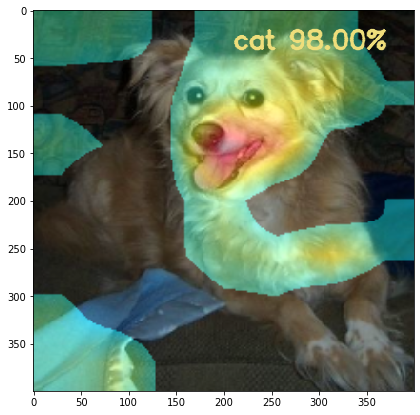

In [48]:
def getCAM(image, feature_maps, weights, display=False):
    
    predict = predict_on_weights(feature_maps, weights)
    
    # Weighted Feature Map
    cam = (predict - 0.5) * np.matmul(feature_maps, weights)
    # Normalize
    cam = (cam - cam.min()) / (cam.max() - cam.min())
    # Resize as image size
    cam_resize = cv2.resize(cam, (224, 224))
    # Format as CV_8UC1 (as applyColorMap required)
    cam_resize = 255 * cam_resize
    cam_resize = cam_resize.astype(np.uint8)
    # Get Heatmap
    heatmap = cv2.applyColorMap(cam_resize, cv2.COLORMAP_JET)
    # Zero out
    heatmap[np.where(cam_resize <= 100)] = 0
    
    out = cv2.addWeighted(src1=image, alpha=0.8, src2=heatmap, beta=0.4, gamma=0)
    out = cv2.resize(out, dsize=(400, 400))
    
    if predict < 0.5:
        text = 'cat %.2f%%' % (100 - predict * 100)
    else:
        text = 'dog %.2f%%' % (predict * 100)
        
    cv2.putText(out, text, (210, 40), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, 
                  color=(123,222,238), thickness=2, lineType=cv2.LINE_AA)
    if display:
        plt.figure(figsize=(7, 7))
        plt.imshow(out[:, :, ::-1])
        plt.show()
    return out


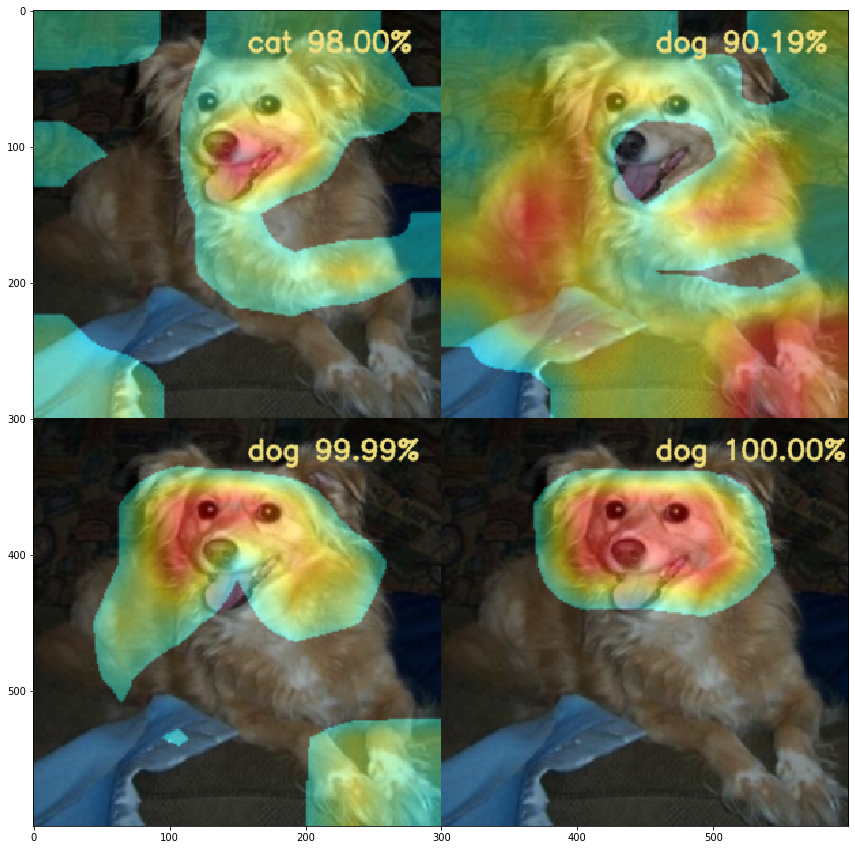

In [52]:
def batch_CAM_weight(idx):
    weight_idx = 1
    result = None
    for j in range(2):
        for i in range(2):
            src = data[idx][:, :, ::-1]
            out_base = base_model.predict(np.expand_dims(src, axis=0))
            out_base = out_base[0]
            out = getCAM(image=src, feature_maps=out_base, weights=weights_history[weight_idx])
            out = cv2.resize(out, dsize=(300, 300))
            if i > 0:
                canvas = np.concatenate((canvas, out), axis=1)
            else:
                canvas = out
            weight_idx = weight_idx * 10
        if j > 0:
            result = np.concatenate((result, canvas), axis=0)
        else:
            result = canvas
    return result

plt.figure(figsize=(15, 15))
plt.imshow(batch_CAM_weight(24303)[:, :, ::-1])
plt.show()

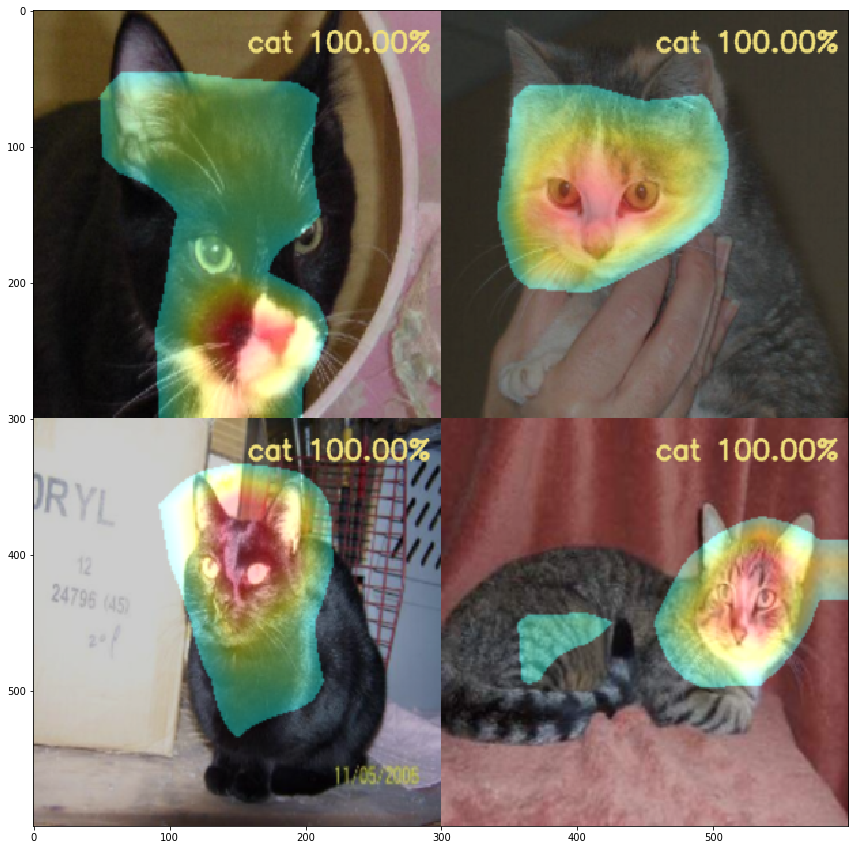

(600, 600, 3)

In [25]:
def batch_CAM(weights):
    idx = 10000
    result = None
    for j in range(2):
        for i in range(2):
            idx += 1
            src = data[idx][:, :, ::-1]
            out_base = base_model.predict(np.expand_dims(src, axis=0))
            out_base = out_base[0]
            out = getCAM(image=src, feature_maps=out_base, weights=weights)
            out = cv2.resize(out, dsize=(300, 300))
            if i > 0:
                canvas = np.concatenate((canvas, out), axis=1)
            else:
                canvas = out
        if j > 0:
            result = np.concatenate((result, canvas), axis=0)
        else:
            result = canvas
    return result

plt.figure(figsize=(15, 15))
plt.imshow(batch_CAM(weights_history[1111])[:, :, ::-1])
plt.show()
batch_CAM(weights_history[0]).shape

In [27]:
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('output_batch_1.mp4',fourcc, 20.0, (600, 600))

for weight in tqdm(weights_history):
    img = batch_CAM(weight)
    out.write(img)
#     cv2.imshow('frame', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

out.release()
cv2.destroyAllWindows()

100%|██████████████████████████████████████████████████████████████████████████████| 1250/1250 [00:51<00:00, 24.47it/s]


In [20]:
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('output4.mp4',fourcc, 20.0, (400, 400))
src = data[20000][:, :, ::-1]

for weight in weights_history:
    img = getCAM(image=src, feature_maps=out_base, weights=weight)
    out.write(img)
    cv2.imshow('frame', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

out.release()
cv2.destroyAllWindows()